In [ ]:
!pip install pyreadstat # Install pyreadstat to read the sas files

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 16.0 MB/s eta 0:00:00


In [ ]:
!pip install tabulate # Install tabulate to print the output in tabualr form

In [ ]:
import pyreadstat # Import pyreadstat to load sas format datasets
import pandas as pd # For analysis and manipulation
import numpy as np # For analysis and manipulation
from tabulate import tabulate # To print the outcome in table format
from sklearn.preprocessing import LabelEncoder # For labelling the categorical variables
from sklearn.impute import KNNImputer # For handling the missing values
from scipy.stats import ttest_ind, pearsonr # To run t-test and to calculate the correlation coefficient
from sklearn.impute import SimpleImputer # To impute the missing values

In [ ]:
from google.colab import drive # to load files from drive
drive.mount('/content/drive/')

Mounted at /content/drive/


# Load the HINTS6 dataset

In [ ]:
# Load HINTS6 dataset and set survey variable to 1
HINTS6, meta = pyreadstat.read_sas7bdat('/content/drive/MyDrive/hints6_public.sas7bdat')

# Add 'AgeDx' to HINTS6 dataset to match with all datasets
HINTS6['AgeDX'] = HINTS6['WhenDiagnosedCancer']

# Rename the columns to match with the other datasets
HINTS6.rename(columns = {'STRATUM':'Stratum','HadTest3_NotHad':'NeverHadGeneticTest'}, inplace = True)

# Print number of rows and columns of the dataset
print(HINTS6.shape)

# Print all the columns of HINTS6 dataset
print(HINTS6.columns.tolist())

(6252, 478)
['HHID', 'APP_REGION', 'DRA', 'Treatment_H6', 'RUC2003', 'RUC2013', 'PR_RUCA_2010', 'NCHSURCODE2013', 'CENSDIV', 'CENSREG', 'Stratum', 'VAR_STRATUM', 'VAR_CLUSTER', 'FORMTYPE', 'LANGUAGE_FLAG', 'updatedate', 'PROMPT', 'NR_FUFLG', 'ADULTSINHH', 'MAILHHADULTS', 'SeekCancerInfo', 'CancerLotOfEffort', 'CancerFrustrated', 'CancerConcernedQuality', 'CancerTooHardUnderstand', 'CancerTrustDoctor', 'CancerTrustFamily', 'CancerTrustGov', 'CancerTrustCharities', 'CancerTrustReligiousOrgs', 'CancerTrustScientists', 'HealthRecsConflict', 'HealthRecsChange', 'UseInternet', 'Internet_DialUp', 'Internet_HighSpeed', 'Internet_Cell', 'Electronic2_HealthInfo', 'Electronic2_MessageDoc', 'Electronic2_TestResults', 'Electronic2_MadeAppts', 'InternetConnection', 'ConfidentInternetHealth', 'HaveDevice_Tablet', 'HaveDevice_SmartPh', 'HaveDevice_CellPh', 'HaveDevice_None', 'HAVEDEVICE_CAT', 'UsedHealthWellnessApps2', 'WearableDevTrackHealth', 'FreqWearDevTrackHealth', 'WillingShareData_HCP', 'Willin

# Load the HINTS5CYCLE4 dataset

In [ ]:
# Load HINTS5CYCLE4 dataset and set survey variable to 2
HINTS5CYCLE4, meta = pyreadstat.read_sas7bdat('/content/drive/MyDrive/hints5_cycle4_public.sas7bdat')

# Print the number or rows and columns of the dataset
print(HINTS5CYCLE4.shape)

# Print all the columns of HINTS5CYCLE4 dataset
print(HINTS5CYCLE4.columns.tolist())

(3865, 433)
['HHID', 'Stratum', 'APP_REGION', 'DRA', 'Treatment_H5C4', 'RUC2013', 'PR_RUCA_2010', 'NCHSURCODE2013', 'CENSDIV', 'CENSREG', 'VAR_STRATUM', 'VAR_CLUSTER', 'Language_Flag', 'UpdateDate', 'Pandemic', 'AdultsInHH', 'MailHHAdults', 'SeekCancerInfo', 'CancerLotOfEffort', 'CancerFrustrated', 'CancerConfidentGetHealthInf', 'CancerTrustDoctor', 'CancerTrustFamily', 'CancerTrustGov', 'CancerTrustCharities', 'CancerTrustReligiousOrgs', 'StrongNeedCancerInfo', 'StrongNeedCancerInfo_OS', 'UseInternet', 'Internet_DialUp', 'Internet_BroadBnd', 'Internet_Cell', 'Internet_WiFi', 'WhereUseInternet_Home', 'WhereUseInternet_Work', 'WhereUseInternet_PublicPlace', 'WhereUseInternet_MobileDevice', 'InternetSpeed', 'Electronic_SelfHealthInfo', 'Electronic_TalkDoctor', 'Electronic_TestResults', 'Electronic_MadeAppts', 'HaveDevice_Tablet', 'HaveDevice_SmartPh', 'HaveDevice_CellPh', 'HaveDevice_None', 'HaveDevice_Cat', 'TabletHealthWellnessApps', 'UsedHealthWellnessApps', 'Tablet_AchieveGoal', 'Tab

In [ ]:
# Rename columns in HINTS5CYCLE4 to match with other dataset
HINTS5CYCLE4.rename(columns = {'GenderC':'BirthGender','HealthInsurance':'HealthInsurance2', 'Electronic_SelfHealthInfo':'Electronic2_HealthInfo',
                              'FamilyEverHadCancer':'FamilyEverHadCancer2','AdultsInHH':'ADULTSINHH','ProviderMaintainEMR2':'ProviderMaintainEMR'
                              ,'OfferedAccessHCP2':'OfferedAccessHCP3','OfferedAccessInsurer2':'OfferedAccessInsurer3',
                               'HadTest2_None':'NeverHadGeneticTest', 'IntRsn_VisitedSocNet': 'SocMed_Visited', 'IntRsn_SharedSocNet': 'SocMed_SharedPers','IntRsn_YouTube': 'SocMed_WatchedVid',
                               'IntRsn_SupportGroup': 'SocMed_Interacted','Electronic_TestResults':'Electronic2_TestResults',
                               'Electronic_MadeAppts':'Electronic2_MadeAppts','UsedHealthWellnessApps':'UsedHealthWellnessApps2',
                               'WillingShareData_YourFamily':'WillingShareData_Fam'}, inplace = True)

# Add RUC2003 to HINTS5CYCLE4 dataset
HINTS5CYCLE4['RUC2003']=HINTS5CYCLE4['RUC2013']

In [ ]:
# Print all the columns of HINTS5CYCLE4 dataset
print(HINTS5CYCLE4.columns.tolist())

['HHID', 'Stratum', 'APP_REGION', 'DRA', 'Treatment_H5C4', 'RUC2013', 'PR_RUCA_2010', 'NCHSURCODE2013', 'CENSDIV', 'CENSREG', 'VAR_STRATUM', 'VAR_CLUSTER', 'Language_Flag', 'UpdateDate', 'Pandemic', 'ADULTSINHH', 'MailHHAdults', 'SeekCancerInfo', 'CancerLotOfEffort', 'CancerFrustrated', 'CancerConfidentGetHealthInf', 'CancerTrustDoctor', 'CancerTrustFamily', 'CancerTrustGov', 'CancerTrustCharities', 'CancerTrustReligiousOrgs', 'StrongNeedCancerInfo', 'StrongNeedCancerInfo_OS', 'UseInternet', 'Internet_DialUp', 'Internet_BroadBnd', 'Internet_Cell', 'Internet_WiFi', 'WhereUseInternet_Home', 'WhereUseInternet_Work', 'WhereUseInternet_PublicPlace', 'WhereUseInternet_MobileDevice', 'InternetSpeed', 'Electronic2_HealthInfo', 'Electronic_TalkDoctor', 'Electronic2_TestResults', 'Electronic2_MadeAppts', 'HaveDevice_Tablet', 'HaveDevice_SmartPh', 'HaveDevice_CellPh', 'HaveDevice_None', 'HaveDevice_Cat', 'TabletHealthWellnessApps', 'UsedHealthWellnessApps2', 'Tablet_AchieveGoal', 'Tablet_MakeDeci

# HINTS5CYCLE3 Dataset

In [ ]:
# Load HINTS5CYCLE3 dataset and set survey variable to 3
HINTS5CYCLE3, meta = pyreadstat.read_sas7bdat('/content/drive/MyDrive/hints5_cycle3_public.sas7bdat')

# Print the number of rows and columns of HINTS5CYCLE3 dataset
print(HINTS5CYCLE3.shape)

# Printing all the columnms of HINTS5CYCLE3 dataset
print(HINTS5CYCLE3.columns.tolist())

(5438, 725)
['HHID', 'Stratum', 'APP_REGION', 'RUC2003', 'RUC2013', 'PR_RUCA_2010', 'SEC_RUCA_2010', 'DRA', 'Treatment_H5C3', 'NCHSURCODE2013', 'CENSDIV', 'CENSREG', 'VAR_STRATUM', 'VAR_CLUSTER', 'FormType', 'Language_Flag', 'UpdateDate', 'AdultsInHH', 'MailHHAdults', 'SeekHealthInfo', 'WhereSeekHealthInfo', 'WhoLookingFor', 'LotOfEffort', 'Frustrated', 'ConfidentGetHealthInf', 'TrustDoctor', 'TrustFamily', 'TrustGov', 'TrustCharities', 'TrustReligiousOrgs', 'StrongNeedHealthInfo', 'StrongNeedHealthInfo_OS', 'SeekCancerInfo', 'UseInternet', 'Internet_DialUp', 'Internet_BroadBnd', 'Internet_Cell', 'Internet_WiFi', 'InternetCancerInfoSelf', 'WhereUseInternet_Home', 'WhereUseInternet_Work', 'WhereUseInternet_PublicPlace', 'WhereUseInternet_MobileDevice', 'Electronic_SelfHealthInfo', 'Electronic_BuyMedicine', 'Electronic_TalkDoctor', 'Electronic_TrackedHealthCosts', 'Electronic_TestResults', 'Electronic_MadeAppts', 'Electronic_ECigHarms', 'HaveDevice_Tablet', 'HaveDevice_SmartPh', 'HaveDev

In [ ]:
# Rename columns in HINTS5CYCLE3 to match with HINTS6 dataset
HINTS5CYCLE3.rename(columns = {'GenderC':'BirthGender', 'Electronic_SelfHealthInfo':'Electronic2_HealthInfo',
                               'HealthInsurance':'HealthInsurance2', 'FamilyEverHadCancer':'FamilyEverHadCancer2',
                            'LotOfEffort':'CancerLotOfEffort', 'Frustrated':'CancerFrustrated','AdultsInHH':'ADULTSINHH',
                           'ConcernedQuality':'CancerConcernedQuality','TooHardUnderstand':'CancerTooHardUnderstand',
                           'ProviderMaintainEMR2':'ProviderMaintainEMR',
                           'TrustDoctor':'CancerTrustDoctor','TrustFamily':'CancerTrustFamily','TrustGov':'CancerTrustGov',
                           'TrustCharities':'CancerTrustCharities','TrustReligiousOrgs':'CancerTrustReligiousOrgs',
                           'OfferedAccessHCP2':'OfferedAccessHCP3','OfferedAccessInsurer2':'OfferedAccessInsurer3',
                           'HadTest_NeverHad':'NeverHadGeneticTest',
                               'IntRsn_VisitedSocNet': 'SocMed_Visited', 'IntRsn_SharedSocNet': 'SocMed_SharedPers','IntRsn_YouTube': 'SocMed_WatchedVid',
                               'IntRsn_SupportGroup': 'SocMed_Interacted','Electronic_TestResults':'Electronic2_TestResults',
                               'Electronic_MadeAppts':'Electronic2_MadeAppts'}, inplace = True)

In [ ]:
# Print the updated columns in HINTS5CYCLE3 dsataset
print(HINTS5CYCLE3.columns.tolist())

['HHID', 'Stratum', 'APP_REGION', 'RUC2003', 'RUC2013', 'PR_RUCA_2010', 'SEC_RUCA_2010', 'DRA', 'Treatment_H5C3', 'NCHSURCODE2013', 'CENSDIV', 'CENSREG', 'VAR_STRATUM', 'VAR_CLUSTER', 'FormType', 'Language_Flag', 'UpdateDate', 'ADULTSINHH', 'MailHHAdults', 'SeekHealthInfo', 'WhereSeekHealthInfo', 'WhoLookingFor', 'CancerLotOfEffort', 'CancerFrustrated', 'ConfidentGetHealthInf', 'CancerTrustDoctor', 'CancerTrustFamily', 'CancerTrustGov', 'CancerTrustCharities', 'CancerTrustReligiousOrgs', 'StrongNeedHealthInfo', 'StrongNeedHealthInfo_OS', 'SeekCancerInfo', 'UseInternet', 'Internet_DialUp', 'Internet_BroadBnd', 'Internet_Cell', 'Internet_WiFi', 'InternetCancerInfoSelf', 'WhereUseInternet_Home', 'WhereUseInternet_Work', 'WhereUseInternet_PublicPlace', 'WhereUseInternet_MobileDevice', 'Electronic2_HealthInfo', 'Electronic_BuyMedicine', 'Electronic_TalkDoctor', 'Electronic_TrackedHealthCosts', 'Electronic2_TestResults', 'Electronic2_MadeAppts', 'Electronic_ECigHarms', 'HaveDevice_Tablet', '

# Append the datasets

In [ ]:
# Merge dataserts(all 3 cycles datasets) with all variables
HINTS_Merged= pd.concat([HINTS5CYCLE4,HINTS5CYCLE3,HINTS6], ignore_index = True)

# Print the number of rows and columns of the merged dataset
print(HINTS_Merged.shape)

# # Print the updated columns in Hintmerged_df dsataset
print(HINTS_Merged.columns.tolist())

(15555, 1139)
['HHID', 'Stratum', 'APP_REGION', 'DRA', 'Treatment_H5C4', 'RUC2013', 'PR_RUCA_2010', 'NCHSURCODE2013', 'CENSDIV', 'CENSREG', 'VAR_STRATUM', 'VAR_CLUSTER', 'Language_Flag', 'UpdateDate', 'Pandemic', 'ADULTSINHH', 'MailHHAdults', 'SeekCancerInfo', 'CancerLotOfEffort', 'CancerFrustrated', 'CancerConfidentGetHealthInf', 'CancerTrustDoctor', 'CancerTrustFamily', 'CancerTrustGov', 'CancerTrustCharities', 'CancerTrustReligiousOrgs', 'StrongNeedCancerInfo', 'StrongNeedCancerInfo_OS', 'UseInternet', 'Internet_DialUp', 'Internet_BroadBnd', 'Internet_Cell', 'Internet_WiFi', 'WhereUseInternet_Home', 'WhereUseInternet_Work', 'WhereUseInternet_PublicPlace', 'WhereUseInternet_MobileDevice', 'InternetSpeed', 'Electronic2_HealthInfo', 'Electronic_TalkDoctor', 'Electronic2_TestResults', 'Electronic2_MadeAppts', 'HaveDevice_Tablet', 'HaveDevice_SmartPh', 'HaveDevice_CellPh', 'HaveDevice_None', 'HaveDevice_Cat', 'TabletHealthWellnessApps', 'UsedHealthWellnessApps2', 'Tablet_AchieveGoal', 'T

In [ ]:
# Get the set of columns from each dataset
columns_hints6 = set(HINTS6.columns)
columns_hints5_cycle4 = set(HINTS5CYCLE4.columns)
columns_hints5_cycle3 = set(HINTS5CYCLE3.columns)

# Find common variables across all three datasets
common_variables = columns_hints6.intersection(columns_hints5_cycle4, columns_hints5_cycle3)

# Print the common variables
print("Common Variables among HINTS6, HINTS5CYCLE4, and HINTS5CYCLE3:")
print(common_variables)

# Print the total number of common variables
print(f"\nTotal Number of Common Variables: {len(common_variables)}")

Common Variables among HINTS6, HINTS5CYCLE4, and HINTS5CYCLE3:
{'RecordsOnline_ViewResults', 'SharedHealthDeviceInfo', 'WhenPapTest', 'TalkHealthFriends', 'CaEndometrial', 'CaLung', 'InvolvedDecisions', 'UseInternet', 'GeneralHealth', 'OfferedAccessHCP3', 'WhenDiagnosedCancer', 'Electronic2_HealthInfo', 'PreventNotPossible', 'CancerTrustDoctor', 'CaOvarian', 'EducB', 'EducA', 'HeardHPVVaccine2', 'WeeklyMinutesModerateExercise', 'CaOther_OS', 'OthHisp', 'Caregiving_Cancer', 'VAR_STRATUM', 'SmokeNow', 'RecordsOnline_DownloadHealth', 'HHID', 'Electronic2_TestResults', 'MedConditions_LungDisease', 'FeelingsAddressed', 'Weight', 'CENSREG', 'Height_Feet', 'SocMed_Visited', 'CENSDIV', 'Caregiving_Professional', 'UsedECigEver', 'NCHSURCODE2013', 'CaProstate', 'Internet_Cell', 'CaOral', 'Deaf', 'MedConditions_HeartCondition', 'NotHisp', 'HHInc', 'Caregiving_Other', 'Smoke100', 'CancerLotOfEffort', 'UseECigNow', 'Caregiving_Friend', 'OthAsian', 'Electronic2_MadeAppts', 'CaBone', 'Filipino', 'Mex

# Function to add the column name ChronicConditioin

In [ ]:
def define_chronic_condition(df):
    # Define the columns to check for chronic conditions
    chronic_columns = [
        "MedConditions_Diabetes",
        "MedConditions_HighBP",
        "MedConditions_HeartCondition",
        "MedConditions_LungDisease",
        "MedConditions_Depression"
    ]

    # Replace negative values with NaN to handle missing data
    # df[chronic_columns] = df[chronic_columns].replace([-9,-8, -7, -1], pd.NA)

    # Define chronic condition:
    # 1 if any of the conditions are 1, otherwise 0 (if all are 2)
    df["ChronicCondition"] = df[chronic_columns].apply(
        lambda row: 1 if (row == 1).any() else (0 if (row == 2).all() else pd.NA), axis=1
    )

    # Drop rows with missing data in ChronicCondition
    df = df.dropna(subset=["ChronicCondition"])

    return df

# Apply the function to the dataset
HINTS6 = define_chronic_condition(HINTS6)
HINTS5CYCLE4 = define_chronic_condition(HINTS5CYCLE4)
HINTS5CYCLE3 = define_chronic_condition(HINTS5CYCLE3)
HINTYS_Merged = define_chronic_condition(HINTS_Merged)

# Distributioin of the outcome variable

In [ ]:
# Calculate the counts
counts1 = HINTS6['ChronicCondition'].value_counts()

# Calculate the percentages
percentages1 = HINTS6['ChronicCondition'].value_counts(normalize=True) * 100

# Display the results
total_values1 = pd.DataFrame({'Count': counts1, 'Percentage': percentages1})
print(total_values1)

                  Count  Percentage
ChronicCondition                   
1                  3998   66.544607
0                  2010   33.455393


In [ ]:
# Calculate the counts
counts1 = HINTS5CYCLE4['ChronicCondition'].value_counts()

# Calculate the percentages
percentages1 = HINTS5CYCLE4['ChronicCondition'].value_counts(normalize=True) * 100

# Display the results
total_values1 = pd.DataFrame({'Count': counts1, 'Percentage': percentages1})
print(total_values1)

                  Count  Percentage
ChronicCondition                   
1                  2525    66.32519
0                  1282    33.67481


In [ ]:
# Calculate the counts
counts1 = HINTS5CYCLE3['ChronicCondition'].value_counts()

# Calculate the percentages
percentages1 = HINTS5CYCLE3['ChronicCondition'].value_counts(normalize=True) * 100

# Display the results
total_values1 = pd.DataFrame({'Count': counts1, 'Percentage': percentages1})
print(total_values1)

                  Count  Percentage
ChronicCondition                   
1                  3412   64.244022
0                  1899   35.755978


In [ ]:
# Calculate the counts
counts1 = HINTS_Merged['ChronicCondition'].value_counts()

# Calculate the percentages
percentages1 = HINTS_Merged['ChronicCondition'].value_counts(normalize=True) * 100

# Display the results
total_values1 = pd.DataFrame({'Count': counts1, 'Percentage': percentages1})
print(total_values1)

                  Count  Percentage
ChronicCondition                   
1                  9935   65.681608
0                  5191   34.318392


# Feature Extraction from Key Health and Behavioral Domains

In [ ]:
# Selecting the features manually from differernt sections (Demographic, Health Information, Using Internet to find the information,
# Health care and overall Health, Medical Records, Physical Activity and Exercise, Smoking factors)
features_to_select = [
    "SeekCancerInfo", "CancerLotOfEffort", "CancerFrustrated", "CancerConfidentGetHealthInf",
    "CancerTrustDoctor", "CancerTrustFamily", "CancerTrustGov", "CancerTrustCharities",
    "CancerTrustReligiousOrgs", "StrongNeedCancerInfo", "UseInternet", "Internet_DialUp",
    "Internet_BroadBnd", "Internet_Cell", "Internet_WiFi", "WhereUseInternet_Home",
    "WhereUseInternet_Work", "WhereUseInternet_PublicPlace", "WhereUseInternet_MobileDevice",
    "InternetSpeed", "Electronic2_HealthInfo", "Electronic_TalkDoctor", "Electronic2_TestResults",
    "Electronic2_MadeAppts", "HaveDevice_Tablet", "HaveDevice_SmartPh", "HaveDevice_CellPh",
    "HaveDevice_None", "TabletHealthWellnessApps", "UsedHealthWellnessApps2",
    "Tablet_AchieveGoal", "Tablet_MakeDecision", "Tablet_DiscussionsHCP", "WearableDevTrackHealth",
    "FreqWearDevTrackHealth", "WillingShareData_HCP", "WillingShareData_Fam",
    "WillingShareData_YourFriends", "SharedHealthDeviceInfo", "SocMed_Visited",
    "SocMed_SharedPers", "SocMed_Interacted", "SocMed_WatchedVid", "RegularProvider",
    "FreqGoProvider", "QualityCare", "ChanceAskQuestions", "FeelingsAddressed",
    "InvolvedDecisions", "UnderstoodNextSteps", "ExplainedClearly", "SpentEnoughTime",
    "HelpUncertainty", "ProbCare_BringTest", "ProbCare_WaitLong", "ProbCare_RedoTest",
    "ProbCare_ProvideHist", "HealthIns_InsuranceEmp", "HealthIns_InsurancePriv",
    "HealthIns_Medicare", "HealthIns_Medicaid", "HealthIns_Tricare", "HealthIns_VA",
    "HealthIns_IHS", "HealthIns_Other", "HealthInsurance2", "ProviderMaintainEMR",
    "OfferedAccessHCP3", "OfferedAccessInsurer3", "HCPEncourageOnlineRec", "AccessOnlineRecord",
    "NotAccessed_SpeakDirectly", "NotAccessed_NoInternet", "NotAccessed_NoNeed",
    "NotAccessed_ConcernedPrivacy", "NotAccessed_NoRecord", "NotAccessed_LogInProb",
    "NotAccessed_Uncomfortable", "NotAccessed_MultipleRec", "RecordsOnline_ViewResults",
    "RecordsOnline_MessageHCP", "RecordsOnline_DownloadHealth", "HowAccessOnlineRecord",
    "OnlineRecClinNotes", "ESent_AnotherHCP", "ESent_Family", "ESent_HealthApp",
    "UnderstandOnlineMedRec", "GeneralHealth", "OwnAbilityTakeCareHealth", "Deaf",
    "TalkHealthFriends", "MedConditions_Diabetes", "MedConditions_HighBP",'RUC2003',
    "MedConditions_HeartCondition", "MedConditions_LungDisease", "MedConditions_Depression",
    "Height_Feet", "Height_Inches", "Weight", "LittleInterest", "Hopeless", "Nervous",
    "Worrying", "Threatened_Values", "Threatened_Strengths", "ExpectWorst",
    "MostImportantValues", "TimesModerateExercise", "HowLongModerateExerciseMinutes",
    "TimesStrengthTraining", "AverageTimeSitting", "Smoke100", "SmokeNow", "ElectCigLessHarm",
    "UsedECigEver", "UseECigNow", "Age", "BirthGender", "Occupation_Employed",
    "MaritalStatus", "Education", "AgeGrpB", "HHInc", "BMI", "smokeStat",
    "SeekHealthInfo", "WhereSeekHealthInfo", "WhoLookingFor", "ConfidentGetHealthInf",
    "StrongNeedHealthInfo", "InternetCancerInfoSelf", "Electronic_BuyMedicine",
    "Electronic_TrackedHealthCosts", "Electronic_ECigHarms", "OtherDevTrackHealth2",
    "IntRsn_WroteBlog", "TextFromDoctor", "FreqGoUrgentCare", "QualityCareUrgentCare",
    "RecordsOnline_RefillMeds", "RecordsOnline_RequestCorrection", 'WeeklyMinutesModerateExercise',
    "RecordsOnline_AddHealthInfo", "RecordsOnline_MakeDecision", "AccessUsingHealthApp",
    "UsefulOnlineMedRec", "EnjoyExercise", "RegExercise_Pressure", "RegExercise_Appearance",
    "RegExercise_Guilt", "RegExercise_Enjoyment", "GovPARec_HCP", "GovPARec_Internet",
    "GovPARec_TV", "GovPARec_Magazine", "ExRec_IncreasedEx", "ExRec_DecreasedEx",
    "ExRec_ChangedEx", "ExRec_LookedInfo", "ExRec_NoChange", "ExRec_NotHeard",
    "PhysAct_HelpSleep", "PhysAct_ReduceAnxiety", "PhysAct_ReducePain", "AverageSleepNight",
    "AverageSleepQuality", "MorningNightPerson", "CancerConcernedQuality",
    "CancerTooHardUnderstand", "CancerTrustScientists", "HealthRecsConflict",
    "HealthRecsChange", "Internet_HighSpeed", "Electronic2_MessageDoc", "InternetConnection",
    "ConfidentInternetHealth", "HAVEDEVICE_CAT", "SocMed_SharedGen", "MisleadingHealthInfo",
    "SocMed_MakeDecisions", "SocMed_DiscussHCP", "SocMed_TrueFalse", "SocMed_SameViews",
    "ResponsibleReduceMisInf", "BringTest", "DelayNeededCare", "ConfidentMedForms",
    "TrustHCSystem", "DiscriminatedMedCare", "HCPEncourageOnlineRec2", "AccessOnlineRecord2",
    "HowAccessOnlineRecord2", "RecordsOnline_Send3rdParty", "RecordsOnline_ViewNotes",
    "UnderstandOnlineMedRec2", "OnlinePortal_PCP", "OnlinePortal_OthHCP",
    "OnlinePortal_Insurer", "OnlinePortal_Lab", "OnlinePortal_Pharmacy", "OnlinePortal_NoRec",
    "ONLINEPORTAL_CAT", "MultipleOnlinePortals", "UsedPortalOrganizerApp",
    "UndMedicalStats", "ClearSenseDir", "DeepFulfillment", "LifeHasPurpose",
    "FeelLeftOut", "FeelPeopleBarelyKnow", "FeelIsolated", "FeelPeopleNotWithMe",
    "ChronicCondition", "RaceEthn"
]
# Select only the specified features from the HINTS_Merged dataset
HINTS_Modified = HINTS_Merged[features_to_select].copy()

# Display the first few rows to verify
print(HINTS_Modified.head())

   SeekCancerInfo  CancerLotOfEffort  CancerFrustrated  \
0             1.0                3.0               3.0   
1             1.0                3.0               3.0   
2             1.0                3.0               4.0   
3             1.0                2.0               2.0   
4             2.0               -1.0              -1.0   

   CancerConfidentGetHealthInf  CancerTrustDoctor  CancerTrustFamily  \
0                          3.0                1.0                2.0   
1                          1.0                2.0                3.0   
2                          1.0                2.0                2.0   
3                          3.0                2.0                2.0   
4                          2.0                1.0                1.0   

   CancerTrustGov  CancerTrustCharities  CancerTrustReligiousOrgs  \
0             2.0                   2.0                       3.0   
1             3.0                   3.0                       4.0   
2          

In [ ]:
HINTS_Modified.shape

(15555, 216)

# Identifying the categorical variables

In [ ]:
# Identify categorical variables if they are stored as 'object' dtype
categorical_columns = HINTS_Modified.select_dtypes(include=['object']).columns.tolist()

# Print the categorical variables
print("Categorical variables HINTS_Merged:")
print(categorical_columns)

# Print the total number of categorical variables
print(f"Total number of categorical variables: {len(categorical_columns)}")

Categorical variables HINTS_Merged:
['ChronicCondition']
Total number of categorical variables: 1


In [ ]:
# Filter the dataset to keep only rows where the target variable is 1 or 0
HINTS_Modified = HINTS_Modified[HINTS_Modified['ChronicCondition'].isin([1, 0])]

In [ ]:
HINTS_Modified['ChronicCondition'].unique()

array([1, 0], dtype=object)

In [ ]:
# Merge categories for RaceEthn: 4, 6, and 7 to 8
HINTS_Modified.loc[:, 'RaceEthn'] = HINTS_Modified['RaceEthn'].replace({4: 8, 6: 8, 7: 8})

In [ ]:
# Convert 'MaritalStatus' into a binary with -1 preserved (Married = 1, missing = -1, and all others = 0)
HINTS_Modified.loc[:, 'MaritalStatus'] = HINTS_Modified['MaritalStatus'].apply(lambda x: 1 if x == 1 else (-1 if x == -1 else 0))

# Verify the conversion
print(HINTS_Modified['MaritalStatus'].value_counts())

MaritalStatus
0.0    8170
1.0    6956
Name: count, dtype: int64


# Converting the RaceEthn into binary

In [ ]:
HINTS_Modified.loc[HINTS_Modified['RaceEthn'] == 1, 'RaceEthn_Hispanic'] = 1
HINTS_Modified.loc[HINTS_Modified['RaceEthn'] != 1, 'RaceEthn_Hispanic'] = 0

HINTS_Modified.loc[HINTS_Modified['RaceEthn'] == 2, 'RaceEthn_White'] = 1
HINTS_Modified.loc[HINTS_Modified['RaceEthn'] != 2, 'RaceEthn_White'] = 0

HINTS_Modified.loc[HINTS_Modified['RaceEthn'] == 3, 'RaceEthn_Black'] = 1
HINTS_Modified.loc[HINTS_Modified['RaceEthn'] != 3, 'RaceEthn_Black'] = 0

HINTS_Modified.loc[HINTS_Modified['RaceEthn'] == 5, 'RaceEthn_Asian'] = 1
HINTS_Modified.loc[HINTS_Modified['RaceEthn'] != 5, 'RaceEthn_Asian'] = 0

HINTS_Modified.loc[HINTS_Modified['RaceEthn'] == 8, 'RaceEthn_Others'] = 1
HINTS_Modified.loc[HINTS_Modified['RaceEthn'] != 8, 'RaceEthn_Others'] = 0

In [ ]:
# Drop the RaceEthn from the HINTS6 dataset
HINTS_Modified.drop(columns=['RaceEthn'], inplace=True)

In [ ]:
# Replace 91 to -1 for the variables StrongNeedCancerInfo, StrongNeedHealthInfo, ResponsibleReduceMisInf on the HINTS_Modified dataset
HINTS_Modified['StrongNeedCancerInfo'] = HINTS_Modified['StrongNeedCancerInfo'].replace(91, -1)
HINTS_Modified['StrongNeedHealthInfo'] = HINTS_Modified['StrongNeedHealthInfo'].replace(91, -1)
HINTS_Modified['ResponsibleReduceMisInf'] = HINTS_Modified['ResponsibleReduceMisInf'].replace(91, -1)

# Detail Missing value Analysis

In [ ]:
# Define the missing value codes and their corresponding labels
missing_value_codes = {
    -9: 'Missing Value',
    -6: 'Filter Missing',
    -5: 'Multiple Response',
    -4: 'Unreadable',
    -2: 'Question Answered in Error',
    -1: 'Inapplicable'
}

# Initialize a list to store the results
missing_summary = []

# Iterate through each column in the dataset and calculate missing statistics
for column in HINTS_Modified.columns:
    missing_counts = {
        'Variable': column,
        'Missing Value': (HINTS_Modified[column] == -9).sum(),
        'Filter Missing': (HINTS_Modified[column] == -6).sum(),
        'Multiple Response': (HINTS_Modified[column] == -5).sum(),
        'Unreadable': (HINTS_Modified[column] == -4).sum(),
        'Question Answered in Error': (HINTS_Modified[column] == -2).sum(),
        'Inapplicable': (HINTS_Modified[column] == -1).sum(),
    }
    # Fix: Convert dict_values to list for slicing
    missing_counts['Total Missing'] = sum(list(missing_counts.values())[1:])
    missing_counts['Percentage Missing'] = (missing_counts['Total Missing'] / len(HINTS_Modified)) * 100
    missing_counts['Percentage Missing'] = missing_counts['Percentage Missing'].round(2)

    missing_summary.append(missing_counts)

# Convert the list to a DataFrame for a tabular view
missing_summary_df = pd.DataFrame(missing_summary)

# Display the first few rows of the result
print(missing_summary_df.tail())

# Save the result to a Excel  file
missing_summary_df.to_excel('Total_missing_values_summary.xlsx', index=False)

              Variable  Missing Value  Filter Missing  Multiple Response  \
215  RaceEthn_Hispanic              0               0                  0   
216     RaceEthn_White              0               0                  0   
217     RaceEthn_Black              0               0                  0   
218     RaceEthn_Asian              0               0                  0   
219    RaceEthn_Others              0               0                  0   

     Unreadable  Question Answered in Error  Inapplicable  Total Missing  \
215           0                           0             0              0   
216           0                           0             0              0   
217           0                           0             0              0   
218           0                           0             0              0   
219           0                           0             0              0   

     Percentage Missing  
215                 0.0  
216                 0.0  
217     

# Approach 1: Handling missing values with -1

In [ ]:
# Replace all negative values with NaN
HINTS_Modified = HINTS_Modified.mask(HINTS_Modified < 0, np.nan)

# Replace all NaN values with -1
HINTS_Modified = HINTS_Modified.fillna(-1)

# Verify if any negative values or NaNs remain
print("Remaining negative values:", (HINTS_Modified < 0).sum().sum())
print("Remaining NaN values:", HINTS_Modified.isna().sum().sum())

Remaining negative values: 1498792
Remaining NaN values: 0


# Variables with no missing values

In [ ]:
# Identify columns that do not contain any -1 values
columns_without_minus_1 = HINTS_Modified.columns[(HINTS_Modified != -1).all()]

# Convert the result to a list for easy viewing or further analysis
columns_without_minus_1_list = columns_without_minus_1.tolist()

# Display the list of columns with no -1 values
print("Columns without any -1 values:")
print(columns_without_minus_1_list)

# Print the total number of columns with no -1 values
print(f"Total number of columns without -1 values: {len(columns_without_minus_1_list)}")

Columns without any -1 values:
['RUC2003', 'MaritalStatus', 'ChronicCondition', 'RaceEthn_Hispanic', 'RaceEthn_White', 'RaceEthn_Black', 'RaceEthn_Asian', 'RaceEthn_Others']
Total number of columns without -1 values: 8


# Checking variables across datasets

In [ ]:
# Dictionary of datasets
datasets = {
    'HINTS5CYCLE4': HINTS5CYCLE4,
    'HINTS5CYCLE3': HINTS5CYCLE3,
    'HINTS6': HINTS6,
}

# List of variables from HINTS_Merged_Cleaned dataset
variables_to_check = HINTS_Modified.columns.tolist()

# Initialize a DataFrame with zeros for presence
variable_presence_df = pd.DataFrame(0, index=variables_to_check, columns=datasets.keys())

# Check presence of variables across datasets
for dataset_name, df in datasets.items():
    for var in variables_to_check:
        if var in df.columns:
            variable_presence_df.loc[var, dataset_name] = 1

# Add a column counting the number of datasets each variable is present in
variable_presence_df['Total_Cycles'] = variable_presence_df.sum(axis=1)

# Calculate missing values from HINTS_Merged dataset
missing_count = (HINTS_Modified == -1).sum(axis=0)
missing_percentage = (missing_count / len(HINTS_Merged)) * 100

# Round the percentage to two decimal places
missing_percentage = missing_percentage.round(2)

# Add missing value counts and percentages to the DataFrame
variable_presence_df['Missing_Values_Count'] = missing_count
variable_presence_df['Missing_Values_Percentage'] = missing_percentage

# Save the combined table to an Excel file
variable_presence_df.to_excel('Final_Data_Variable_Presence_and_Missing_Values.xlsx')

# Display the combined table
print(variable_presence_df.head())

                             HINTS5CYCLE4  HINTS5CYCLE3  HINTS6  Total_Cycles  \
SeekCancerInfo                          1             1       1             3   
CancerLotOfEffort                       1             1       1             3   
CancerFrustrated                        1             1       1             3   
CancerConfidentGetHealthInf             1             0       0             1   
CancerTrustDoctor                       1             1       1             3   

                             Missing_Values_Count  Missing_Values_Percentage  
SeekCancerInfo                                 99                       0.64  
CancerLotOfEffort                            6414                      41.23  
CancerFrustrated                             6601                      42.44  
CancerConfidentGetHealthInf                 11362                      73.04  
CancerTrustDoctor                             266                       1.71  


# calculate the missing values of all the variables

In [ ]:
# Identify the -1 values for each column of the merged dataset
Total_missing_values1 = (HINTS_Modified == -1).sum()

# Filter out the columns with number of -1 values greater than 0
Total_missing_values1= Total_missing_values1[Total_missing_values1 > 0]

# Calculate the percentage of missing values for each column
total_rows = len(HINTS_Modified)
percentage_missing_values1 = (Total_missing_values1 / total_rows) * 100

# Round the percentage to two decimal places
percentage_missing_values1 = percentage_missing_values1.round(2)

# Combine the count and percentage into a DataFrame
missing_values_df = pd.DataFrame({
    'Count_of_-1': Total_missing_values1,
    'Percentage_of_Missing': percentage_missing_values1
})

# Sort the DataFrame by the number of -1 values in ascending order
missing_values_df = missing_values_df.sort_values(by='Count_of_-1', ascending=True)

# Export the information to a CSV file
missing_values_df.to_excel('HINTS_Modified total_missing_values_with_percentage.xlsx', index=True)

# Display the first few rows of the DataFrame
missing_values_df.tail()

,Count_of_-1,Percentage_of_Missing
UseECigNow,13114,86.70
UsedPortalOrganizerApp,13147,86.92
QualityCareUrgentCare,13445,88.89
HowAccessOnlineRecord,13673,90.39
WillingShareData_YourFriends,14080,93.08


# Categorizartion of Binary, Ordinal and Continuous variables

In [ ]:
# Define a function to categorize variables
def categorize_variables(df, continuous_vars_list):
    binary_vars = []
    ordinal_vars = []
    unary_vars = []
    continuous_vars = []

    for col in df.columns:
        # Skip the manually provided continuous variables
        if col in continuous_vars_list:
            continue

        # Replace 2 with 0 for binary variables before collecting unique values
        if set(df[df[col] != -1][col].unique()) == {1, 2}:
            df[col] = df[col].replace({2: 0})

        # Get unique values excluding -1 (missing values) and sort them
        unique_values = sorted(df[df[col] != -1][col].unique())

        # Convert to integers to remove decimals
        unique_values = [int(val) for val in unique_values]

        # Check if the variable has only one unique value (unary variable)
        if len(unique_values) == 1:
            unary_vars.append((col, unique_values))
        elif len(unique_values) == 2:
            # Binary variable (2 unique values)
            binary_vars.append((col, unique_values))
        else:
            # Ordinal variable (more than 2 unique values)
            ordinal_vars.append((col, unique_values))

    # Create a DataFrame for continuous variables with their min and max values
    for col in continuous_vars_list:
        # Filter out the missing values (-1) before calculating min and max
        filtered_col = df[df[col] != -1][col]
        min_value = filtered_col.min()
        max_value = filtered_col.max()
        continuous_vars.append((col, min_value, max_value))

    return binary_vars, ordinal_vars, unary_vars, continuous_vars

# Manually list the continuous variables
continuous_vars_list = ['Weight', 'HowLongModerateExerciseMinutes',
                        'AverageTimeSitting', 'Age', 'BMI', 'WeeklyMinutesModerateExercise',
                         'AverageSleepNight']
# Apply the function to the dataset
binary_vars, ordinal_vars, unary_vars, continuous_vars = categorize_variables(HINTS_Modified, continuous_vars_list)

# Save the binary, ordinal, and continuoius variablkes list on the excel file
binary_vars_df = pd.DataFrame(binary_vars, columns=['Variable', 'Unique_Values'])
ordinal_vars_df = pd.DataFrame(ordinal_vars, columns=['Variable', 'Unique_Values'])
continuous_vars_df = pd.DataFrame(continuous_vars, columns=['Variable', 'Min_Value', 'Max_Value'])

# Save the DataFrames to Excel files
binary_vars_df.to_excel('binary_vars.xlsx', index=False)
ordinal_vars_df.to_excel('ordinal_vars.xlsx', index=False)
continuous_vars_df.to_excel('continuous_vars.xlsx', index=False)

In [ ]:
print(unary_vars)

[]


In [ ]:
print(binary_vars)

[('SeekCancerInfo', [0, 1]), ('UseInternet', [0, 1]), ('Internet_DialUp', [0, 1]), ('Internet_BroadBnd', [0, 1]), ('Internet_Cell', [0, 1]), ('Internet_WiFi', [0, 1]), ('Electronic2_HealthInfo', [0, 1]), ('Electronic_TalkDoctor', [0, 1]), ('Electronic2_TestResults', [0, 1]), ('Electronic2_MadeAppts', [0, 1]), ('HaveDevice_Tablet', [0, 1]), ('HaveDevice_SmartPh', [0, 1]), ('HaveDevice_CellPh', [0, 1]), ('HaveDevice_None', [0, 1]), ('Tablet_AchieveGoal', [0, 1]), ('Tablet_MakeDecision', [0, 1]), ('Tablet_DiscussionsHCP', [0, 1]), ('WearableDevTrackHealth', [0, 1]), ('WillingShareData_HCP', [0, 1]), ('WillingShareData_Fam', [0, 1]), ('WillingShareData_YourFriends', [0, 1]), ('RegularProvider', [0, 1]), ('ProbCare_BringTest', [0, 1]), ('ProbCare_WaitLong', [0, 1]), ('ProbCare_RedoTest', [0, 1]), ('ProbCare_ProvideHist', [0, 1]), ('HealthIns_InsuranceEmp', [0, 1]), ('HealthIns_InsurancePriv', [0, 1]), ('HealthIns_Medicare', [0, 1]), ('HealthIns_Medicaid', [0, 1]), ('HealthIns_Tricare', [0, 

In [ ]:
print(ordinal_vars)

[('CancerLotOfEffort', [1, 2, 3, 4]), ('CancerFrustrated', [1, 2, 3, 4]), ('CancerConfidentGetHealthInf', [1, 2, 3, 4, 5]), ('CancerTrustDoctor', [1, 2, 3, 4]), ('CancerTrustFamily', [1, 2, 3, 4]), ('CancerTrustGov', [1, 2, 3, 4]), ('CancerTrustCharities', [1, 2, 3, 4]), ('CancerTrustReligiousOrgs', [1, 2, 3, 4]), ('StrongNeedCancerInfo', [1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12]), ('WhereUseInternet_Home', [1, 2, 3, 4]), ('WhereUseInternet_Work', [1, 2, 3, 4]), ('WhereUseInternet_PublicPlace', [1, 2, 3, 4]), ('WhereUseInternet_MobileDevice', [1, 2, 3, 4]), ('InternetSpeed', [1, 2, 3, 4, 5]), ('TabletHealthWellnessApps', [1, 2, 3]), ('UsedHealthWellnessApps2', [1, 2, 3]), ('FreqWearDevTrackHealth', [1, 2, 3, 4, 5]), ('SharedHealthDeviceInfo', [1, 2, 3, 4]), ('SocMed_Visited', [1, 2, 3, 4, 5]), ('SocMed_SharedPers', [1, 2, 3, 4, 5]), ('SocMed_Interacted', [1, 2, 3, 4, 5]), ('SocMed_WatchedVid', [1, 2, 3, 4, 5]), ('FreqGoProvider', [0, 1, 2, 3, 4, 5, 6]), ('QualityCare', [1, 2, 3, 4, 5]), ('C

In [ ]:
print(continuous_vars)

[('Weight', 62.0, 500.0), ('HowLongModerateExerciseMinutes', 0.0, 750.0), ('AverageTimeSitting', 0.0, 20.0), ('Age', 18.0, 104.0), ('BMI', 9.4, 79.0), ('WeeklyMinutesModerateExercise', 0.0, 5250.0), ('AverageSleepNight', 0.0, 24.0)]


In [ ]:
# Save the HINTS_Modified datasets in a excel file
HINTS_Modified.to_excel('HINTS_Modified_IMP(-1).xlsx', index=False)

# Distribution of chronic condition

In [ ]:
# Calculate the counts
counts1 = HINTS_Modified['ChronicCondition'].value_counts()

# Calculate the percentages
percentages1 = HINTS_Modified['ChronicCondition'].value_counts(normalize=True) * 100

# Display the results
total_values1 = pd.DataFrame({'Count': counts1, 'Percentage': percentages1})
print(total_values1)

                  Count  Percentage
ChronicCondition                   
1                  9935   65.681608
0                  5191   34.318392


In [ ]:
HINTS_Modified.shape

(15126, 220)

In [ ]:
# Calculate the counts
counts1 = HINTS_Modified['BirthGender'].value_counts()

# Calculate the percentages
percentages1 = HINTS_Modified['BirthGender'].value_counts(normalize=True) * 100

# Display the results
total_values1 = pd.DataFrame({'Count': counts1, 'Percentage': percentages1})
print(total_values1)

             Count  Percentage
BirthGender                   
 0.0          8692   57.463969
 1.0          6043   39.951078
-1.0           391    2.584953


# Machine Learning Algorithms

In [ ]:
# Impport the libraries to run the supervised learning
# Data Preprocessing
import pandas as pd
import numpy as np
import shap # To calculate the shap values
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler, StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from imblearn.over_sampling import SMOTE
from collections import Counter
from sklearn.model_selection import StratifiedKFold
# Import tensorfolw
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from collections import Counter
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score, roc_curve


# Machine Learning Models
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform
from scipy.stats import randint
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import Perceptron
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import GaussianNB

# Model Evaluation
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score, roc_curve
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.model_selection import cross_val_score, KFold

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Random Forest Classifier

In [ ]:
# Load the dataset
df1 = pd.read_excel('/content/drive/MyDrive/HINTS_Modified_IMP(-1).xlsx')

In [ ]:
df1.head()

,SeekCancerInfo,CancerLotOfEffort,CancerFrustrated,CancerConfidentGetHealthInf,CancerTrustDoctor,CancerTrustFamily,CancerTrustGov,CancerTrustCharities,CancerTrustReligiousOrgs,StrongNeedCancerInfo,...,FeelLeftOut,FeelPeopleBarelyKnow,FeelIsolated,FeelPeopleNotWithMe,ChronicCondition,RaceEthn_Hispanic,RaceEthn_White,RaceEthn_Black,RaceEthn_Asian,RaceEthn_Others
0,1,3,3,3,1,2,2,2,3,7,...,-1,-1,-1,-1,1,0,1,0,0,0
1,1,3,3,1,2,3,3,3,4,6,...,-1,-1,-1,-1,0,0,1,0,0,0
2,1,3,4,1,2,2,2,4,4,6,...,-1,-1,-1,-1,1,0,1,0,0,0
3,1,2,2,3,2,2,2,2,4,4,...,-1,-1,-1,-1,0,0,1,0,0,0
4,0,-1,-1,2,1,1,2,1,1,6,...,-1,-1,-1,-1,1,0,1,0,0,0


In [ ]:
df1.shape

(15126, 220)

In [ ]:
# Exclude target and unwanted variables
exclude_vars = ['Age', 'Weight',
                'Height_Inches', 'MedConditions_HighBP', 'MedConditions_Diabetes', 'MedConditions_HeartCondition',
                'MedConditions_LungDisease','MedConditions_Depression','MedConditions_Diabetes','ChronicCondition'
                ]
X = df1.drop(columns=exclude_vars)
y = df1['ChronicCondition']

# Normalize the dataset using MinMaxScaler
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Split the dataset into training (85%) and testing (15%) using stratified sampling
X_train, X_test, y_train, y_test= train_test_split(
    X_scaled, y, test_size=0.15, stratify=y, random_state=42)

# Applying SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

print(f"Original class distribution: {Counter(y)}")
print(f"Class distribution after SMOTE: {Counter(y_resampled)}")

# Define the hyperparameter values to loop over for Random Forest
n_estimators = [300, 400, 500]
max_depth = [10, 12, 15]
min_samples_split = [5, 8, 9]
min_samples_leaf = [2, 3, 4]

# Create lists to store results of each hyperparameter combination
results = []

# Define 5-fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Manual grid search through hyperparameters
for n_est in n_estimators:
    for depth in max_depth:
        for min_split in min_samples_split:
            for min_leaf in min_samples_leaf:
                # Create a RandomForestClassifier with the current hyperparameters
                model = RandomForestClassifier(
                    n_estimators=n_est,
                    max_depth=depth,
                    min_samples_split=min_split,
                    min_samples_leaf=min_leaf,
                    class_weight="balanced",  # Add class weights
                    random_state=42
                )

                fold_accuracies = []

                # Perform 5-fold cross-validation
                print(f"\nHyperparameters: n_estimators={n_est}, max_depth={depth}, "
                      f"min_samples_split={min_split}, min_samples_leaf={min_leaf}")

                for fold, (train_index, val_index) in enumerate(kf.split(X_resampled), 1):
                    # Split training into training and validation sets
                    X_train_fold, X_val_fold = X_resampled[train_index], X_resampled[val_index]
                    y_train_fold, y_val_fold = y_resampled.iloc[train_index], y_resampled.iloc[val_index]

                    # Train the model on the training fold
                    model.fit(X_train_fold, y_train_fold)

                    # Validate the model
                    val_predictions = model.predict(X_val_fold)
                    fold_accuracy = accuracy_score(y_val_fold, val_predictions)
                    fold_accuracies.append(fold_accuracy)

                    # Print accuracy for each fold
                    print(f"Fold {fold} - Validation Accuracy: {fold_accuracy:.4f}")

                # Calculate the mean accuracy for this hyperparameter combination
                avg_accuracy = np.mean(fold_accuracies)

                # Print average accuracy for this hyperparameter combination
                print(f"Average Validation Accuracy for this combination: {avg_accuracy:.4f}\n")

                # Store the results
                results.append({
                    'n_estimators': n_est,
                    'max_depth': depth,
                    'min_samples_split': min_split,
                    'min_samples_leaf': min_leaf,
                    'average_cv_accuracy': avg_accuracy
                })

# Find and print the best hyperparameter combination based on cross-validation accuracy
best_result = max(results, key=lambda x: x['average_cv_accuracy'])
print("\nBest Hyperparameters:")
print(f"n_estimators: {best_result['n_estimators']}")
print(f"max_depth: {best_result['max_depth']}")
print(f"min_samples_split: {best_result['min_samples_split']}")
print(f"min_samples_leaf: {best_result['min_samples_leaf']}")
print(f"Average Cross-Validation Accuracy: {best_result['average_cv_accuracy']:.4f}")

# Use the best hyperparameters to create the final model
best_model = RandomForestClassifier(
    n_estimators=best_result['n_estimators'],
    max_depth=best_result['max_depth'],
    min_samples_split=best_result['min_samples_split'],
    min_samples_leaf=best_result['min_samples_leaf'],
    class_weight="balanced",
    random_state=42
)

# Train the best model on the entire training dataset
best_model.fit(X_resampled, y_resampled)

# Evaluate on the test dataset
y_test_pred = best_model.predict(X_test)

# Calculate testing accuracy
test_accuracy = accuracy_score(y_test, y_test_pred)

# Calculate additional performance metrics (Precision, Recall, F1, AUC)
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_test_pred)
roc_auc = roc_auc_score(y_test, y_test_pred)

print(f"\nTest Set Performance:")
print(f"Testing Accuracy: {test_accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"AUC Score: {roc_auc:.4f}")

# Feature Importance
feature_importances = best_model.feature_importances_
# Create a DataFrame to display the feature importances alongside their variable names
importances_df = pd.DataFrame({
    'Feature': X.columns,  # Feature names
    'Importance': feature_importances  # Importance scores
})

# Sort by importance in descending order
importances_df = importances_df.sort_values(by='Importance', ascending=False)

# Display the top features
print("Top features by importance:")
print(importances_df.head(60))

Original class distribution: Counter({1: 9935, 0: 5191})
Class distribution after SMOTEENN: Counter({1: 8445, 0: 8445})

Hyperparameters: n_estimators=300, max_depth=10, min_samples_split=5, min_samples_leaf=2
Fold 1 - Validation Accuracy: 0.7957
Fold 2 - Validation Accuracy: 0.8108
Fold 3 - Validation Accuracy: 0.8073
Fold 4 - Validation Accuracy: 0.7996
Fold 5 - Validation Accuracy: 0.8070
Average Validation Accuracy for this combination: 0.8041


Hyperparameters: n_estimators=300, max_depth=10, min_samples_split=5, min_samples_leaf=3
Fold 1 - Validation Accuracy: 0.7960
Fold 2 - Validation Accuracy: 0.8097
Fold 3 - Validation Accuracy: 0.8067
Fold 4 - Validation Accuracy: 0.7972
Fold 5 - Validation Accuracy: 0.8058
Average Validation Accuracy for this combination: 0.8031


Hyperparameters: n_estimators=300, max_depth=10, min_samples_split=5, min_samples_leaf=4
Fold 1 - Validation Accuracy: 0.7987
Fold 2 - Validation Accuracy: 0.8102
Fold 3 - Validation Accuracy: 0.8079
Fold 4 - Vali

# SHAP Values

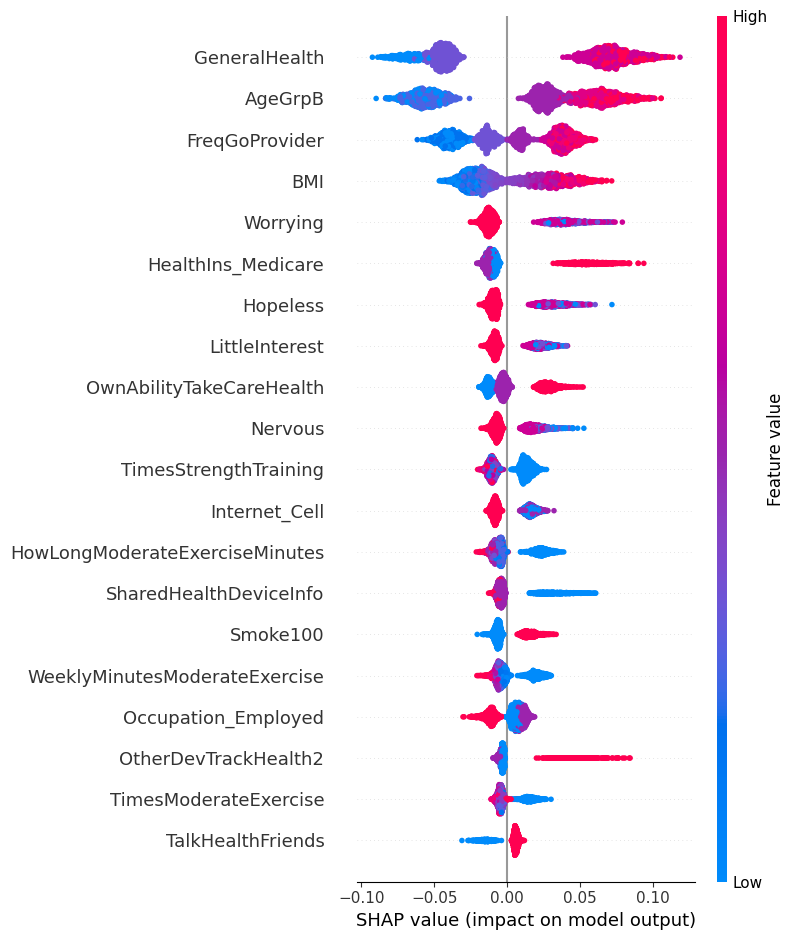

In [ ]:
# Initialize JavaScript visualization
shap.initjs()

# Create SHAP explainer for the Random Forest model
explainer = shap.TreeExplainer(best_model)

# Calculate SHAP values for the test set
shap_values = explainer.shap_values(np.array(X_test))

# Create a summary plot for the top 60 features
shap.summary_plot(shap_values[:, :, 1],X_test, feature_names=X.columns, max_display=20)

# Precision Recall Curve

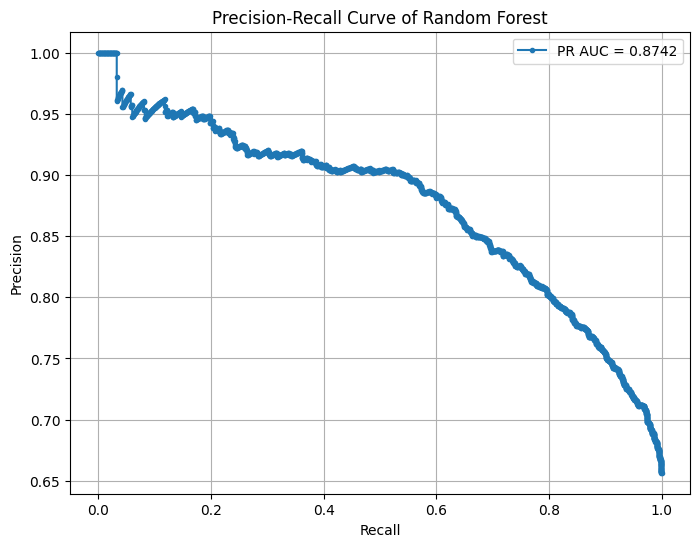

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, auc

# Get model probability scores for the positive class
y_test_prob = best_model.predict_proba(X_test)[:, 1]

# Compute precision-recall pairs
precision, recall, _ = precision_recall_curve(y_test, y_test_prob)

# Compute Area Under Precision-Recall Curve (PR-AUC)
pr_auc = auc(recall, precision)

# Plot PR Curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', label=f'PR AUC = {pr_auc:.4f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve of Random Forest')
plt.legend()
plt.grid()
plt.show()

# Logistic Regression

In [ ]:
# Exclude target and unwanted variables
exclude_vars = ['Age', 'Weight',
                'Height_Inches', 'MedConditions_HighBP', 'MedConditions_Diabetes', 'MedConditions_HeartCondition',
                'MedConditions_LungDisease','MedConditions_Depression','MedConditions_Diabetes','ChronicCondition'
                ]
X = df1.drop(columns=exclude_vars)
y = df1['ChronicCondition']

# Normalize the dataset using MinMaxScaler
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Split the dataset into training (85%) and testing (15%) using stratified sampling
X_train, X_test, y_train, y_test= train_test_split(
    X_scaled, y, test_size=0.15, stratify=y, random_state=42)

# Applying SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

print(f"Original class distribution: {Counter(y)}")
print(f"Class distribution after SMOTEENN: {Counter(y_resampled)}")

# Define the hyperparameter values for Logistic Regression with Elastic Net
C_values = [0.1, 0.5,1]
l1_ratios = [0.5, 0.7, 0.9]
max_iter_values = [800,900,1000]

# Create lists to store results of each hyperparameter combination
results = []

# 5-fold cross-validation setup
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Grid search through hyperparameters, only with Elastic Net penalty
for C in C_values:
    for l1_ratio in l1_ratios:
        for max_iter in max_iter_values:
            # Initialize the model with Elastic Net
            model = LogisticRegression(
                C=C,
                penalty='elasticnet',
                solver='saga',
                class_weight='balanced',
                l1_ratio=l1_ratio,
                max_iter=max_iter,
                random_state=42
            )

            fold_accuracies = []

            # Cross-validation loop
            print(f"\nHyperparameters: C={C}, l1_ratio={l1_ratio}, "
                  f"max_iter={max_iter}")

            for fold, (train_index, val_index) in enumerate(kf.split(X_resampled), 1):
                # Split training into training and validation sets
                X_train_fold, X_val_fold = X_resampled[train_index], X_resampled[val_index]
                y_train_fold, y_val_fold = y_resampled.iloc[train_index], y_resampled.iloc[val_index]

                # Train the model on the training fold
                model.fit(X_train_fold, y_train_fold)

                # Validate the model
                val_predictions = model.predict(X_val_fold)
                fold_accuracy = accuracy_score(y_val_fold, val_predictions)
                fold_accuracies.append(fold_accuracy)

                # Print accuracy for each fold
                print(f"Fold {fold} - Validation Accuracy: {fold_accuracy:.4f}")

            # Calculate the mean accuracy for this hyperparameter combination
            avg_accuracy = np.mean(fold_accuracies)
            print(f"Average Validation Accuracy for this combination: {avg_accuracy:.4f}\n")

            # Store the results
            results.append({
                'C': C,
                'l1_ratio': l1_ratio,
                'max_iter': max_iter,
                'average_cv_accuracy': avg_accuracy
            })

# Find and print the best hyperparameter combination based on cross-validation accuracy
best_result = max(results, key=lambda x: x['average_cv_accuracy'])
print("\nBest Hyperparameters:")
print(f"C: {best_result['C']}")
print(f"l1_ratio: {best_result['l1_ratio']}")
print(f"max_iter: {best_result['max_iter']}")
print(f"Average Cross-Validation Accuracy: {best_result['average_cv_accuracy']:.4f}")

# Use the best hyperparameters to create the final Logistic Regression model
best_logistic_model = LogisticRegression(
    C=best_result['C'],
    penalty='elasticnet',
    solver='saga',
    l1_ratio=best_result['l1_ratio'],
    class_weight= 'balanced',
    max_iter=best_result['max_iter'],
    random_state=42
)

# Train the best model on the entire training set
best_logistic_model.fit(X_resampled, y_resampled)

# Evaluate on the test set
y_test_pred = best_logistic_model.predict(X_test)

# Calculate testing accuracy
test_accuracy = accuracy_score(y_test, y_test_pred)

# Calculate additional performance metrics (Precision, Recall, F1, AUC)
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_test_pred)
roc_auc = roc_auc_score(y_test, y_test_pred)

print(f"\nTest Set Performance for Logistic Regression:")
print(f"Testing Accuracy: {test_accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"AUC Score: {roc_auc:.4f}")

Original class distribution: Counter({1: 9935, 0: 5191})
Class distribution after SMOTEENN: Counter({1: 8445, 0: 8445})

Hyperparameters: C=0.1, l1_ratio=0.5, max_iter=800
Fold 1 - Validation Accuracy: 0.7463
Fold 2 - Validation Accuracy: 0.7392
Fold 3 - Validation Accuracy: 0.7330
Fold 4 - Validation Accuracy: 0.7368
Fold 5 - Validation Accuracy: 0.7463
Average Validation Accuracy for this combination: 0.7403


Hyperparameters: C=0.1, l1_ratio=0.5, max_iter=900
Fold 1 - Validation Accuracy: 0.7463
Fold 2 - Validation Accuracy: 0.7392
Fold 3 - Validation Accuracy: 0.7330
Fold 4 - Validation Accuracy: 0.7368
Fold 5 - Validation Accuracy: 0.7463
Average Validation Accuracy for this combination: 0.7403


Hyperparameters: C=0.1, l1_ratio=0.5, max_iter=1000
Fold 1 - Validation Accuracy: 0.7463
Fold 2 - Validation Accuracy: 0.7392
Fold 3 - Validation Accuracy: 0.7330
Fold 4 - Validation Accuracy: 0.7368
Fold 5 - Validation Accuracy: 0.7463
Average Validation Accuracy for this combination: 0.

# Precision-Recall Curve

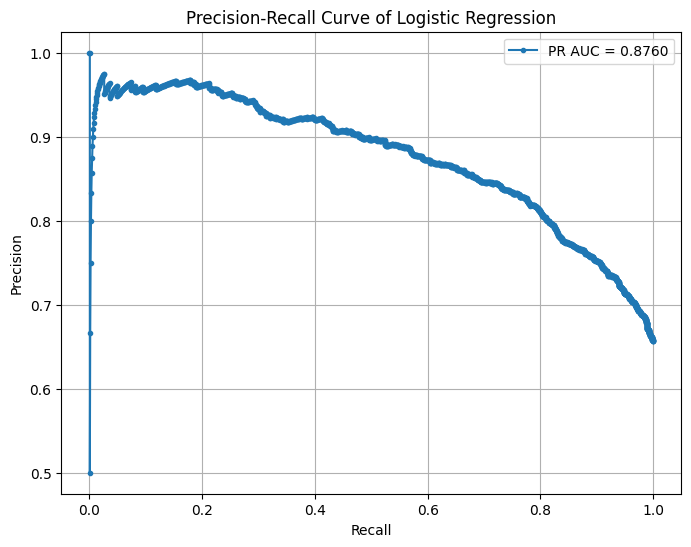

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, auc

# Get model probability scores for the positive class
y_test_prob = best_logistic_model.predict_proba(X_test)[:, 1]

# Compute precision-recall pairs
precision, recall, _ = precision_recall_curve(y_test, y_test_prob)

# Compute Area Under Precision-Recall Curve (PR-AUC)
pr_auc = auc(recall, precision)

# Plot PR Curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', label=f'PR AUC = {pr_auc:.4f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve of Logistic Regression')
plt.legend()
plt.grid()
plt.show()

# Support Vector Machine

In [ ]:
# Exclude target and unwanted variables
exclude_vars = ['Age', 'Weight',
                'Height_Inches', 'MedConditions_HighBP', 'MedConditions_Diabetes', 'MedConditions_HeartCondition',
                'MedConditions_LungDisease','MedConditions_Depression','MedConditions_Diabetes','ChronicCondition'
                ]
X = df1.drop(columns=exclude_vars)
y = df1['ChronicCondition']

# Normalize the dataset using MinMaxScaler
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Split the dataset into training (85%) and testing (15%) using stratified sampling
X_train, X_test, y_train, y_test= train_test_split(
    X_scaled, y, test_size=0.15, stratify=y, random_state=42)

# Applying SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

print(f"Original class distribution: {Counter(y)}")
print(f"Class distribution after SMOTE: {Counter(y_resampled)}")

# Define Hyperparameter Grid for SVM
C_values = [0.1, 1, 10]
kernels = ['rbf','poly']
gammas = ['scale', 'auto']

# Create lists to store results of each hyperparameter combination
results = []

# 5-fold cross-validation setup
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Grid search through hyperparameters for SVM
for C in C_values:
    for kernel in kernels:
        for gamma in gammas:

            # Initialize the SVM model
            model = SVC(
                C=C,
                kernel=kernel,
                gamma=gamma,
                class_weight='balanced',
                probability=True,
                random_state=42
            )

            fold_accuracies = []

            # Cross-validation loop
            print(f"\nHyperparameters: C={C}, kernel={kernel}, gamma={gamma}")

            for fold, (train_index, val_index) in enumerate(kf.split(X_resampled), 1):
                # Split training into training and validation sets
                X_train_fold, X_val_fold = X_resampled[train_index], X_resampled[val_index]
                y_train_fold, y_val_fold = y_resampled.iloc[train_index], y_resampled.iloc[val_index]

                # Train the model on the training fold
                model.fit(X_train_fold, y_train_fold)

                # Validate the model
                val_predictions = model.predict(X_val_fold)
                fold_accuracy = accuracy_score(y_val_fold, val_predictions)
                fold_accuracies.append(fold_accuracy)

                # Print accuracy for each fold
                print(f"Fold {fold} - Validation Accuracy: {fold_accuracy:.4f}")

            # Calculate the mean accuracy for this hyperparameter combination
            avg_accuracy = np.mean(fold_accuracies)
            print(f"Average Validation Accuracy for this combination: {avg_accuracy:.4f}\n")

            # Store the results
            results.append({
                'C': C,
                'kernel': kernel,
                'gamma': gamma,
                'average_cv_accuracy': avg_accuracy
            })

# Find and print the best hyperparameter combination based on cross-validation accuracy
best_result = max(results, key=lambda x: x['average_cv_accuracy'])
print("\nBest Hyperparameters:")
print(f"C: {best_result['C']}")
print(f"Kernel: {best_result['kernel']}")
print(f"Gamma: {best_result['gamma']}")
print(f"Average Cross-Validation Accuracy: {best_result['average_cv_accuracy']:.4f}")

# Use the best hyperparameters to create the final SVM model
best_svm_model = SVC(
    C=best_result['C'],
    kernel=best_result['kernel'],
    gamma=best_result['gamma'],
    class_weight='balanced',
    probability=True,
    random_state=42
)

# Train the best model on the entire training set
best_svm_model.fit(X_resampled, y_resampled)

# Evaluate on the test set
y_test_pred = best_svm_model.predict(X_test)
y_test_prob = best_svm_model.predict_proba(X_test)[:, 1]

# Calculate testing accuracy
test_accuracy = accuracy_score(y_test, y_test_pred)

# Calculate additional performance metrics (Precision, Recall, F1, AUC)
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_test_pred)
roc_auc = roc_auc_score(y_test, y_test_prob)

print(f"\nTest Set Performance for SVM Classifier:")
print(f"Testing Accuracy: {test_accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"AUC Score: {roc_auc:.4f}")

Original class distribution: Counter({1: 9935, 0: 5191})
Class distribution after SMOTE: Counter({1: 8445, 0: 8445})

Hyperparameters: C=0.1, kernel=rbf, gamma=scale
Fold 1 - Validation Accuracy: 0.7425
Fold 2 - Validation Accuracy: 0.7362
Fold 3 - Validation Accuracy: 0.7377
Fold 4 - Validation Accuracy: 0.7416
Fold 5 - Validation Accuracy: 0.7342
Average Validation Accuracy for this combination: 0.7384


Hyperparameters: C=0.1, kernel=rbf, gamma=auto
Fold 1 - Validation Accuracy: 0.7155
Fold 2 - Validation Accuracy: 0.7031
Fold 3 - Validation Accuracy: 0.7069
Fold 4 - Validation Accuracy: 0.7004
Fold 5 - Validation Accuracy: 0.6966
Average Validation Accuracy for this combination: 0.7045


Hyperparameters: C=0.1, kernel=poly, gamma=scale
Fold 1 - Validation Accuracy: 0.7593
Fold 2 - Validation Accuracy: 0.7472
Fold 3 - Validation Accuracy: 0.7392
Fold 4 - Validation Accuracy: 0.7451
Fold 5 - Validation Accuracy: 0.7519
Average Validation Accuracy for this combination: 0.7485


Hyperp

# Precision Recall Curve of SVM

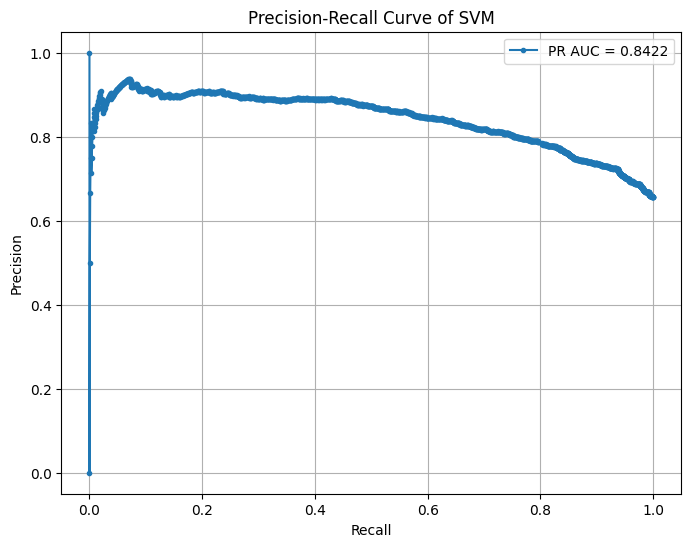

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, auc

# Get model probability scores for the positive class
y_test_prob = best_svm_model.predict_proba(X_test)[:, 1]

# Compute precision-recall pairs
precision, recall, _ = precision_recall_curve(y_test, y_test_prob)

# Compute Area Under Precision-Recall Curve (PR-AUC)
pr_auc = auc(recall, precision)

# Plot PR Curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', label=f'PR AUC = {pr_auc:.4f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve of SVM')
plt.legend()
plt.grid()
plt.show()

# Gradient Boosting Classifier

In [ ]:
# Exclude target and unwanted variables
exclude_vars = ['Age', 'Weight',
                'Height_Inches', 'MedConditions_HighBP', 'MedConditions_Diabetes', 'MedConditions_HeartCondition',
                'MedConditions_LungDisease','MedConditions_Depression','MedConditions_Diabetes','ChronicCondition'
                ]
X = df1.drop(columns=exclude_vars)
y = df1['ChronicCondition']

# Normalize the dataset using MinMaxScaler
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Split the dataset into training (85%) and testing (15%) using stratified sampling
X_train, X_test, y_train, y_test= train_test_split(
    X_scaled, y, test_size=0.15, stratify=y, random_state=42)

# Applying SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

print(f"Original class distribution: {Counter(y)}")
print(f"Class distribution after SMOTE: {Counter(y_resampled)}")

# Define Hyperparameter Grid for Gradient Boosting
n_estimators = [200, 300]
learning_rates = [0.01,0.05]
max_depths = [5, 7]
min_samples_splits = [5, 10]
min_samples_leafs = [2, 5]

# Create lists to store results of each hyperparameter combination
results = []

# 5-fold cross-validation setup
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Grid search through hyperparameters for Gradient Boosting
for n_est in n_estimators:
    for learning_rate in learning_rates:
        for max_depth in max_depths:
            for min_split in min_samples_splits:
                for min_leaf in min_samples_leafs:

                        # Initialize the Gradient Boosting model
                        model = GradientBoostingClassifier(
                            n_estimators=n_est,
                            learning_rate=learning_rate,
                            max_depth=max_depth,
                            min_samples_split=min_split,
                            min_samples_leaf=min_leaf,
                            random_state=42
                        )

                        fold_accuracies = []

                        # Cross-validation loop
                        print(f"\nHyperparameters: n_estimators={n_est}, learning_rate={learning_rate}, max_depth={max_depth}, "
                              f"min_samples_split={min_split}, min_samples_leaf={min_leaf}")

                        for fold, (train_index, val_index) in enumerate(kf.split(X_resampled), 1):
                            # Split training into training and validation sets
                            X_train_fold, X_val_fold = X_resampled[train_index], X_resampled[val_index]
                            y_train_fold, y_val_fold = y_resampled.iloc[train_index], y_resampled.iloc[val_index]

                            # Train the model on the training fold
                            model.fit(X_train_fold, y_train_fold)

                            # Validate the model
                            val_predictions = model.predict(X_val_fold)
                            fold_accuracy = accuracy_score(y_val_fold, val_predictions)
                            fold_accuracies.append(fold_accuracy)

                            # Print accuracy for each fold
                            print(f"Fold {fold} - Validation Accuracy: {fold_accuracy:.4f}")

                        # Calculate the mean accuracy for this hyperparameter combination
                        avg_accuracy = np.mean(fold_accuracies)
                        print(f"Average Validation Accuracy for this combination: {avg_accuracy:.4f}\n")

                        # Store the results
                        results.append({
                            'n_estimators': n_est,
                            'learning_rate': learning_rate,
                            'max_depth': max_depth,
                            'min_samples_split': min_split,
                            'min_samples_leaf': min_leaf,
                            'average_cv_accuracy': avg_accuracy
                        })

# Find and print the best hyperparameter combination based on cross-validation accuracy
best_result = max(results, key=lambda x: x['average_cv_accuracy'])
print("\nBest Hyperparameters:")
print(f"n_estimators: {best_result['n_estimators']}")
print(f"learning_rate: {best_result['learning_rate']}")
print(f"max_depth: {best_result['max_depth']}")
print(f"min_samples_split: {best_result['min_samples_split']}")
print(f"min_samples_leaf: {best_result['min_samples_leaf']}")
print(f"Average Cross-Validation Accuracy: {best_result['average_cv_accuracy']:.4f}")

# Use the best hyperparameters to create the final Gradient Boosting model
best_gb_model = GradientBoostingClassifier(
    n_estimators=best_result['n_estimators'],
    learning_rate=best_result['learning_rate'],
    max_depth=best_result['max_depth'],
    min_samples_split=best_result['min_samples_split'],
    min_samples_leaf=best_result['min_samples_leaf'],
    random_state=42
)

# Train the best model on the entire training set
best_gb_model.fit(X_resampled, y_resampled)

# Evaluate on the test set
y_test_pred = best_gb_model.predict(X_test)
y_test_prob = best_gb_model.predict_proba(X_test)[:, 1]

# Calculate testing accuracy
test_accuracy = accuracy_score(y_test, y_test_pred)

# Calculate additional performance metrics (Precision, Recall, F1, AUC)
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_test_pred)
roc_auc = roc_auc_score(y_test, y_test_prob)

print(f"\nTest Set Performance for Gradient Boosting Classifier:")
print(f"Testing Accuracy: {test_accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"AUC Score: {roc_auc:.4f}")

# Get feature importances from the trained Gradient Boosting model
feature_importances = best_gb_model.feature_importances_

# Create a DataFrame for better visualization
feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Display the top 60 important features
print(feature_importance_df.head(60))

Original class distribution: Counter({1: 9935, 0: 5191})
Class distribution after SMOTE: Counter({1: 8445, 0: 8445})

Hyperparameters: n_estimators=200, learning_rate=0.01, max_depth=5, min_samples_split=5, min_samples_leaf=2
Fold 1 - Validation Accuracy: 0.8008
Fold 2 - Validation Accuracy: 0.8102
Fold 3 - Validation Accuracy: 0.7916
Fold 4 - Validation Accuracy: 0.7937
Fold 5 - Validation Accuracy: 0.7946
Average Validation Accuracy for this combination: 0.7982


Hyperparameters: n_estimators=200, learning_rate=0.01, max_depth=5, min_samples_split=5, min_samples_leaf=5
Fold 1 - Validation Accuracy: 0.7993
Fold 2 - Validation Accuracy: 0.8097
Fold 3 - Validation Accuracy: 0.7925
Fold 4 - Validation Accuracy: 0.7946
Fold 5 - Validation Accuracy: 0.7934
Average Validation Accuracy for this combination: 0.7979


Hyperparameters: n_estimators=200, learning_rate=0.01, max_depth=5, min_samples_split=10, min_samples_leaf=2
Fold 1 - Validation Accuracy: 0.7993
Fold 2 - Validation Accuracy: 0.

# Shap value

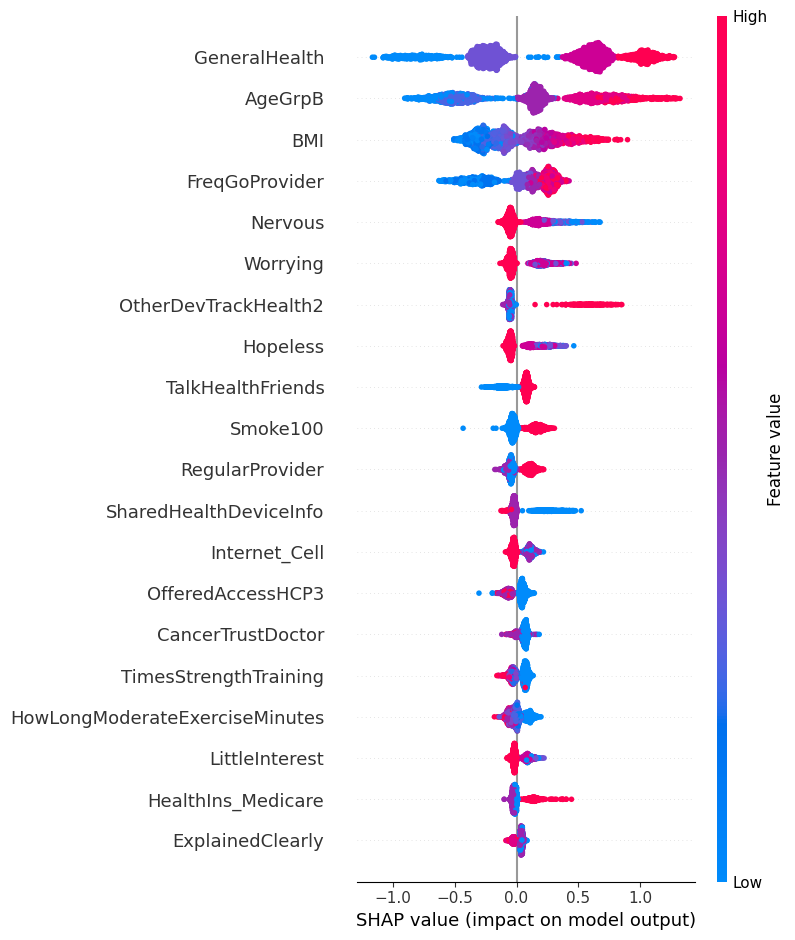

In [ ]:
# Initialize JavaScript visualization
shap.initjs()

# Create a SHAP explainer for the Gradient Boosting model
explainer = shap.TreeExplainer(best_gb_model)

# Calculate SHAP values for the test set
shap_values = explainer.shap_values(X_test)

# SHAP summary plot for the top 20 features
shap.summary_plot(shap_values, X_test, feature_names=X.columns, max_display=20)

# Precision Recall Curve

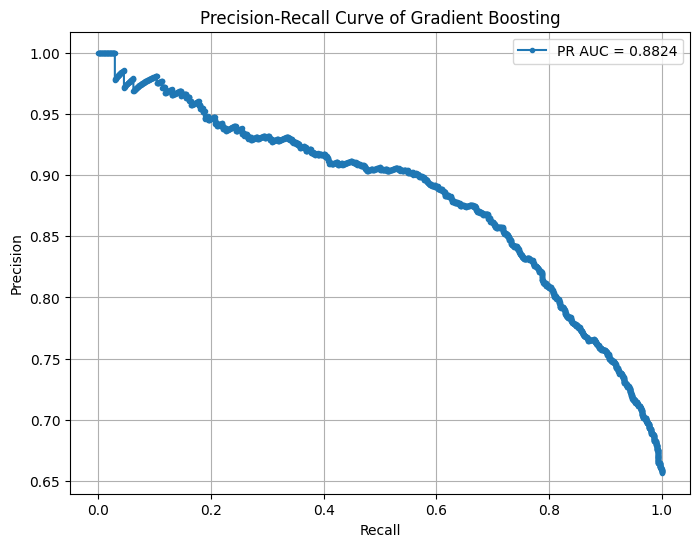

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, auc

# Get model probability scores for the positive class
y_test_prob = best_gb_model.predict_proba(X_test)[:, 1]

# Compute precision-recall pairs
precision, recall, _ = precision_recall_curve(y_test, y_test_prob)

# Compute Area Under Precision-Recall Curve (PR-AUC)
pr_auc = auc(recall, precision)

# Plot PR Curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', label=f'PR AUC = {pr_auc:.4f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve of Gradient Boosting')
plt.legend()
plt.grid()
plt.show()

# ROC Curve

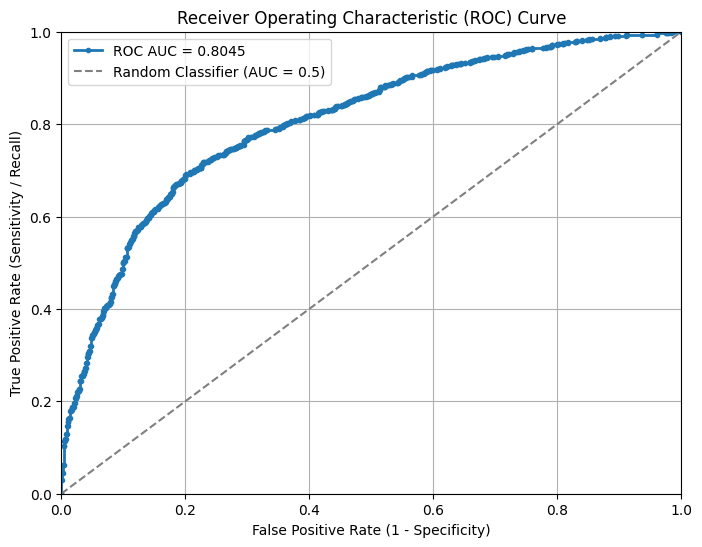

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Get probability scores for the positive class
y_test_prob = best_gb_model.predict_proba(X_test)[:, 1]

# Compute FPR, TPR, and thresholds
fpr, tpr, _ = roc_curve(y_test, y_test_prob)

# Compute Area Under ROC Curve (AUC-ROC)
roc_auc = auc(fpr, tpr)

# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, marker='.', linestyle='-', linewidth=2, label=f'ROC AUC = {roc_auc:.4f}')

# Plot the random classifier baseline (dashed diagonal line)
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Classifier (AUC = 0.5)')

# Labels and title
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity / Recall)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.grid()

# Show the plot
plt.show()

# Deep Learning

In [ ]:
from sklearn.model_selection import StratifiedKFold
# Import tensorfolw
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from collections import Counter
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
# Exclude target and unwanted variables
exclude_vars = ['Age', 'Weight',
                'Height_Inches', 'MedConditions_HighBP', 'MedConditions_Diabetes', 'MedConditions_HeartCondition',
                'MedConditions_LungDisease','MedConditions_Depression','MedConditions_Diabetes','ChronicCondition'
                ]
X = df1.drop(columns=exclude_vars)
y = df1['ChronicCondition']

# Normalize the dataset using MinMaxScaler
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Split the dataset into training (85%) and testing (15%) using stratified sampling
X_train, X_test, y_train, y_test= train_test_split(
    X_scaled, y, test_size=0.15, stratify=y, random_state=42)

# Applying SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

print(f"Original class distribution: {Counter(y)}")
print(f"Class distribution after SMOTE: {Counter(y_resampled)}")


# Define the hyperparameter grid manually
batch_sizes = [16, 32, 64]
learning_rates = [0.001, 0.01, 0.1]
neurons = [64, 128, 256]

# Stratified K-Fold setup
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# To store results
results = []

# Manual Grid Search for Hyperparameter Tuning
for batch_size in batch_sizes:
    for learning_rate in learning_rates:
        for neuron in neurons:
            print(f"\nTesting batch_size={batch_size}, learning_rate={learning_rate}, neurons={neuron}")

            fold_accuracies = []

            for fold, (train_index, val_index) in enumerate(kf.split(X_resampled,y_resampled), 1):

                # Define the Deep Learning model architecture
                model = keras.Sequential([
                    layers.Input(shape=(X_resampled.shape[1],)),
                    layers.Dense(neuron, activation='relu'),
                    layers.Dropout(0.3),
                    layers.Dense(neuron // 2, activation='relu'),
                    layers.Dropout(0.3),
                    layers.Dense(neuron // 4, activation='relu'),
                    layers.Dropout(0.3),
                    layers.Dense(1, activation='sigmoid')
                ])

                # Compile the model with specified learning rate
                model.compile(
                    optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
                    loss='binary_crossentropy',
                    metrics=['accuracy']
                )

                # Split the data into training and validation sets
                X_train_fold, X_val_fold = X_resampled[train_index], X_resampled[val_index]
                y_train_fold, y_val_fold = y_resampled[train_index], y_resampled[val_index]

                # Train the model
                model.fit(X_train_fold, y_train_fold,
                          validation_data=(X_val_fold, y_val_fold),
                          epochs=20,
                          batch_size=batch_size,
                          verbose=0)

                # Evaluate the model
                val_loss, val_accuracy = model.evaluate(X_val_fold, y_val_fold, verbose=0)
                fold_accuracies.append(val_accuracy)
                print(f"Fold {fold} - Validation Accuracy: {val_accuracy:.4f}")

            # Average accuracy for this combination
            avg_accuracy = np.mean(fold_accuracies)
            print(f"Average Validation Accuracy: {avg_accuracy:.4f}\n")

            # Store the result
            results.append({
                'batch_size': batch_size,
                'learning_rate': learning_rate,
                'neurons': neuron,
                'average_cv_accuracy': avg_accuracy
            })

# Find the best hyperparameter combination
best_result = max(results, key=lambda x: x['average_cv_accuracy'])
print("\nBest Hyperparameters:")
print(f"Batch Size: {best_result['batch_size']}")
print(f"Learning Rate: {best_result['learning_rate']}")
print(f"Neurons: {best_result['neurons']}")
print(f"Average Cross-Validation Accuracy: {best_result['average_cv_accuracy']:.4f}")

# Build the Final Deep Learning Model with Best Hyperparameters
deep_lr_model = keras.Sequential([
    layers.Input(shape=(X_resampled.shape[1],)),
    layers.Dense(best_result['neurons'], activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(best_result['neurons'] // 2, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(best_result['neurons'] // 4, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(1, activation='sigmoid')
])

# Compile the final model
deep_lr_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=best_result['learning_rate']),
    loss='binary_crossentropy',
    metrics=['accuracy', keras.metrics.Precision(), keras.metrics.Recall(), keras.metrics.AUC()]
)

# Train the model on the entire training set
deep_lr_model.fit(
    X_resampled, y_resampled,
    epochs=20,
    batch_size=best_result['batch_size'],
    verbose=1
)

# Evaluate on the test set
y_test_prob = deep_lr_model.predict(X_test).ravel()
y_test_pred = (y_test_prob > 0.5).astype(int)

# Calculate testing accuracy
test_accuracy = accuracy_score(y_test, y_test_pred)

# Calculate additional performance metrics (Precision, Recall, F1, AUC)
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_test_pred)
roc_auc = roc_auc_score(y_test, y_test_prob)

print(f"\nTest Set Performance for Deep Learning Model:")
print(f"Testing Accuracy: {test_accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"AUC Score: {roc_auc:.4f}")

Original class distribution: Counter({1: 9935, 0: 5191})
Class distribution after SMOTE: Counter({1: 8445, 0: 8445})

Testing batch_size=16, learning_rate=0.001, neurons=64
Fold 1 - Validation Accuracy: 0.7395
Fold 2 - Validation Accuracy: 0.7448
Fold 3 - Validation Accuracy: 0.7425
Fold 4 - Validation Accuracy: 0.7427
Fold 5 - Validation Accuracy: 0.7380
Average Validation Accuracy: 0.7415


Testing batch_size=16, learning_rate=0.001, neurons=128
Fold 1 - Validation Accuracy: 0.7490
Fold 2 - Validation Accuracy: 0.7493
Fold 3 - Validation Accuracy: 0.7540
Fold 4 - Validation Accuracy: 0.7484
Fold 5 - Validation Accuracy: 0.7422
Average Validation Accuracy: 0.7485


Testing batch_size=16, learning_rate=0.001, neurons=256
Fold 1 - Validation Accuracy: 0.7478
Fold 2 - Validation Accuracy: 0.7575
Fold 3 - Validation Accuracy: 0.7552
Fold 4 - Validation Accuracy: 0.7531
Fold 5 - Validation Accuracy: 0.7404
Average Validation Accuracy: 0.7508


Testing batch_size=16, learning_rate=0.01, neu

# Precision Recall Curve

71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


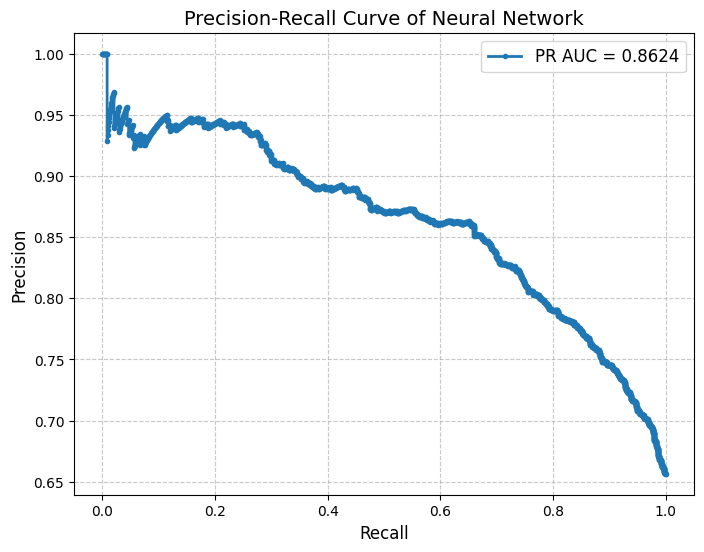

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, auc

# Get model probability scores for the positive class
try:
    # If using Scikit-Learn's Logistic Regression or similar model
    y_test_prob = deep_lr_model.predict_proba(X_test)[:, 1]
except AttributeError:
    # If using TensorFlow/Keras (no predict_proba)
    y_test_prob = deep_lr_model.predict(X_test).flatten()

# Compute precision-recall pairs
precision, recall, _ = precision_recall_curve(y_test, y_test_prob)

# Compute Area Under Precision-Recall Curve (PR-AUC)
pr_auc = auc(recall, precision)

# Plot PR Curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', linestyle='-', linewidth=2, label=f'PR AUC = {pr_auc:.4f}')

# Improve readability
plt.xlabel('Recall', fontsize=12)
plt.ylabel('Precision', fontsize=12)
plt.title('Precision-Recall Curve of Neural Network', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.show()

# ROC Curve

71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


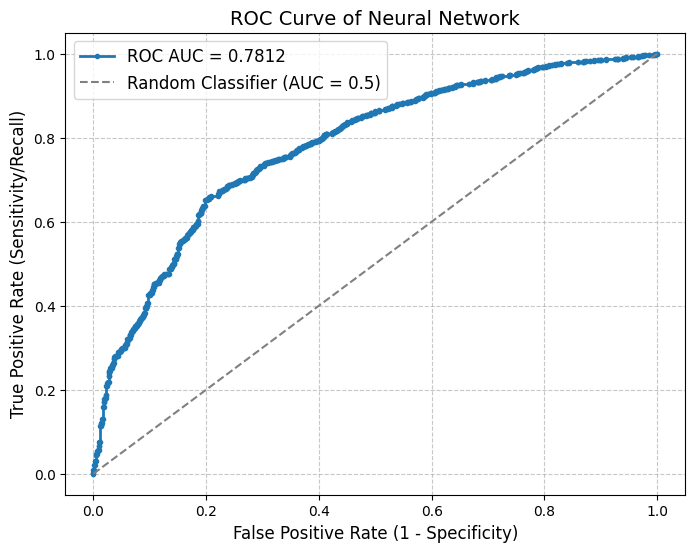

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Get probability scores for the positive class
try:
    # If using a Scikit-Learn model (like Logistic Regression, Random Forest, etc.)
    y_test_prob = deep_lr_model.predict_proba(X_test)[:, 1]
except AttributeError:
    # If using a TensorFlow/Keras model (Neural Network)
    y_test_prob = deep_lr_model.predict(X_test).flatten()

# Compute FPR (False Positive Rate), TPR (True Positive Rate), and thresholds
fpr, tpr, _ = roc_curve(y_test, y_test_prob)

# Compute AUC-ROC Score
roc_auc = auc(fpr, tpr)

# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, marker='.', linestyle='-', linewidth=2, label=f'ROC AUC = {roc_auc:.4f}')

# Plot the random classifier baseline (diagonal line)
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Classifier (AUC = 0.5)')

# Labels and title
plt.xlabel('False Positive Rate (1 - Specificity)', fontsize=12)
plt.ylabel('True Positive Rate (Sensitivity/Recall)', fontsize=12)
plt.title('ROC Curve of Neural Network', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.show()

# Summary of Approach 1 (imputation with -1)

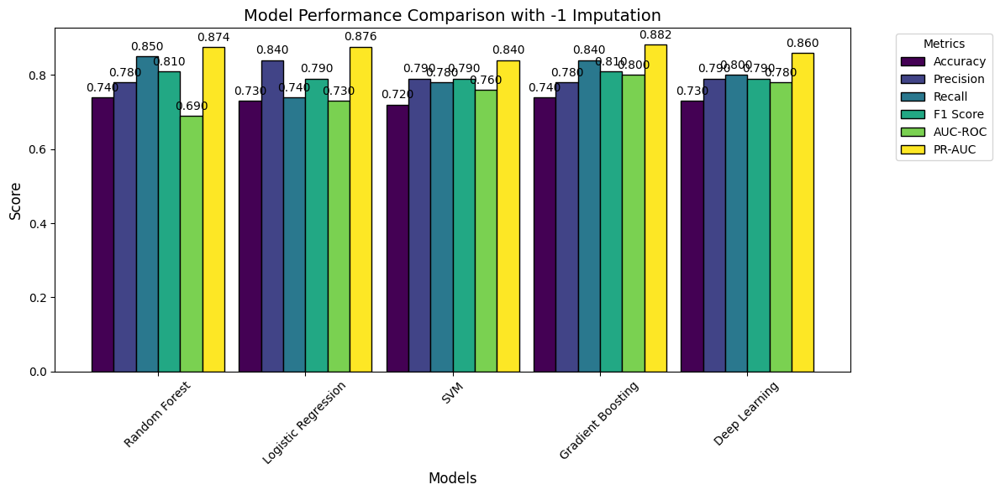

In [ ]:
# Store performance metrics for each model
model_performance = {
    "Random Forest": [0.74, 0.78, 0.85, 0.81, 0.69,0.8742],
    "Logistic Regression": [0.73, 0.84, 0.74, 0.79, 0.73,0.8760],
    "SVM": [0.72, 0.79, 0.78, 0.79, 0.76,0.84],
    "Gradient Boosting": [0.74, 0.78, 0.84, 0.81, 0.80,0.8824],
    "Deep Learning": [0.73, 0.79, 0.80, 0.79, 0.78,0.86]
}

# Define metric names
metrics = ["Accuracy", "Precision", "Recall", "F1 Score", "AUC-ROC", "PR-AUC"]

# Convert dictionary into a DataFrame
df_performance = pd.DataFrame(model_performance, index=metrics)

# Plot grouped bar chart
ax = df_performance.T.plot(kind='bar', figsize=(12, 6), colormap='viridis', edgecolor='black', width = 0.9)

# Add value labels to bars
for container in ax.containers:
    ax.bar_label(container, fmt='%.3f', fontsize=10, padding=3)

# Labels and title
plt.title("Model Performance Comparison with -1 Imputation", fontsize=14)
plt.xlabel("Models", fontsize=12)
plt.ylabel("Score", fontsize=12)
plt.xticks(rotation=45)
plt.legend(title="Metrics", bbox_to_anchor=(1.05, 1), loc='upper left')

# Show plot
plt.tight_layout()
plt.show()

In [ ]:
df1.head()

,SeekCancerInfo,CancerLotOfEffort,CancerFrustrated,CancerConfidentGetHealthInf,CancerTrustDoctor,CancerTrustFamily,CancerTrustGov,CancerTrustCharities,CancerTrustReligiousOrgs,StrongNeedCancerInfo,...,FeelLeftOut,FeelPeopleBarelyKnow,FeelIsolated,FeelPeopleNotWithMe,ChronicCondition,RaceEthn_Hispanic,RaceEthn_White,RaceEthn_Black,RaceEthn_Asian,RaceEthn_Others
0,1,3,3,3,1,2,2,2,3,7,...,-1,-1,-1,-1,1,0,1,0,0,0
1,1,3,3,1,2,3,3,3,4,6,...,-1,-1,-1,-1,0,0,1,0,0,0
2,1,3,4,1,2,2,2,4,4,6,...,-1,-1,-1,-1,1,0,1,0,0,0
3,1,2,2,3,2,2,2,2,4,4,...,-1,-1,-1,-1,0,0,1,0,0,0
4,0,-1,-1,2,1,1,2,1,1,6,...,-1,-1,-1,-1,1,0,1,0,0,0


In [ ]:
# Replace the -1 values with na on df1 datasets
df1.replace(-1, np.nan, inplace=True)

In [ ]:
df1.head()

,SeekCancerInfo,CancerLotOfEffort,CancerFrustrated,CancerConfidentGetHealthInf,CancerTrustDoctor,CancerTrustFamily,CancerTrustGov,CancerTrustCharities,CancerTrustReligiousOrgs,StrongNeedCancerInfo,...,FeelLeftOut,FeelPeopleBarelyKnow,FeelIsolated,FeelPeopleNotWithMe,ChronicCondition,RaceEthn_Hispanic,RaceEthn_White,RaceEthn_Black,RaceEthn_Asian,RaceEthn_Others
0,1.0,3.0,3.0,3.0,1.0,2.0,2.0,2.0,3.0,7.0,...,NaN,NaN,NaN,NaN,1,0,1,0,0,0
1,1.0,3.0,3.0,1.0,2.0,3.0,3.0,3.0,4.0,6.0,...,NaN,NaN,NaN,NaN,0,0,1,0,0,0
2,1.0,3.0,4.0,1.0,2.0,2.0,2.0,4.0,4.0,6.0,...,NaN,NaN,NaN,NaN,1,0,1,0,0,0
3,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,4.0,4.0,...,NaN,NaN,NaN,NaN,0,0,1,0,0,0
4,0.0,NaN,NaN,2.0,1.0,1.0,2.0,1.0,1.0,6.0,...,NaN,NaN,NaN,NaN,1,0,1,0,0,0


In [ ]:
# save the df1 file in a excel file
df1.to_excel('HINTS_Modified_IMP(na).xlsx', index=False)

# Approach 2: Imputation with MICE

In [ ]:
# Load the dataset HINTS_Modified
df2 = pd.read_excel('/content/drive/MyDrive/HINTS_Modified_IMP(na).xlsx')
df2.head()

,SeekCancerInfo,CancerLotOfEffort,CancerFrustrated,CancerConfidentGetHealthInf,CancerTrustDoctor,CancerTrustFamily,CancerTrustGov,CancerTrustCharities,CancerTrustReligiousOrgs,StrongNeedCancerInfo,...,FeelLeftOut,FeelPeopleBarelyKnow,FeelIsolated,FeelPeopleNotWithMe,ChronicCondition,RaceEthn_Hispanic,RaceEthn_White,RaceEthn_Black,RaceEthn_Asian,RaceEthn_Others
0,1.0,3.0,3.0,3.0,1.0,2.0,2.0,2.0,3.0,7.0,...,NaN,NaN,NaN,NaN,1,0,1,0,0,0
1,1.0,3.0,3.0,1.0,2.0,3.0,3.0,3.0,4.0,6.0,...,NaN,NaN,NaN,NaN,0,0,1,0,0,0
2,1.0,3.0,4.0,1.0,2.0,2.0,2.0,4.0,4.0,6.0,...,NaN,NaN,NaN,NaN,1,0,1,0,0,0
3,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,4.0,4.0,...,NaN,NaN,NaN,NaN,0,0,1,0,0,0
4,0.0,NaN,NaN,2.0,1.0,1.0,2.0,1.0,1.0,6.0,...,NaN,NaN,NaN,NaN,1,0,1,0,0,0


In [ ]:
df2.isna().sum() # Checking the number of missing values

,0
SeekCancerInfo,99
CancerLotOfEffort,6414
CancerFrustrated,6601
CancerConfidentGetHealthInf,11362
CancerTrustDoctor,266
...,...
RaceEthn_Hispanic,0
RaceEthn_White,0
RaceEthn_Black,0
RaceEthn_Asian,0


In [ ]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.linear_model import LogisticRegression, BayesianRidge
from sklearn.tree import DecisionTreeRegressor

# Extract column names from categorized lists
continuous_vars = [col[0] for col in continuous_vars]  # Continuous variables
ordinal_vars = [col[0] for col in ordinal_vars]  # Ordinal variables
binary_vars = [col[0] for col in binary_vars]  # Binary variables

# Increase max_iter to allow convergence
mice_continuous = IterativeImputer(estimator=BayesianRidge(), max_iter=20, random_state=42)
mice_ordinal = IterativeImputer(estimator=DecisionTreeRegressor(), max_iter=20, random_state=42)
mice_binary = IterativeImputer(estimator=LogisticRegression(), max_iter=20, random_state=42)

# Apply imputation
df2[continuous_vars] = np.round(mice_continuous.fit_transform(df2[continuous_vars]),2)
df2[ordinal_vars] = np.round(mice_ordinal.fit_transform(df2[ordinal_vars]))
df2[binary_vars] = np.round(mice_binary.fit_transform(df2[binary_vars])).astype(int)

In [ ]:
df2.isna().sum()

,0
SeekCancerInfo,0
CancerLotOfEffort,0
CancerFrustrated,0
CancerConfidentGetHealthInf,0
CancerTrustDoctor,0
...,...
RaceEthn_Hispanic,0
RaceEthn_White,0
RaceEthn_Black,0
RaceEthn_Asian,0


In [ ]:
df2['CancerFrustrated'].value_counts()

,count
CancerFrustrated,
4.0,5336
3.0,4406
2.0,3915
1.0,1469


# Handling the Outliers on df2 dataset

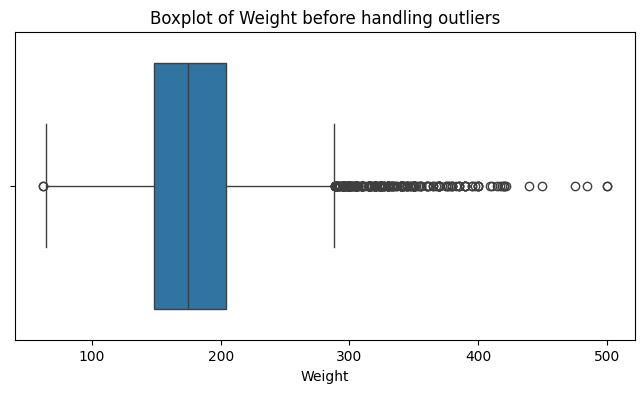

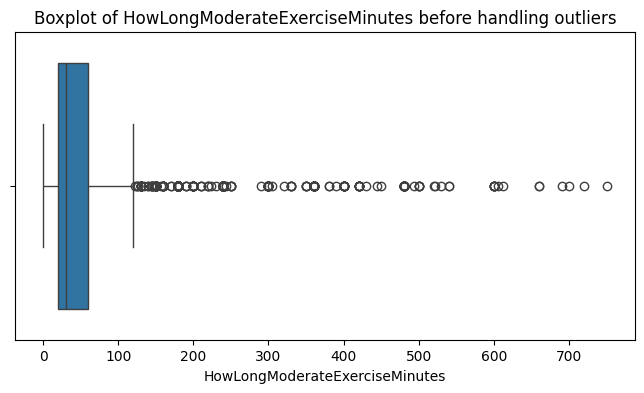

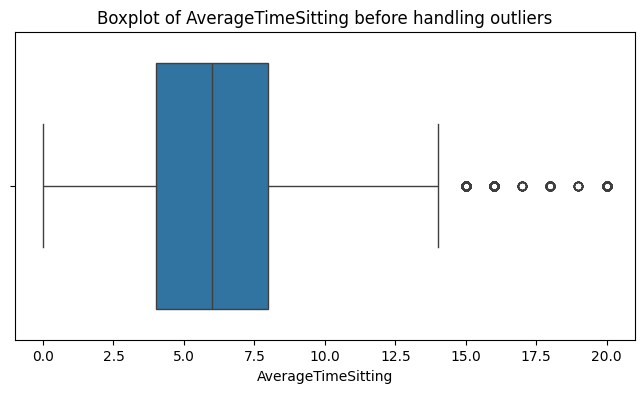

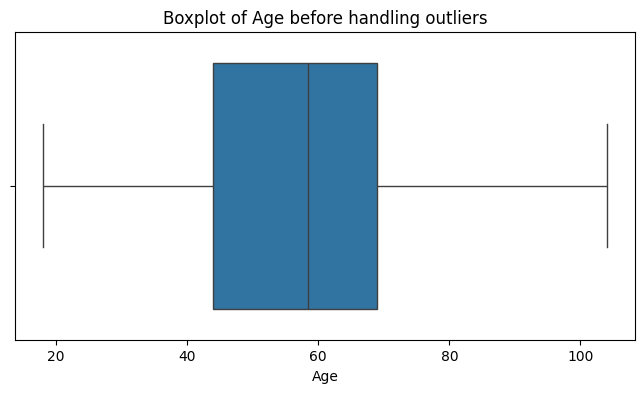

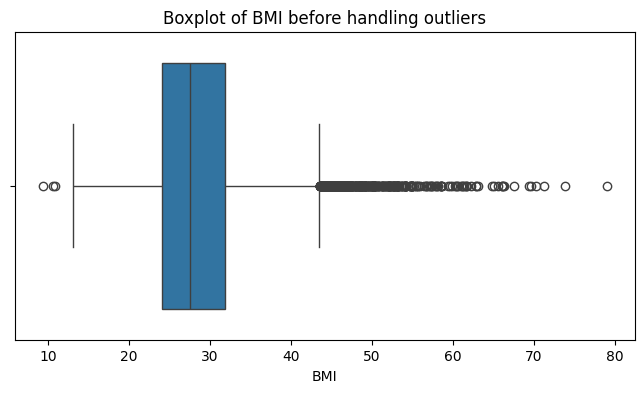

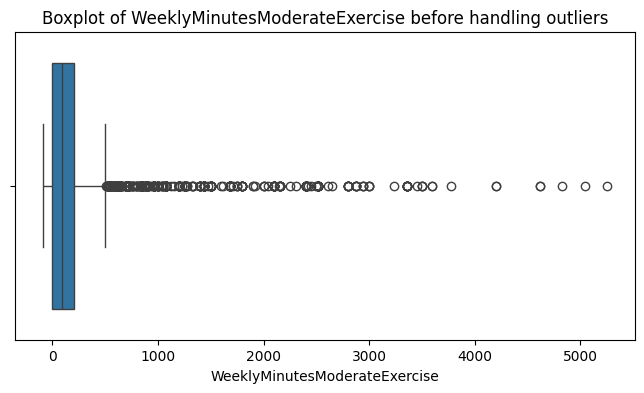

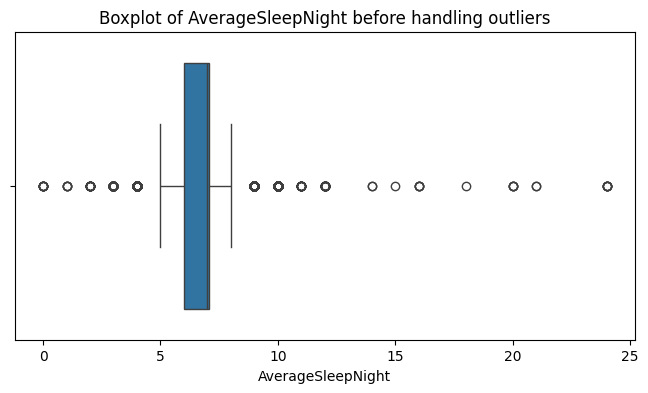

In [ ]:
# List of the continuous variables
continuous_vars = ['Weight', 'HowLongModerateExerciseMinutes',
                        'AverageTimeSitting', 'Age', 'BMI', 'WeeklyMinutesModerateExercise',
                         'AverageSleepNight']

for var in continuous_vars:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df2[var])
    plt.title(f'Boxplot of {var} before handling outliers')
    plt.show()

In [ ]:
# Checking from the IQR Methiod
for var in continuous_vars:
    Q1 = df2[var].quantile(0.25)
    Q3 = df2[var].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = df2[(df2[var] < lower_bound) | (df2[var] > upper_bound)]
    print(f'{var} has {len(outliers)} outliers.')

Weight has 390 outliers.
HowLongModerateExerciseMinutes has 464 outliers.
AverageTimeSitting has 501 outliers.
Age has 0 outliers.
BMI has 495 outliers.
WeeklyMinutesModerateExercise has 798 outliers.
AverageSleepNight has 1261 outliers.


In [ ]:
# Handling outliers with clipping
for var in continuous_vars:
    Q1 = df2[var].quantile(0.25)
    Q3 = df2[var].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    df2[var] = df2[var].apply(lambda x: lower_bound if x < lower_bound else upper_bound if x > upper_bound else x)

In [ ]:
# Checking from the IQR Methiod
for var in continuous_vars:
    Q1 = df2[var].quantile(0.25)
    Q3 = df2[var].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = df2[(df2[var] < lower_bound) | (df2[var] > upper_bound)]
    print(f'{var} has {len(outliers)} outliers.')

Weight has 0 outliers.
HowLongModerateExerciseMinutes has 0 outliers.
AverageTimeSitting has 0 outliers.
Age has 0 outliers.
BMI has 0 outliers.
WeeklyMinutesModerateExercise has 0 outliers.
AverageSleepNight has 0 outliers.


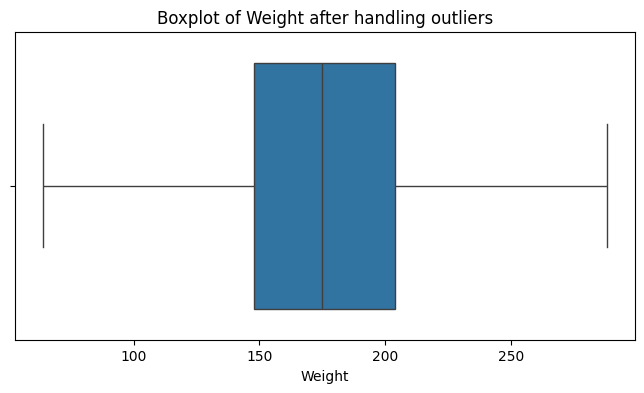

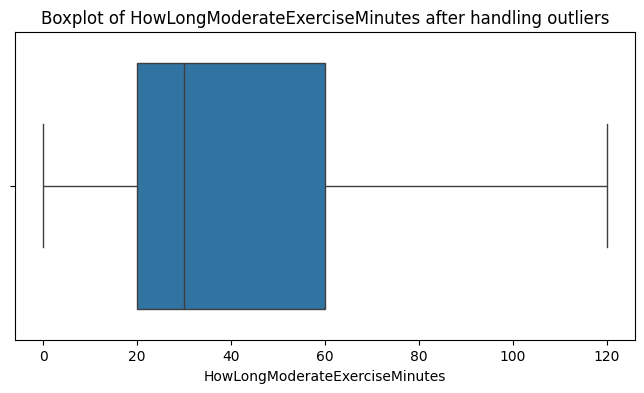

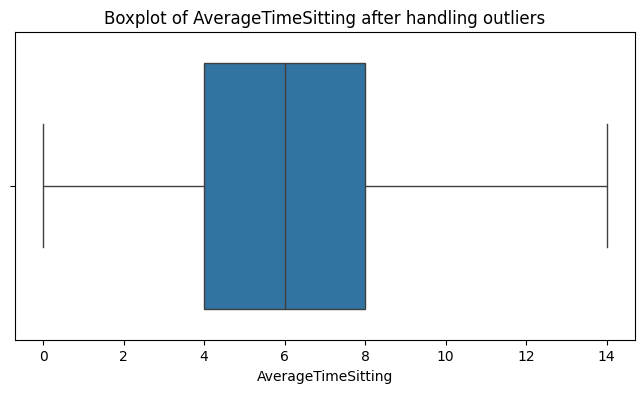

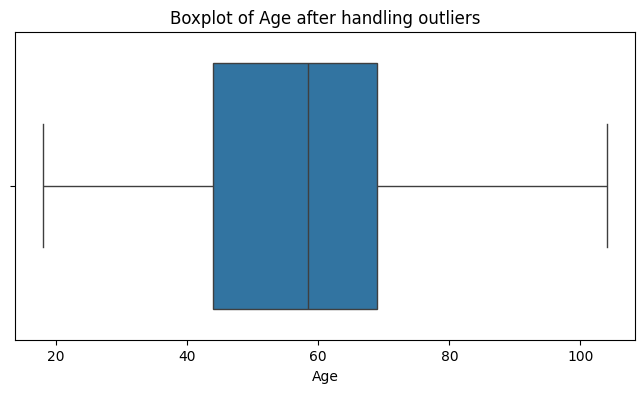

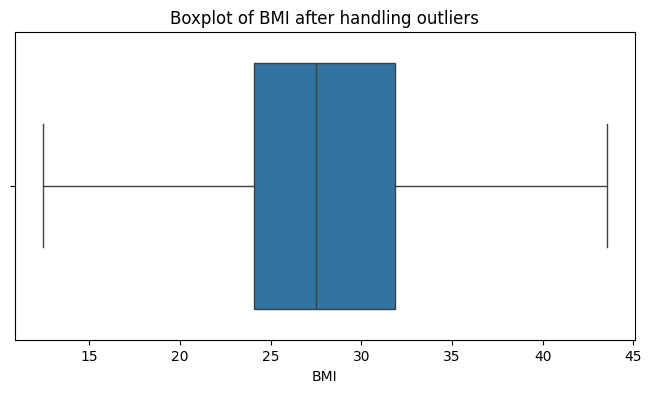

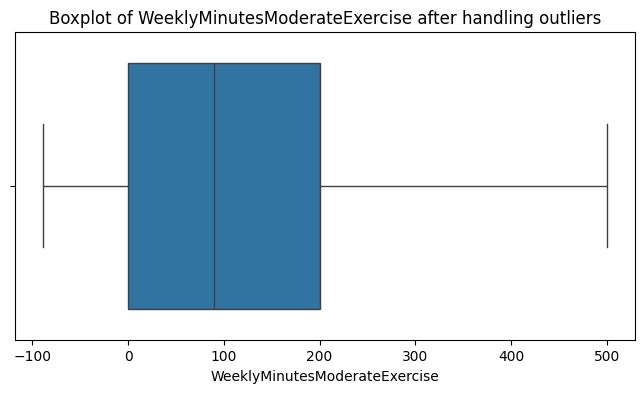

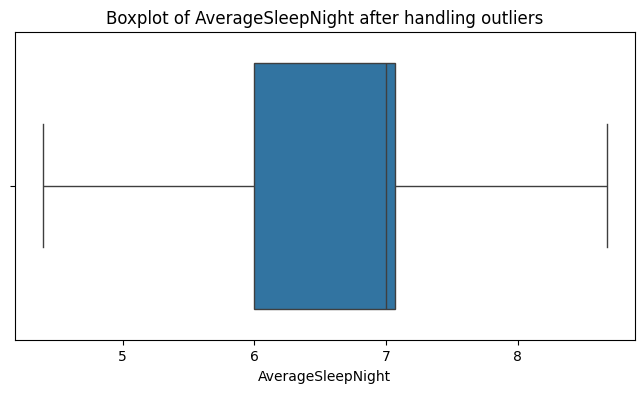

In [ ]:
for var in continuous_vars:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df2[var])
    plt.title(f'Boxplot of {var} after handling outliers')
    plt.show()

In [ ]:
# Save the Imputed df1 data in excel file
df2.to_excel('HINTS_Modified_IMP(MICE).xlsx', index=False)

# Load the MICE Imputed dataset for the further analysis

In [ ]:
df3 = pd.read_excel('/content/drive/MyDrive/HINTS_Modified_IMP(MICE).xlsx')
df3.head()

,SeekCancerInfo,CancerLotOfEffort,CancerFrustrated,CancerConfidentGetHealthInf,CancerTrustDoctor,CancerTrustFamily,CancerTrustGov,CancerTrustCharities,CancerTrustReligiousOrgs,StrongNeedCancerInfo,...,FeelLeftOut,FeelPeopleBarelyKnow,FeelIsolated,FeelPeopleNotWithMe,ChronicCondition,RaceEthn_Hispanic,RaceEthn_White,RaceEthn_Black,RaceEthn_Asian,RaceEthn_Others
0,1,3,3,3,1,2,2,2,3,7,...,3,5,4,4,1,0,1,0,0,0
1,1,3,3,1,2,3,3,3,4,6,...,1,2,2,1,0,0,1,0,0,0
2,1,3,4,1,2,2,2,4,4,6,...,1,1,1,1,1,0,1,0,0,0
3,1,2,2,3,2,2,2,2,4,4,...,2,4,1,2,0,0,1,0,0,0
4,0,4,4,2,1,1,2,1,1,6,...,1,3,1,1,1,0,1,0,0,0


In [ ]:
print(df3.columns.tolist())

['SeekCancerInfo', 'CancerLotOfEffort', 'CancerFrustrated', 'CancerConfidentGetHealthInf', 'CancerTrustDoctor', 'CancerTrustFamily', 'CancerTrustGov', 'CancerTrustCharities', 'CancerTrustReligiousOrgs', 'StrongNeedCancerInfo', 'UseInternet', 'Internet_DialUp', 'Internet_BroadBnd', 'Internet_Cell', 'Internet_WiFi', 'WhereUseInternet_Home', 'WhereUseInternet_Work', 'WhereUseInternet_PublicPlace', 'WhereUseInternet_MobileDevice', 'InternetSpeed', 'Electronic2_HealthInfo', 'Electronic_TalkDoctor', 'Electronic2_TestResults', 'Electronic2_MadeAppts', 'HaveDevice_Tablet', 'HaveDevice_SmartPh', 'HaveDevice_CellPh', 'HaveDevice_None', 'TabletHealthWellnessApps', 'UsedHealthWellnessApps2', 'Tablet_AchieveGoal', 'Tablet_MakeDecision', 'Tablet_DiscussionsHCP', 'WearableDevTrackHealth', 'FreqWearDevTrackHealth', 'WillingShareData_HCP', 'WillingShareData_Fam', 'WillingShareData_YourFriends', 'SharedHealthDeviceInfo', 'SocMed_Visited', 'SocMed_SharedPers', 'SocMed_Interacted', 'SocMed_WatchedVid', 'R

In [ ]:
df3.shape

(15126, 220)

In [ ]:
df3.isna().sum()

,0
SeekCancerInfo,0
CancerLotOfEffort,0
CancerFrustrated,0
CancerConfidentGetHealthInf,0
CancerTrustDoctor,0
...,...
RaceEthn_Hispanic,0
RaceEthn_White,0
RaceEthn_Black,0
RaceEthn_Asian,0


# Checking the distribution of the variables

In [ ]:
# Calculate the counts
counts1 = df3['ChronicCondition'].value_counts()

# Calculate the percentages
percentages1 = df3['ChronicCondition'].value_counts(normalize=True) * 100

# Display the results
total_values1 = pd.DataFrame({'Count': counts1, 'Percentage': percentages1})
print(total_values1)

                  Count  Percentage
ChronicCondition                   
1                  9935   65.681608
0                  5191   34.318392


In [ ]:
# Calculate the counts
counts1 = df3['BirthGender'].value_counts()

# Calculate the percentages
percentages1 = df3['BirthGender'].value_counts(normalize=True) * 100

# Display the results
total_values1 = pd.DataFrame({'Count': counts1, 'Percentage': percentages1})
print(total_values1)

             Count  Percentage
BirthGender                   
0             8997   59.480365
1             6129   40.519635


In [ ]:
# Calculate the counts
counts1 = df3['RaceEthn_Hispanic'].value_counts()

# Calculate the percentages
percentages1 = df3['RaceEthn_Hispanic'].value_counts(normalize=True) * 100

# Display the results
total_values1 = pd.DataFrame({'Count': counts1, 'Percentage': percentages1})
print(total_values1)

                   Count  Percentage
RaceEthn_Hispanic                   
0                  12827   84.801005
1                   2299   15.198995


In [ ]:
# Calculate the counts
counts1 = df3['RaceEthn_White'].value_counts()

# Calculate the percentages
percentages1 = df3['RaceEthn_White'].value_counts(normalize=True) * 100

# Display the results
total_values1 = pd.DataFrame({'Count': counts1, 'Percentage': percentages1})
print(total_values1)

                Count  Percentage
RaceEthn_White                   
1                8306   54.912072
0                6820   45.087928


In [ ]:
# Calculate the counts
counts1 = df3['RaceEthn_Black'].value_counts()

# Calculate the percentages
percentages1 = df3['RaceEthn_Black'].value_counts(normalize=True) * 100

# Display the results
total_values1 = pd.DataFrame({'Count': counts1, 'Percentage': percentages1})
print(total_values1)

                Count  Percentage
RaceEthn_Black                   
0               13106   86.645511
1                2020   13.354489


In [ ]:
# Calculate the counts
counts1 = df3['RaceEthn_Asian'].value_counts()

# Calculate the percentages
percentages1 = df3['RaceEthn_Asian'].value_counts(normalize=True) * 100

# Display the results
total_values1 = pd.DataFrame({'Count': counts1, 'Percentage': percentages1})
print(total_values1)

                Count  Percentage
RaceEthn_Asian                   
0               14459   95.590374
1                 667    4.409626


In [ ]:
# Calculate the counts
counts1 = df3['RaceEthn_Others'].value_counts()

# Calculate the percentages
percentages1 = df3['RaceEthn_Others'].value_counts(normalize=True) * 100

# Display the results
total_values1 = pd.DataFrame({'Count': counts1, 'Percentage': percentages1})
print(total_values1)

                 Count  Percentage
RaceEthn_Others                   
0                14662   96.932434
1                  464    3.067566


In [ ]:
df_summary = df3.groupby("AgeGrpB")["ChronicCondition"].agg(['sum', 'count'])
df_summary["Percentage"] = (df_summary["sum"] / df_summary["count"]) * 100
# Round the percentage to 2 decimal places
df_summary["Percentage"] = df_summary["Percentage"].round(2)
print(df_summary)

          sum  count  Percentage
AgeGrpB                         
1         895   2063       43.38
2        1482   2868       51.67
3        3082   4598       67.03
4        2628   3424       76.75
5        1848   2173       85.04


In [ ]:
print(df_summary.columns)

Index(['sum', 'count', 'Percentage'], dtype='object')


In [ ]:
df_summary = df3.groupby("AgeGrpB")["ChronicCondition"].agg(['sum', 'count'])
df_summary["Percentage"] = (df_summary["sum"] / df_summary["count"]) * 100
df_summary.reset_index(inplace=True)
print(df_summary.head())

   AgeGrpB   sum  count  Percentage
0        1   895   2063   43.383422
1        2  1482   2868   51.673640
2        3  3082   4598   67.029143
3        4  2628   3424   76.752336
4        5  1848   2173   85.043718


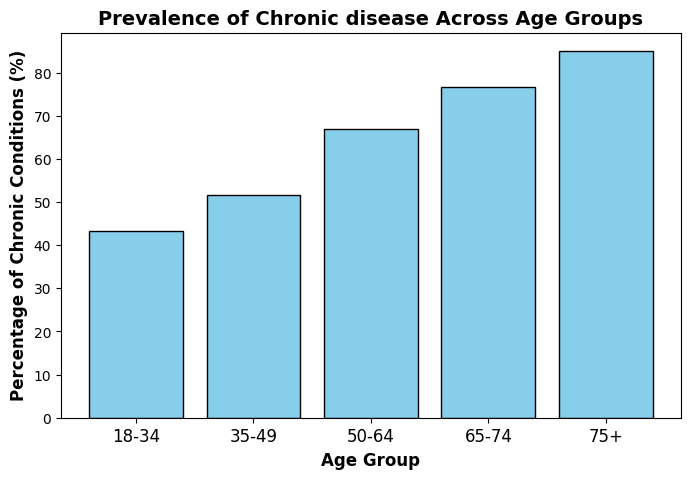

In [ ]:
import matplotlib.pyplot as plt

# Define mapping for age groups
age_mapping = {
    1: "18-34",
    2: "35-49",
    3: "50-64",
    4: "65-74",
    5: "75+"
}

# Apply the mapping to replace AgeGrpB values
df_summary["AgeGrpB"] = df_summary["AgeGrpB"].map(age_mapping)

# Plot bar chart with updated age group labels
fig, ax = plt.subplots(figsize=(8, 5))

# Create bar chart with updated labels
ax.bar(df_summary["AgeGrpB"], df_summary["Percentage"], color="skyblue", edgecolor="black")

# Labels and title
plt.xlabel("Age Group", fontsize=12, fontweight='bold')
plt.ylabel("Percentage of Chronic Conditions (%)", fontsize=12, fontweight='bold')
plt.title("Prevalence of Chronic disease Across Age Groups", fontsize=14, fontweight='bold')

# Adjust x-axis labels
plt.xticks(fontsize=12, rotation=0)

# Display plot
plt.show()

#Filtering the Redundant Variables

In [ ]:
# Compute the correlation matrix
corr_matrix = df3.corr().abs()

# Select the upper triangle of the correlation matrix
upper_triangle = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find and print all pairs with correlation > 0.9
print("\nHighly Correlated Variable Pairs (Threshold > 0.9):\n")
for col1 in upper_triangle.columns:
    for col2 in upper_triangle.columns:
        if upper_triangle.loc[col1, col2] > 0.9:
            print(f"{col1} ↔ {col2} | Correlation: {upper_triangle.loc[col1, col2]:.4f}")


Highly Correlated Variable Pairs (Threshold > 0.9):

SocMed_SharedPers ↔ SocMed_Interacted | Correlation: 0.9336
Age ↔ AgeGrpB | Correlation: 0.9574


# Random Forest

In [ ]:
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import SMOTE
from collections import Counter
exclude_vars = ['Age', 'Weight','SocMed_SharedPers',
                'Height_Inches', 'MedConditions_HighBP', 'MedConditions_Diabetes', 'MedConditions_HeartCondition',
                'MedConditions_LungDisease','MedConditions_Depression','MedConditions_Diabetes','ChronicCondition'
                ]
X = df3.drop(columns=exclude_vars)
y = df3['ChronicCondition']

# Normalize the dataset using MinMaxScaler
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Split the dataset into training (85%) and testing (15%) using stratified sampling
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.15, stratify=y, random_state=42
)

# Applying SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

print(f"Original class distribution: {Counter(y)}")
print(f"Class distribution after SMOTE: {Counter(y_resampled)}")


# Define the hyperparameter values to loop over for Random Forest

n_estimators = [300, 400, 500]

max_depth = [10, 12, 15]

min_samples_split = [5, 8, 9]

min_samples_leaf = [2, 3, 4]

# Create lists to store results of each hyperparameter combination

results = []

# Define 5-fold cross-validation

kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Manual grid search through hyperparameters

for n_est in n_estimators:

    for depth in max_depth:

        for min_split in min_samples_split:

            for min_leaf in min_samples_leaf:

                # Create a RandomForestClassifier with the current hyperparameters

                model = RandomForestClassifier(

                    n_estimators=n_est,

                    max_depth=depth,

                    min_samples_split=min_split,

                    min_samples_leaf=min_leaf,

                    class_weight="balanced",
                    max_features="sqrt",

                    random_state=42

                )

                fold_accuracies = []

                # Perform 5-fold cross-validation

                print(f"\nHyperparameters: n_estimators={n_est}, max_depth={depth}, "

                      f"min_samples_split={min_split}, min_samples_leaf={min_leaf}")

                for fold, (train_index, val_index) in enumerate(kf.split(X_resampled, y_resampled), 1):

                    # Split training into training and validation sets

                    X_train_fold, X_val_fold = X_resampled[train_index], X_resampled[val_index]

                    y_train_fold, y_val_fold = y_resampled.iloc[train_index], y_resampled.iloc[val_index]

                    # Train the model on the training fold

                    model.fit(X_train_fold, y_train_fold)

                    # Validate the model

                    val_predictions = model.predict(X_val_fold)

                    fold_accuracy = accuracy_score(y_val_fold, val_predictions)

                    fold_accuracies.append(fold_accuracy)

                    # Print accuracy for each fold

                    print(f"Fold {fold} - Validation Accuracy: {fold_accuracy:.4f}")

                # Calculate the mean accuracy for this hyperparameter combination

                avg_accuracy = np.mean(fold_accuracies)

                # Print average accuracy for this hyperparameter combination

                print(f"Average Validation Accuracy for this combination: {avg_accuracy:.4f}\n")

                # Store the results

                results.append({

                    'n_estimators': n_est,

                    'max_depth': depth,

                    'min_samples_split': min_split,

                    'min_samples_leaf': min_leaf,

                    'average_cv_accuracy': avg_accuracy

                })

# Find and print the best hyperparameter combination based on cross-validation accuracy

best_result = max(results, key=lambda x: x['average_cv_accuracy'])

print("\nBest Hyperparameters:")

print(f"n_estimators: {best_result['n_estimators']}")

print(f"max_depth: {best_result['max_depth']}")

print(f"min_samples_split: {best_result['min_samples_split']}")

print(f"min_samples_leaf: {best_result['min_samples_leaf']}")

print(f"Average Cross-Validation Accuracy: {best_result['average_cv_accuracy']:.4f}")

# Use the best hyperparameters to create the final model

best_rf_model = RandomForestClassifier(

    n_estimators=best_result['n_estimators'],

    max_depth=best_result['max_depth'],

    min_samples_split=best_result['min_samples_split'],

    min_samples_leaf=best_result['min_samples_leaf'],

    class_weight="balanced",
    max_features="sqrt",

    random_state=42

)

# Train the best model on the entire resampled training dataset

best_rf_model.fit(X_resampled, y_resampled)

# Evaluate on the test set
y_test_pred = best_rf_model.predict(X_test)
y_test_prob = best_rf_model.predict_proba(X_test)[:, 1]

# Calculate testing accuracy
test_accuracy = accuracy_score(y_test, y_test_pred)

# Calculate additional performance metrics (Precision, Recall, F1, AUC)
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_test_pred)
roc_auc = roc_auc_score(y_test, y_test_prob)

print(f"\nTest Set Performance:")

print(f"Testing Accuracy: {test_accuracy:.4f}")

print(f"Precision: {precision:.4f}")

print(f"Recall: {recall:.4f}")

print(f"F1 Score: {f1:.4f}")

print(f"AUC Score: {roc_auc:.4f}")

# Feature Importance

feature_importances = best_rf_model.feature_importances_

# Create a DataFrame to display the feature importances alongside their variable names

importances_df = pd.DataFrame({

    'Feature': X.columns,  # Feature names

    'Importance': feature_importances  # Importance scores

})

# Sort by importance in descending order

importances_df = importances_df.sort_values(by='Importance', ascending=False)

# Display the top features

print("Top features by importance:")

print(importances_df.head(60))

Original class distribution: Counter({1: 9935, 0: 5191})
Class distribution after SMOTE: Counter({1: 8445, 0: 8445})

Hyperparameters: n_estimators=300, max_depth=10, min_samples_split=5, min_samples_leaf=2
Fold 1 - Validation Accuracy: 0.8227
Fold 2 - Validation Accuracy: 0.8307
Fold 3 - Validation Accuracy: 0.8153
Fold 4 - Validation Accuracy: 0.8363
Fold 5 - Validation Accuracy: 0.8206
Average Validation Accuracy for this combination: 0.8251


Hyperparameters: n_estimators=300, max_depth=10, min_samples_split=5, min_samples_leaf=3
Fold 1 - Validation Accuracy: 0.8209
Fold 2 - Validation Accuracy: 0.8292
Fold 3 - Validation Accuracy: 0.8168
Fold 4 - Validation Accuracy: 0.8319
Fold 5 - Validation Accuracy: 0.8230
Average Validation Accuracy for this combination: 0.8243


Hyperparameters: n_estimators=300, max_depth=10, min_samples_split=5, min_samples_leaf=4
Fold 1 - Validation Accuracy: 0.8233
Fold 2 - Validation Accuracy: 0.8304
Fold 3 - Validation Accuracy: 0.8153
Fold 4 - Validat

# Shap Value

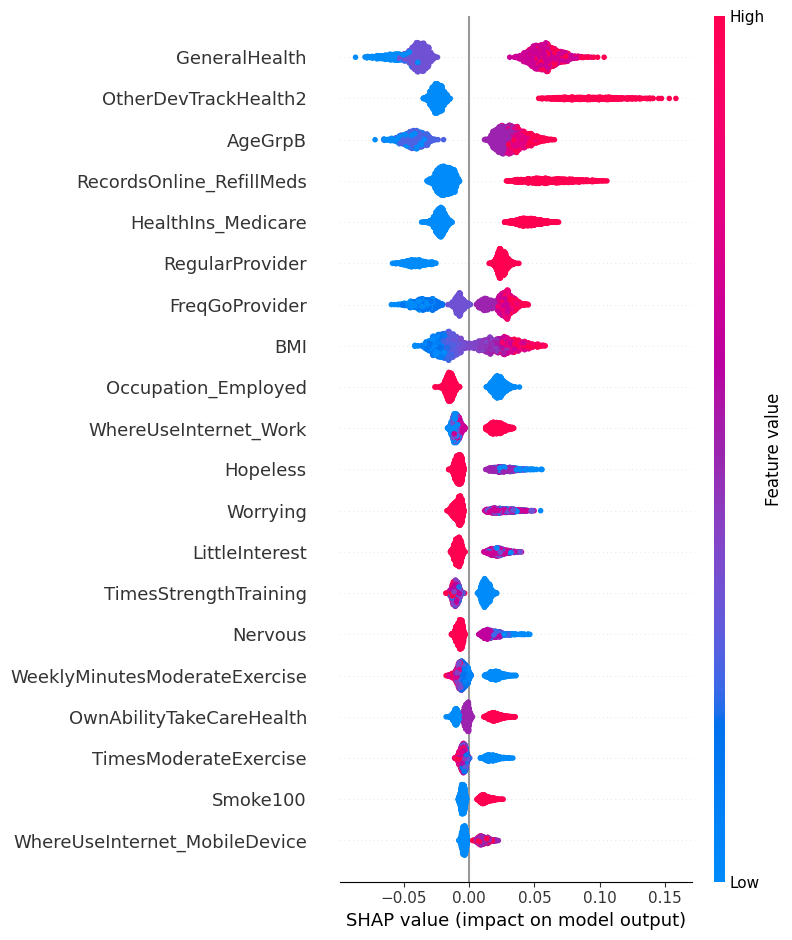

In [ ]:
# Initialize JavaScript visualization
shap.initjs()

# Create SHAP explainer for the Random Forest model
explainer = shap.TreeExplainer(best_rf_model)

# Calculate SHAP values for the test set
shap_values = explainer.shap_values(np.array(X_test))

# Create a summary plot for the top 20 features
shap.summary_plot(shap_values[:, :, 1],X_test, feature_names=X.columns, max_display=20)

# Precision Recall Curve

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


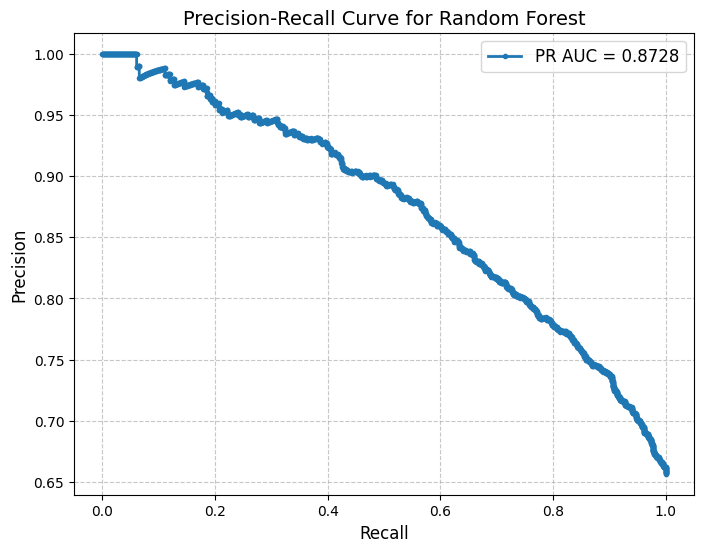

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, auc

# Get probability scores for the positive class (ChronicCondition = 1)
y_test_prob = best_rf_model.predict_proba(X_test)[:, 1]

# Compute Precision-Recall pairs
precision, recall, _ = precision_recall_curve(y_test, y_test_prob)

# Compute Area Under Precision-Recall Curve (PR-AUC)
pr_auc = auc(recall, precision)

# Plot Precision-Recall Curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', linestyle='-', linewidth=2, label=f'PR AUC = {pr_auc:.4f}')

# Improve visualization
plt.xlabel('Recall', fontsize=12)
plt.ylabel('Precision', fontsize=12)
plt.title('Precision-Recall Curve for Random Forest', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.show()

# ROC Curve

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


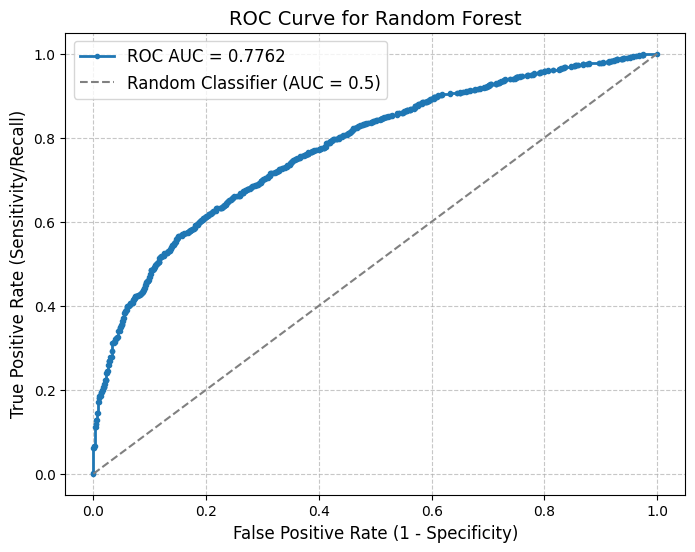

In [ ]:

# Get probability scores for the positive class (ChronicCondition = 1)
y_test_prob = best_rf_model.predict_proba(X_test)[:, 1]

# Compute False Positive Rate (FPR) and True Positive Rate (TPR)
fpr, tpr, _ = roc_curve(y_test, y_test_prob)

# Compute AUC-ROC Score
roc_auc = auc(fpr, tpr)

# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, marker='.', linestyle='-', linewidth=2, label=f'ROC AUC = {roc_auc:.4f}')

# Plot the random classifier baseline (diagonal line)
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Classifier (AUC = 0.5)')

# Labels and title
plt.xlabel('False Positive Rate (1 - Specificity)', fontsize=12)
plt.ylabel('True Positive Rate (Sensitivity/Recall)', fontsize=12)
plt.title('ROC Curve for Random Forest', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.show()

# Gradient Boosting

In [ ]:
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import SMOTE
from collections import Counter

exclude_vars = ['Age', 'Weight','SocMed_SharedPers',
                'Height_Inches', 'MedConditions_HighBP', 'MedConditions_Diabetes', 'MedConditions_HeartCondition',
                'MedConditions_LungDisease','MedConditions_Depression','MedConditions_Diabetes','ChronicCondition'
                ]
X = df3.drop(columns=exclude_vars)
y = df3['ChronicCondition']

# Normalize the dataset using MinMaxScaler
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Split the dataset into training (85%) and testing (15%) using stratified sampling
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.15, stratify=y, random_state=42
)

# Applying SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

print(f"Original class distribution: {Counter(y)}")
print(f"Class distribution after SMOTE: {Counter(y_resampled)}")

# Define Hyperparameter Grid for Gradient Boosting
n_estimators = [200, 300]
learning_rates = [0.01,0.05]
max_depths = [5, 7]
min_samples_splits = [5, 10]
min_samples_leafs = [2, 5]

# Create lists to store results of each hyperparameter combination
results = []

# 5-fold cross-validation setup
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Grid search through hyperparameters for Gradient Boosting
for n_est in n_estimators:
    for learning_rate in learning_rates:
        for max_depth in max_depths:
            for min_split in min_samples_splits:
                for min_leaf in min_samples_leafs:

                        # Initialize the Gradient Boosting model
                        model = GradientBoostingClassifier(
                            n_estimators=n_est,
                            learning_rate=learning_rate,
                            max_depth=max_depth,
                            min_samples_split=min_split,
                            min_samples_leaf=min_leaf,
                            random_state=42
                        )

                        fold_accuracies = []

            # Cross-validation loop
            print(f"\nHyperparameters: n_estimators={n_est}, learning_rate={learning_rate}, max_depth={max_depth}, "
                  f"min_samples_split={min_split}, min_samples_leaf={min_leaf}")

            for fold, (train_index, val_index) in enumerate(kf.split(X_resampled, y_resampled), 1):
                # Split training into training and validation sets
                X_train_fold, X_val_fold = X_resampled[train_index], X_resampled[val_index]
                y_train_fold, y_val_fold = y_resampled.iloc[train_index], y_resampled.iloc[val_index]

                # Train the model on the training fold
                model.fit(X_train_fold, y_train_fold)

                # Validate the model
                val_predictions = model.predict(X_val_fold)
                fold_accuracy = accuracy_score(y_val_fold, val_predictions)
                fold_accuracies.append(fold_accuracy)

                # Print accuracy for each fold
                print(f"Fold {fold} - Validation Accuracy: {fold_accuracy:.4f}")

            # Calculate the mean accuracy for this hyperparameter combination
            avg_accuracy = np.mean(fold_accuracies)
            print(f"Average Validation Accuracy for this combination: {avg_accuracy:.4f}\n")

            # Store the results
            results.append({
                'n_estimators': n_est,
                'learning_rate': learning_rate,
                'max_depth': max_depth,
                'min_samples_split': min_split,
                'min_samples_leaf': min_leaf,
                'average_cv_accuracy': avg_accuracy
            })

# Find and print the best hyperparameter combination based on cross-validation accuracy
best_result = max(results, key=lambda x: x['average_cv_accuracy'])
print("\nBest Hyperparameters:")
print(f"n_estimators: {best_result['n_estimators']}")
print(f"learning_rate: {best_result['learning_rate']}")
print(f"max_depth: {best_result['max_depth']}")
print(f"min_samples_split: {best_result['min_samples_split']}")
print(f"min_samples_leaf: {best_result['min_samples_leaf']}")
print(f"Average Cross-Validation Accuracy: {best_result['average_cv_accuracy']:.4f}")

# Use the best hyperparameters to create the final Gradient Boosting model
best_gb_model = GradientBoostingClassifier(
    n_estimators=best_result['n_estimators'],
    learning_rate=best_result['learning_rate'],
    max_depth=best_result['max_depth'],
    min_samples_split=best_result['min_samples_split'],
    min_samples_leaf=best_result['min_samples_leaf'],
    random_state=42
)

# Train the best model on the entire training set
best_gb_model.fit(X_resampled, y_resampled)

# Evaluate on the test set
y_test_pred = best_gb_model.predict(X_test)
y_test_prob = best_gb_model.predict_proba(X_test)[:, 1]

# Calculate testing accuracy
test_accuracy = accuracy_score(y_test, y_test_pred)

# Calculate additional performance metrics (Precision, Recall, F1, AUC)
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_test_pred)
roc_auc = roc_auc_score(y_test, y_test_prob)

print(f"\nTest Set Performance for Gradient Boosting Classifier:")
print(f"Testing Accuracy: {test_accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"AUC Score: {roc_auc:.4f}")

# Get feature importances from the trained Gradient Boosting model
feature_importances = best_gb_model.feature_importances_

# Create a DataFrame for better visualization
feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Display the top 20 important features
print(feature_importance_df.head(60))

Original class distribution: Counter({1: 9935, 0: 5191})
Class distribution after SMOTE: Counter({1: 8445, 0: 8445})

Hyperparameters: n_estimators=200, learning_rate=0.01, max_depth=5, min_samples_split=10, min_samples_leaf=5
Fold 1 - Validation Accuracy: 0.8173
Fold 2 - Validation Accuracy: 0.8271
Fold 3 - Validation Accuracy: 0.8105
Fold 4 - Validation Accuracy: 0.8274
Fold 5 - Validation Accuracy: 0.8123
Average Validation Accuracy for this combination: 0.8189


Hyperparameters: n_estimators=200, learning_rate=0.01, max_depth=7, min_samples_split=10, min_samples_leaf=5
Fold 1 - Validation Accuracy: 0.8182
Fold 2 - Validation Accuracy: 0.8313
Fold 3 - Validation Accuracy: 0.8171
Fold 4 - Validation Accuracy: 0.8283
Fold 5 - Validation Accuracy: 0.8185
Average Validation Accuracy for this combination: 0.8227


Hyperparameters: n_estimators=200, learning_rate=0.05, max_depth=5, min_samples_split=10, min_samples_leaf=5
Fold 1 - Validation Accuracy: 0.8398
Fold 2 - Validation Accuracy: 

# Shap value

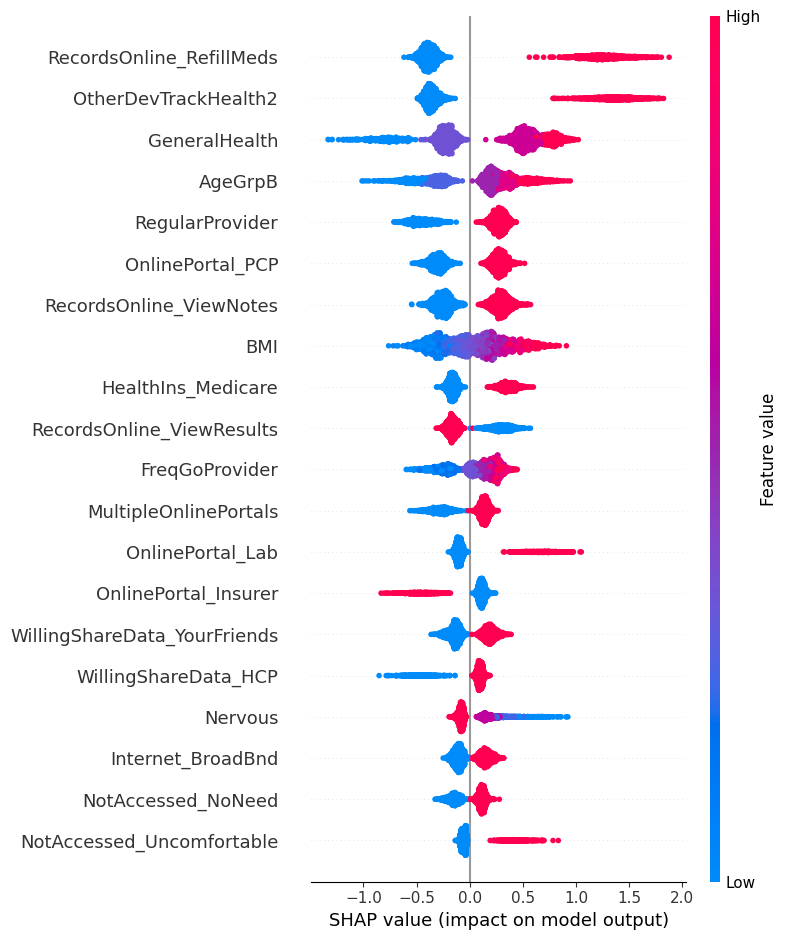

In [ ]:
# Initialize JavaScript visualization
shap.initjs()

# Create a SHAP explainer for the Gradient Boosting model
explainer = shap.TreeExplainer(best_gb_model)

# Calculate SHAP values for the test set
shap_values = explainer.shap_values(X_test)

# SHAP summary plot for the top 20 features
shap.summary_plot(shap_values, X_test, feature_names=X.columns, max_display=20)

# Precision Recall Curve

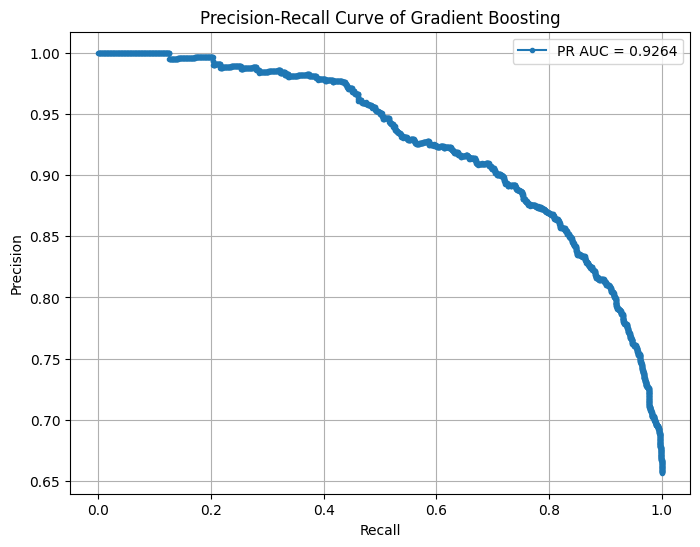

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, auc

# Get model probability scores for the positive class
y_test_prob = best_gb_model.predict_proba(X_test)[:, 1]

# Compute precision-recall pairs
precision, recall, _ = precision_recall_curve(y_test, y_test_prob)

# Compute Area Under Precision-Recall Curve (PR-AUC)
pr_auc = auc(recall, precision)

# Plot PR Curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', label=f'PR AUC = {pr_auc:.4f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve of Gradient Boosting')
plt.legend()
plt.grid()
plt.show()

# ROC Curve

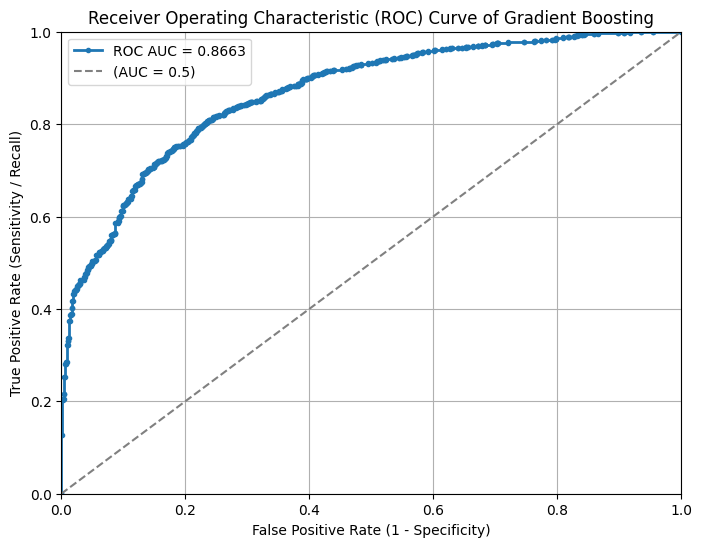

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Get probability scores for the positive class
y_test_prob = best_gb_model.predict_proba(X_test)[:, 1]

# Compute FPR, TPR, and thresholds
fpr, tpr, _ = roc_curve(y_test, y_test_prob)

# Compute Area Under ROC Curve (AUC-ROC)
roc_auc = auc(fpr, tpr)

# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, marker='.', linestyle='-', linewidth=2, label=f'ROC AUC = {roc_auc:.4f}')

# Plot the random classifier baseline (dashed diagonal line)
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='(AUC = 0.5)')

# Labels and title
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity / Recall)')
plt.title('Receiver Operating Characteristic (ROC) Curve of Gradient Boosting')
plt.legend()
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.grid()

# Show the plot
plt.show()

# Logistic Regression

In [ ]:
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import SMOTE
from collections import Counter

exclude_vars = ['Age', 'Weight','SocMed_SharedPers',
                'Height_Inches', 'MedConditions_HighBP', 'MedConditions_Diabetes', 'MedConditions_HeartCondition',
                'MedConditions_LungDisease','MedConditions_Depression','MedConditions_Diabetes','ChronicCondition'
                ]
X = df3.drop(columns=exclude_vars)
y = df3['ChronicCondition']

# Normalize the dataset using MinMaxScaler
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Split the dataset into training (85%) and testing (15%) using stratified sampling
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.15, stratify=y, random_state=42
)

# Applying SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

print(f"Original class distribution: {Counter(y)}")
print(f"Class distribution after SMOTE: {Counter(y_resampled)}")

# Define the hyperparameter values for Logistic Regression with Elastic Net
C_values = [0.1, 0.5,1]
l1_ratios = [0.5, 0.7, 0.9]
max_iter_values = [800,900,1000]

# Create lists to store results of each hyperparameter combination
results = []

# 5-fold cross-validation setup
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Grid search through hyperparameters, only with Elastic Net penalty
for C in C_values:
    for l1_ratio in l1_ratios:
        for max_iter in max_iter_values:
            # Initialize the model with Elastic Net
            model = LogisticRegression(
                C=C,
                penalty='elasticnet',
                solver='saga',
                class_weight='balanced',
                l1_ratio=l1_ratio,
                max_iter=max_iter,
                random_state=42
            )

            fold_accuracies = []

            # Cross-validation loop
            print(f"\nHyperparameters: C={C}, l1_ratio={l1_ratio}, "
                  f"max_iter={max_iter}")

            for fold, (train_index, val_index) in enumerate(kf.split(X_resampled,y_resampled), 1):
                # Split training into training and validation sets
                X_train_fold, X_val_fold = X_resampled[train_index], X_resampled[val_index]
                y_train_fold, y_val_fold = y_resampled.iloc[train_index], y_resampled.iloc[val_index]

                # Train the model on the training fold
                model.fit(X_train_fold, y_train_fold)

                # Validate the model
                val_predictions = model.predict(X_val_fold)
                fold_accuracy = accuracy_score(y_val_fold, val_predictions)
                fold_accuracies.append(fold_accuracy)

                # Print accuracy for each fold
                print(f"Fold {fold} - Validation Accuracy: {fold_accuracy:.4f}")

            # Calculate the mean accuracy for this hyperparameter combination
            avg_accuracy = np.mean(fold_accuracies)
            print(f"Average Validation Accuracy for this combination: {avg_accuracy:.4f}\n")

            # Store the results
            results.append({
                'C': C,
                'l1_ratio': l1_ratio,
                'max_iter': max_iter,
                'average_cv_accuracy': avg_accuracy
            })

# Find and print the best hyperparameter combination based on cross-validation accuracy
best_result = max(results, key=lambda x: x['average_cv_accuracy'])
print("\nBest Hyperparameters:")
print(f"C: {best_result['C']}")
print(f"l1_ratio: {best_result['l1_ratio']}")
print(f"max_iter: {best_result['max_iter']}")
print(f"Average Cross-Validation Accuracy: {best_result['average_cv_accuracy']:.4f}")

# Use the best hyperparameters to create the final Logistic Regression model
best_logistic_model = LogisticRegression(
    C=best_result['C'],
    penalty='elasticnet',
    solver='saga',
    l1_ratio=best_result['l1_ratio'],
    class_weight= 'balanced',
    max_iter=best_result['max_iter'],
    random_state=42
)

# Train the best model on the entire training set
best_logistic_model.fit(X_resampled, y_resampled)

# Evaluate on the test set
y_test_pred = best_logistic_model.predict(X_test)

# Calculate testing accuracy
test_accuracy = accuracy_score(y_test, y_test_pred)

# Calculate additional performance metrics (Precision, Recall, F1, AUC)
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_test_pred)
roc_auc = roc_auc_score(y_test, y_test_pred)

print(f"\nTest Set Performance for Logistic Regression:")
print(f"Testing Accuracy: {test_accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"AUC Score: {roc_auc:.4f}")

Original class distribution: Counter({1: 9935, 0: 5191})
Class distribution after SMOTE: Counter({1: 8445, 0: 8445})

Hyperparameters: C=0.1, l1_ratio=0.5, max_iter=800
Fold 1 - Validation Accuracy: 0.8398
Fold 2 - Validation Accuracy: 0.8372
Fold 3 - Validation Accuracy: 0.8330
Fold 4 - Validation Accuracy: 0.8384
Fold 5 - Validation Accuracy: 0.8333
Average Validation Accuracy for this combination: 0.8364


Hyperparameters: C=0.1, l1_ratio=0.5, max_iter=900
Fold 1 - Validation Accuracy: 0.8398
Fold 2 - Validation Accuracy: 0.8372
Fold 3 - Validation Accuracy: 0.8330
Fold 4 - Validation Accuracy: 0.8384
Fold 5 - Validation Accuracy: 0.8333
Average Validation Accuracy for this combination: 0.8364


Hyperparameters: C=0.1, l1_ratio=0.5, max_iter=1000
Fold 1 - Validation Accuracy: 0.8398
Fold 2 - Validation Accuracy: 0.8372
Fold 3 - Validation Accuracy: 0.8330
Fold 4 - Validation Accuracy: 0.8384
Fold 5 - Validation Accuracy: 0.8333
Average Validation Accuracy for this combination: 0.836

In [ ]:
# Assuming X was originally a DataFrame before scaling or transformation
feature_names = X.columns  # Save original column names before scaling

# Create feature importance DataFrame with correct column names
feature_importances = pd.DataFrame({
    'Feature': feature_names,
    'Importance': best_logistic_model.coef_[0]
})

# Sort by importance
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)
print(feature_importances.head(60))

                           Feature  Importance
186        RecordsOnline_ViewNotes    3.746026
195          MultipleOnlinePortals    3.614637
132       RecordsOnline_RefillMeds    3.546248
191               OnlinePortal_Lab    3.528425
12               Internet_BroadBnd    3.399559
127           OtherDevTrackHealth2    3.348986
177                      BringTest    3.034849
14                   Internet_WiFi    2.871136
188               OnlinePortal_PCP    2.610966
165             Internet_HighSpeed    2.345696
76       NotAccessed_Uncomfortable    2.220167
56          HealthIns_InsuranceEmp    2.156770
68           HCPEncourageOnlineRec    2.116230
166         Electronic2_MessageDoc    2.066394
87                   GeneralHealth    2.021914
37    WillingShareData_YourFriends    1.989916
181           DiscriminatedMedCare    1.982975
58              HealthIns_Medicare    1.836998
32           Tablet_DiscussionsHCP    1.701636
116                            BMI    1.682400
42           

# Shap Value

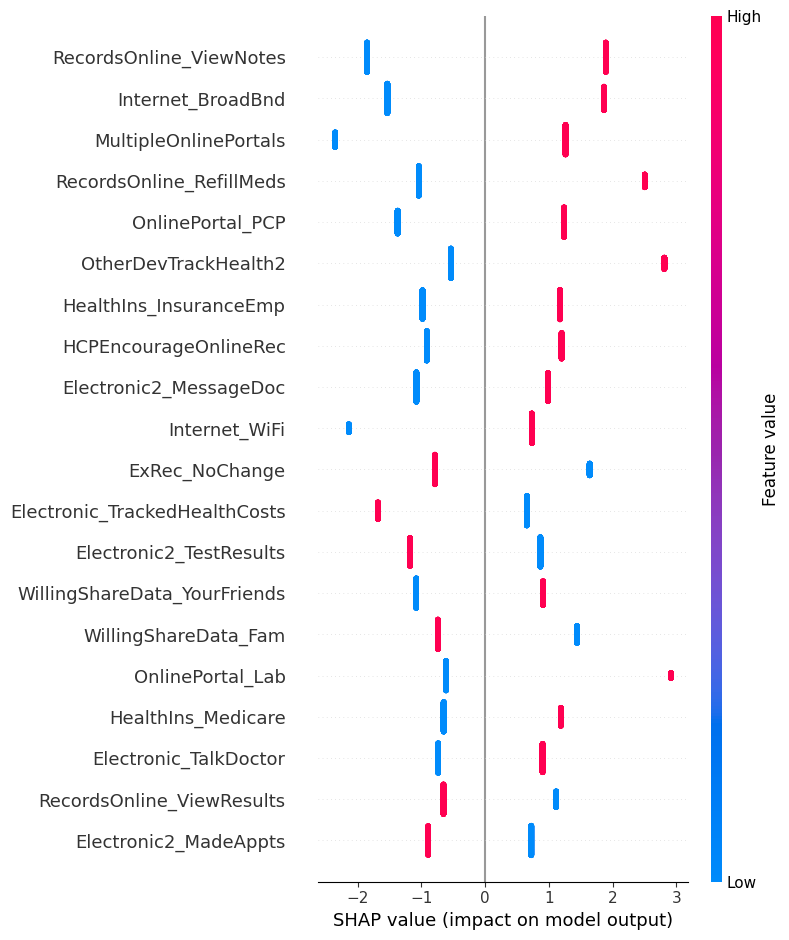

In [ ]:
# Initialize JavaScript visualization
shap.initjs()

# Create SHAP explainer for Logistic Regression model
explainer = shap.LinearExplainer(best_logistic_model, X_resampled)

# Calculate SHAP values for the test set
shap_values = explainer.shap_values(X_test)

# Create a summary plot for the top 20 features
shap.summary_plot(shap_values, X_test, feature_names= X.columns, max_display=20)

# Precision Recall Curve

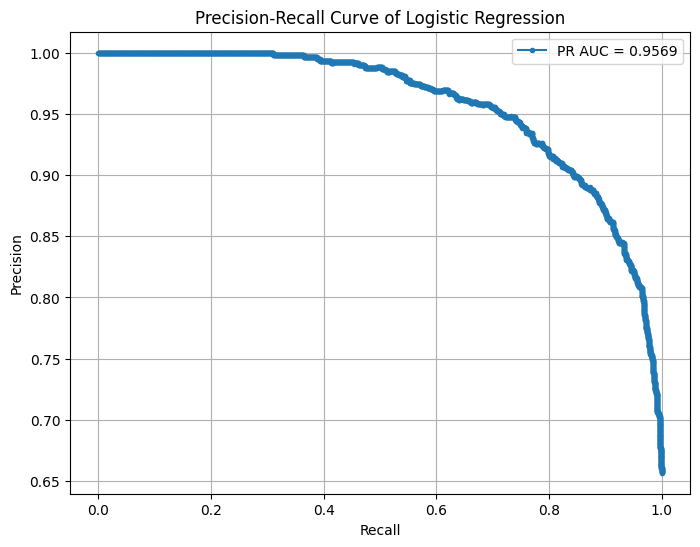

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, auc

# Get model probability scores for the positive class
y_test_prob = best_logistic_model.predict_proba(X_test)[:, 1]

# Compute precision-recall pairs
precision, recall, _ = precision_recall_curve(y_test, y_test_prob)

# Compute Area Under Precision-Recall Curve (PR-AUC)
pr_auc = auc(recall, precision)

# Plot PR Curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', label=f'PR AUC = {pr_auc:.4f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve of Logistic Regression')
plt.legend()
plt.grid()
plt.show()

# ROC Curve

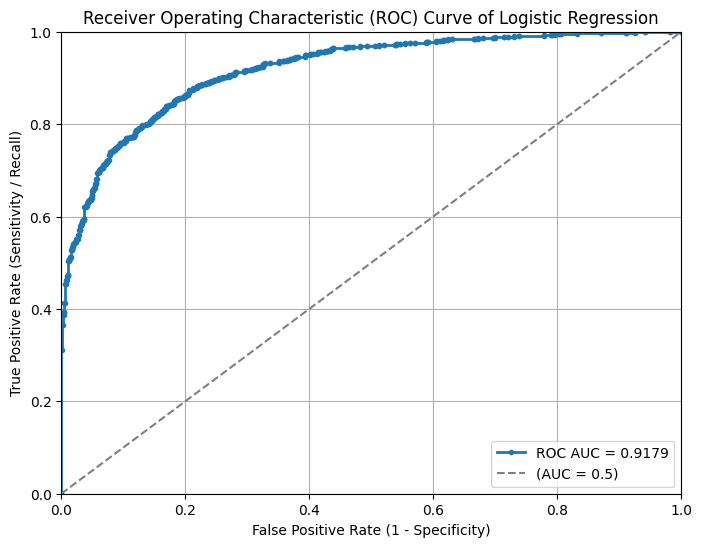

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Get probability scores for the positive class
y_test_prob = best_logistic_model.predict_proba(X_test)[:, 1]

# Compute FPR, TPR, and thresholds
fpr, tpr, _ = roc_curve(y_test, y_test_prob)

# Compute Area Under ROC Curve (AUC-ROC)
roc_auc = auc(fpr, tpr)

# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, marker='.', linestyle='-', linewidth=2, label=f'ROC AUC = {roc_auc:.4f}')

# Plot the random classifier baseline (dashed diagonal line)
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='(AUC = 0.5)')

# Labels and title
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity / Recall)')
plt.title('Receiver Operating Characteristic (ROC) Curve of Logistic Regression')
plt.legend()
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.grid()

# Show the plot
plt.show()

# SVM

In [ ]:
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import SMOTE
from collections import Counter
exclude_vars = ['Age', 'Weight','SocMed_SharedPers',
                'Height_Inches', 'MedConditions_HighBP', 'MedConditions_Diabetes', 'MedConditions_HeartCondition',
                'MedConditions_LungDisease','MedConditions_Depression','MedConditions_Diabetes','ChronicCondition'
                ]
X = df3.drop(columns=exclude_vars)
y = df3['ChronicCondition']

# Normalize the dataset using MinMaxScaler
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Split the dataset into training (85%) and testing (15%) using stratified sampling
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.15, stratify=y, random_state=42
)

# Applying SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

print(f"Original class distribution: {Counter(y)}")
print(f"Class distribution after SMOTE: {Counter(y_resampled)}")

# Define Hyperparameter Grid for SVM
C_values = [1, 10]
kernels = ['rbf', 'poly']
gammas = ['scale', 'auto']

# Create lists to store results of each hyperparameter combination
results = []

# 5-fold cross-validation setup
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Grid search through hyperparameters for SVM
for C in C_values:
    for kernel in kernels:
        for gamma in gammas:

            # Initialize the SVM model
            model = SVC(
                C=C,
                kernel=kernel,
                gamma=gamma,
                class_weight='balanced',  # Handle class imbalance
                probability=True,  # For probability estimates
                random_state=42
            )

            fold_accuracies = []

            # Cross-validation loop
            print(f"\nHyperparameters: C={C}, kernel={kernel}, gamma={gamma}")

            for fold, (train_index, val_index) in enumerate(kf.split(X_resampled,y_resampled), 1):
                # Split training into training and validation sets
                X_train_fold, X_val_fold = X_resampled[train_index], X_resampled[val_index]
                y_train_fold, y_val_fold = y_resampled.iloc[train_index], y_resampled.iloc[val_index]

                # Train the model on the training fold
                model.fit(X_train_fold, y_train_fold)

                # Validate the model
                val_predictions = model.predict(X_val_fold)
                fold_accuracy = accuracy_score(y_val_fold, val_predictions)
                fold_accuracies.append(fold_accuracy)

                # Print accuracy for each fold
                print(f"Fold {fold} - Validation Accuracy: {fold_accuracy:.4f}")

            # Calculate the mean accuracy for this hyperparameter combination
            avg_accuracy = np.mean(fold_accuracies)
            print(f"Average Validation Accuracy for this combination: {avg_accuracy:.4f}\n")

            # Store the results
            results.append({
                'C': C,
                'kernel': kernel,
                'gamma': gamma,
                'average_cv_accuracy': avg_accuracy
            })

# Find and print the best hyperparameter combination based on cross-validation accuracy
best_result = max(results, key=lambda x: x['average_cv_accuracy'])
print("\nBest Hyperparameters:")
print(f"C: {best_result['C']}")
print(f"Kernel: {best_result['kernel']}")
print(f"Gamma: {best_result['gamma']}")
print(f"Average Cross-Validation Accuracy: {best_result['average_cv_accuracy']:.4f}")

# Use the best hyperparameters to create the final SVM model
best_svm_model = SVC(
    C=best_result['C'],
    kernel=best_result['kernel'],
    gamma=best_result['gamma'],
    class_weight='balanced',
    probability=True,
    random_state=42
)

# Train the best model on the entire training set
best_svm_model.fit(X_resampled, y_resampled)

# Evaluate on the test set
y_test_pred = best_svm_model.predict(X_test)
y_test_prob = best_svm_model.predict_proba(X_test)[:, 1]

# Calculate testing accuracy
test_accuracy = accuracy_score(y_test, y_test_pred)

# Calculate additional performance metrics (Precision, Recall, F1, AUC)
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_test_pred)
roc_auc = roc_auc_score(y_test, y_test_prob)

print(f"\nTest Set Performance for SVM Classifier:")
print(f"Testing Accuracy: {test_accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"AUC Score: {roc_auc:.4f}")

Original class distribution: Counter({1: 9935, 0: 5191})
Class distribution after SMOTE: Counter({1: 8445, 0: 8445})

Hyperparameters: C=1, kernel=rbf, gamma=scale
Fold 1 - Validation Accuracy: 0.8638
Fold 2 - Validation Accuracy: 0.8683
Fold 3 - Validation Accuracy: 0.8603
Fold 4 - Validation Accuracy: 0.8697
Fold 5 - Validation Accuracy: 0.8697
Average Validation Accuracy for this combination: 0.8664


Hyperparameters: C=1, kernel=rbf, gamma=auto
Fold 1 - Validation Accuracy: 0.8351
Fold 2 - Validation Accuracy: 0.8357
Fold 3 - Validation Accuracy: 0.8301
Fold 4 - Validation Accuracy: 0.8425
Fold 5 - Validation Accuracy: 0.8354
Average Validation Accuracy for this combination: 0.8358


Hyperparameters: C=1, kernel=poly, gamma=scale
Fold 1 - Validation Accuracy: 0.8730
Fold 2 - Validation Accuracy: 0.8751
Fold 3 - Validation Accuracy: 0.8727
Fold 4 - Validation Accuracy: 0.8766
Fold 5 - Validation Accuracy: 0.8834
Average Validation Accuracy for this combination: 0.8761


Hyperparamet

# Shap value

In [ ]:
# Initialize SHAP visualization
shap.initjs()

# Use a small background sample from the training set for KernelExplainer
background_data = shap.sample(X_train_scaled, 100)  # Reduce computation time

# Create KernelExplainer for SVM
explainer = shap.KernelExplainer(best_svm_model.predict_proba, background_data)

# Compute SHAP values for the test set
shap_values = explainer.shap_values(X_test)

# Define feature names
feature_names = X.columns.tolist()

# SHAP Summary Plot for Top 20 Features
shap.summary_plot(shap_values[1], X_test, feature_names=feature_names, max_display=20)

In [ ]:
# Calculate the feature importance from the support vector machine
importances = best_svm_model.coef_[0]
# Prin the top 60 features
top_features = np.argsort(importances)[-60:]
print(top_features)

# Precision Recall curve

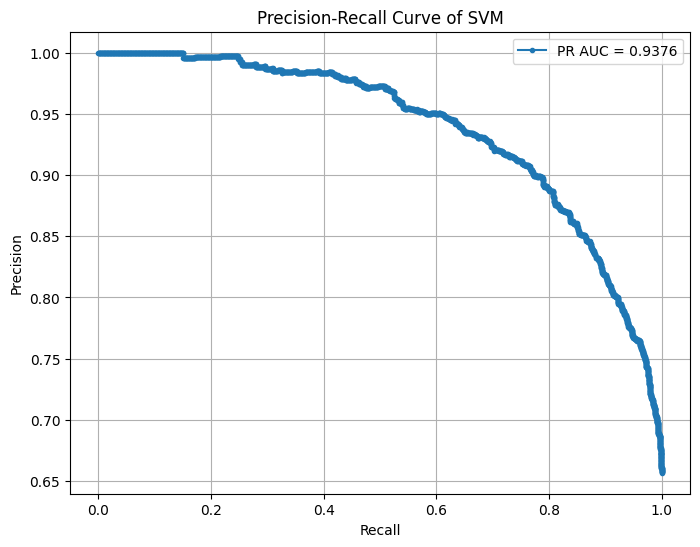

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, auc

# Get model probability scores for the positive class
y_test_prob = best_svm_model.predict_proba(X_test)[:, 1]

# Compute precision-recall pairs
precision, recall, _ = precision_recall_curve(y_test, y_test_prob)

# Compute Area Under Precision-Recall Curve (PR-AUC)
pr_auc = auc(recall, precision)

# Plot PR Curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', label=f'PR AUC = {pr_auc:.4f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve of SVM')
plt.legend()
plt.grid()
plt.show()

# ROC Curve

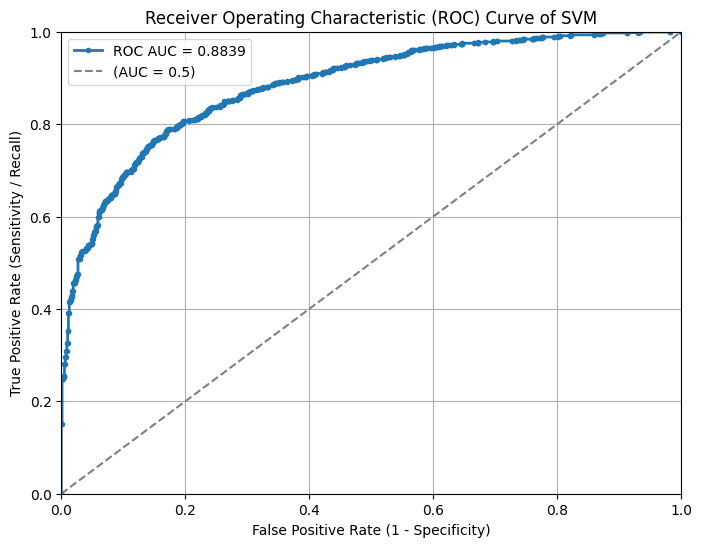

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Get probability scores for the positive class
y_test_prob = best_svm_model.predict_proba(X_test)[:, 1]

# Compute FPR, TPR, and thresholds
fpr, tpr, _ = roc_curve(y_test, y_test_prob)

# Compute Area Under ROC Curve (AUC-ROC)
roc_auc = auc(fpr, tpr)

# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, marker='.', linestyle='-', linewidth=2, label=f'ROC AUC = {roc_auc:.4f}')

# Plot the random classifier baseline (dashed diagonal line)
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='(AUC = 0.5)')

# Labels and title
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity / Recall)')
plt.title('Receiver Operating Characteristic (ROC) Curve of SVM')
plt.legend()
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.grid()

# Show the plot
plt.show()

# Deep Learning

In [ ]:
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import SMOTE
from collections import Counter
exclude_vars = ['Age', 'Weight','SocMed_SharedPers',
                'Height_Inches', 'MedConditions_HighBP', 'MedConditions_Diabetes', 'MedConditions_HeartCondition',
                'MedConditions_LungDisease','MedConditions_Depression','MedConditions_Diabetes','ChronicCondition'
                ]
X = df3.drop(columns=exclude_vars)
y = df3['ChronicCondition']

# Normalize the dataset using MinMaxScaler
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Split the dataset into training (85%) and testing (15%) using stratified sampling
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.15, stratify=y, random_state=42
)

# Applying SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

print(f"Original class distribution: {Counter(y)}")
print(f"Class distribution after SMOTE: {Counter(y_resampled)}")

# Define the hyperparameter grid manually
batch_sizes = [16, 32, 64]
learning_rates = [0.001, 0.01, 0.1]
neurons = [64, 128, 256]

# Stratified K-Fold setup
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# To store results
results = []

# Manual Grid Search for Hyperparameter Tuning
for batch_size in batch_sizes:
    for learning_rate in learning_rates:
        for neuron in neurons:
            print(f"\nTesting batch_size={batch_size}, learning_rate={learning_rate}, neurons={neuron}")

            fold_accuracies = []

            for fold, (train_index, val_index) in enumerate(kf.split(X_resampled, y_resampled), 1):

                # Define the Deep Learning model architecture
                model = keras.Sequential([
                    layers.Input(shape=(X_resampled.shape[1],)),
                    layers.Dense(neuron, activation='relu'),
                    layers.Dropout(0.3),
                    layers.Dense(neuron // 2, activation='relu'),
                    layers.Dropout(0.3),
                    layers.Dense(neuron // 4, activation='relu'),
                    layers.Dropout(0.3),
                    layers.Dense(1, activation='sigmoid')
                ])

                # Compile the model with specified learning rate
                model.compile(
                    optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
                    loss='binary_crossentropy',
                    metrics=['accuracy']
                )

                # Split the data into training and validation sets
                X_train_fold, X_val_fold = X_resampled[train_index], X_resampled[val_index]
                y_train_fold, y_val_fold = y_resampled[train_index], y_resampled[val_index]

                # Train the model
                model.fit(X_train_fold, y_train_fold,
                          validation_data=(X_val_fold, y_val_fold),
                          epochs=20,
                          batch_size=batch_size,
                          verbose=0)

                # Evaluate the model
                val_loss, val_accuracy = model.evaluate(X_val_fold, y_val_fold, verbose=0)
                fold_accuracies.append(val_accuracy)
                print(f"Fold {fold} - Validation Accuracy: {val_accuracy:.4f}")

            # Average accuracy for this combination
            avg_accuracy = np.mean(fold_accuracies)
            print(f"Average Validation Accuracy: {avg_accuracy:.4f}\n")

            # Store the result
            results.append({
                'batch_size': batch_size,
                'learning_rate': learning_rate,
                'neurons': neuron,
                'average_cv_accuracy': avg_accuracy
            })

# Find the best hyperparameter combination
best_result = max(results, key=lambda x: x['average_cv_accuracy'])
print("\nBest Hyperparameters:")
print(f"Batch Size: {best_result['batch_size']}")
print(f"Learning Rate: {best_result['learning_rate']}")
print(f"Neurons: {best_result['neurons']}")
print(f"Average Cross-Validation Accuracy: {best_result['average_cv_accuracy']:.4f}")

# Build the Final Deep Learning Model with Best Hyperparameters
deep_lr_model = keras.Sequential([
    layers.Input(shape=(X_resampled.shape[1],)),
    layers.Dense(best_result['neurons'], activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(best_result['neurons'] // 2, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(best_result['neurons'] // 4, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(1, activation='sigmoid')
])

# Compile the final model
deep_lr_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=best_result['learning_rate']),
    loss='binary_crossentropy',
    metrics=['accuracy', keras.metrics.Precision(), keras.metrics.Recall(), keras.metrics.AUC()]
)

# Train the model on the entire training set
deep_lr_model.fit(
    X_resampled, y_resampled,
    epochs=20,
    batch_size=best_result['batch_size'],
    verbose=1
)

# Evaluate on the test set
y_test_prob = deep_lr_model.predict(X_test).ravel()
y_test_pred = (y_test_prob > 0.5).astype(int)

# Calculate testing accuracy
test_accuracy = accuracy_score(y_test, y_test_pred)

# Calculate additional performance metrics (Precision, Recall, F1, AUC)
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_test_pred)
roc_auc = roc_auc_score(y_test, y_test_prob)

print(f"\nTest Set Performance for Deep Learning Model:")
print(f"Testing Accuracy: {test_accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"AUC Score: {roc_auc:.4f}")

Original class distribution: Counter({1: 9935, 0: 5191})
Class distribution after SMOTE: Counter({1: 8445, 0: 8445})

Testing batch_size=16, learning_rate=0.001, neurons=64
Fold 1 - Validation Accuracy: 0.8307
Fold 2 - Validation Accuracy: 0.8467
Fold 3 - Validation Accuracy: 0.8354
Fold 4 - Validation Accuracy: 0.8464
Fold 5 - Validation Accuracy: 0.8339
Average Validation Accuracy: 0.8386


Testing batch_size=16, learning_rate=0.001, neurons=128
Fold 1 - Validation Accuracy: 0.8428
Fold 2 - Validation Accuracy: 0.8461
Fold 3 - Validation Accuracy: 0.8446
Fold 4 - Validation Accuracy: 0.8449
Fold 5 - Validation Accuracy: 0.8470
Average Validation Accuracy: 0.8451


Testing batch_size=16, learning_rate=0.001, neurons=256
Fold 1 - Validation Accuracy: 0.8520
Fold 2 - Validation Accuracy: 0.8472
Fold 3 - Validation Accuracy: 0.8544
Fold 4 - Validation Accuracy: 0.8603
Fold 5 - Validation Accuracy: 0.8475
Average Validation Accuracy: 0.8523


Testing batch_size=16, learning_rate=0.01, neu

# Precision Recall Curve

71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


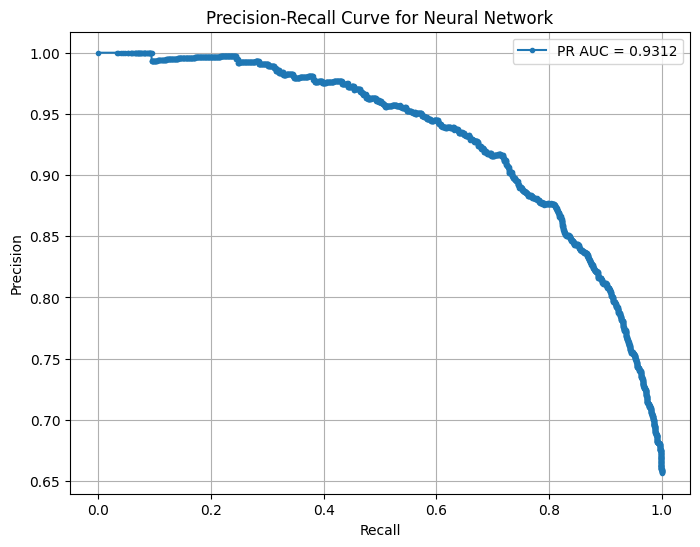

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, auc

# Get model probability scores for the positive class (chronic disease = 1)
y_test_prob = deep_lr_model.predict(X_test).ravel()  # Flatten the output if needed

# Compute precision-recall pairs
precision, recall, _ = precision_recall_curve(y_test, y_test_prob)

# Compute Area Under Precision-Recall Curve (PR-AUC)
pr_auc = auc(recall, precision)

# Plot Precision-Recall Curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', label=f'PR AUC = {pr_auc:.4f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve for Neural Network')
plt.legend()
plt.grid()
plt.show()

# ROC Curve

71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


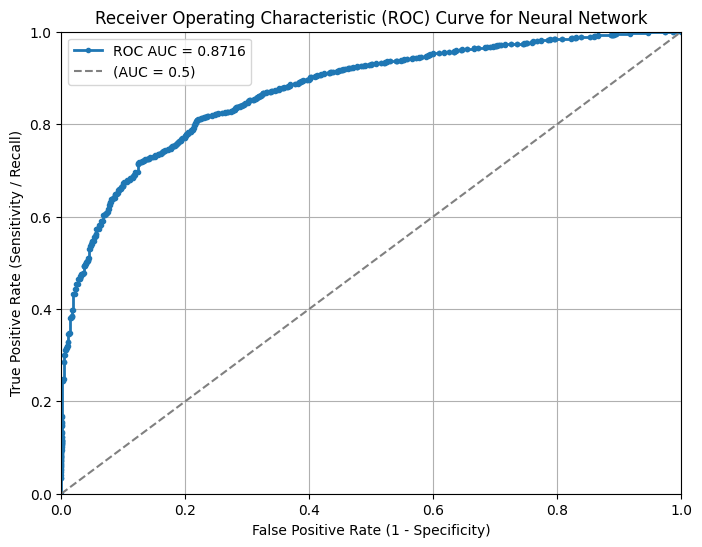

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Get predicted probabilities for the positive class (chronic disease = 1)
y_test_prob = deep_lr_model.predict(X_test).ravel()  # Ensure it's a 1D array

# Compute FPR, TPR, and thresholds
fpr, tpr, _ = roc_curve(y_test, y_test_prob)

# Compute Area Under ROC Curve (AUC-ROC)
roc_auc = auc(fpr, tpr)

# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, marker='.', linestyle='-', linewidth=2, label=f'ROC AUC = {roc_auc:.4f}')

# Plot the random classifier baseline (dashed diagonal line)
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='(AUC = 0.5)')

# Labels and title
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity / Recall)')
plt.title('Receiver Operating Characteristic (ROC) Curve for Neural Network')
plt.legend()
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.grid()

# Show the plot
plt.show()

# Summary of Approach 2

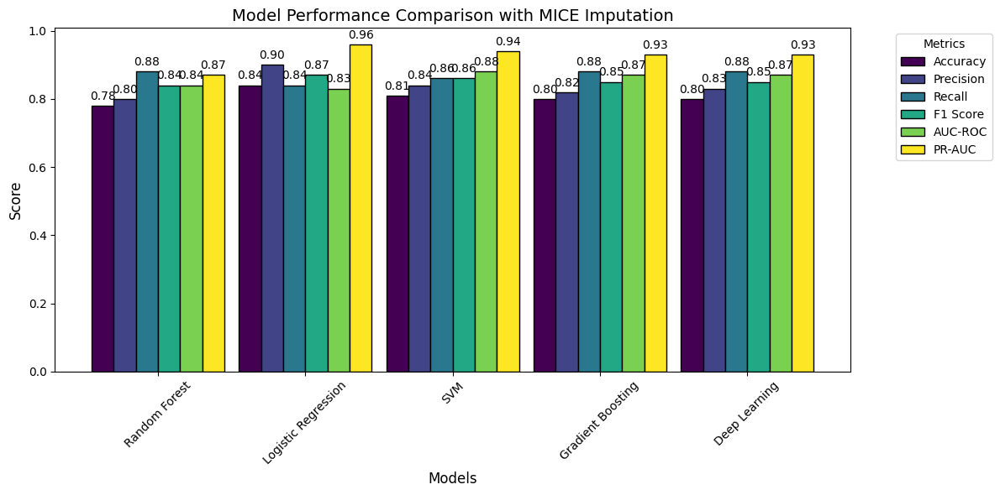

In [ ]:
import matplotlib.pyplot as plt

# Create a dictionary to store performance metrics for each model
# Store performance metrics for each model
model_performance = {
    "Random Forest": [0.78, 0.80, 0.88, 0.84, 0.84, 0.87],
    "Logistic Regression": [0.84, 0.90, 0.84, 0.87, 0.83, 0.96],
    "SVM": [0.81, 0.84, 0.86, 0.86, 0.88, 0.94],
    "Gradient Boosting": [0.80, 0.82, 0.88, 0.85, 0.87,0.93],
    "Deep Learning": [0.80, 0.83, 0.88, 0.85, 0.87, 0.93]
}

# Define metric names
metrics = ["Accuracy", "Precision", "Recall", "F1 Score", "AUC-ROC", "PR-AUC"]

# Convert dictionary into a DataFrame
df_performance = pd.DataFrame(model_performance, index=metrics)

# Plot grouped bar chart
ax = df_performance.T.plot(kind='bar', figsize=(12, 6), colormap='viridis', edgecolor='black', width = 0.9)

# Add value labels to bars
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f', fontsize=10, padding=3)

# Labels and title
plt.title("Model Performance Comparison with MICE Imputation", fontsize=14)
plt.xlabel("Models", fontsize=12)
plt.ylabel("Score", fontsize=12)
plt.xticks(rotation=45)
plt.legend(title="Metrics", bbox_to_anchor=(1.05, 1), loc='upper left')

# Show plot
plt.tight_layout()
plt.show()

# Approach 3 : Imputation with KNN

In [ ]:
# Load the dataset HINTS_Modified dataset
df2 = pd.read_excel('/content/drive/MyDrive/HINTS_Modified_IMP(na).xlsx')
# Check the dimension of the dataset
df2.head()

,SeekCancerInfo,CancerLotOfEffort,CancerFrustrated,CancerConfidentGetHealthInf,CancerTrustDoctor,CancerTrustFamily,CancerTrustGov,CancerTrustCharities,CancerTrustReligiousOrgs,StrongNeedCancerInfo,...,FeelLeftOut,FeelPeopleBarelyKnow,FeelIsolated,FeelPeopleNotWithMe,ChronicCondition,RaceEthn_Hispanic,RaceEthn_White,RaceEthn_Black,RaceEthn_Asian,RaceEthn_Others
0,1.0,3.0,3.0,3.0,1.0,2.0,2.0,2.0,3.0,7.0,...,NaN,NaN,NaN,NaN,1,0,1,0,0,0
1,1.0,3.0,3.0,1.0,2.0,3.0,3.0,3.0,4.0,6.0,...,NaN,NaN,NaN,NaN,0,0,1,0,0,0
2,1.0,3.0,4.0,1.0,2.0,2.0,2.0,4.0,4.0,6.0,...,NaN,NaN,NaN,NaN,1,0,1,0,0,0
3,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,4.0,4.0,...,NaN,NaN,NaN,NaN,0,0,1,0,0,0
4,0.0,NaN,NaN,2.0,1.0,1.0,2.0,1.0,1.0,6.0,...,NaN,NaN,NaN,NaN,1,0,1,0,0,0


In [ ]:
df2.isnull().sum() # Checking the missing values

,0
SeekCancerInfo,99
CancerLotOfEffort,6414
CancerFrustrated,6601
CancerConfidentGetHealthInf,11362
CancerTrustDoctor,266
...,...
RaceEthn_Hispanic,0
RaceEthn_White,0
RaceEthn_Black,0
RaceEthn_Asian,0


In [ ]:
from sklearn.impute import KNNImputer

# Extract column names from categorized lists
continuous_vars = [col[0] for col in continuous_vars]  # Continuous variables
ordinal_vars = [col[0] for col in ordinal_vars]  # Ordinal variables
binary_vars = [col[0] for col in binary_vars]  # Binary variables

# Initialize separate KNN Imputers for different data types**
knn_imputer_cont = KNNImputer(n_neighbors=10, weights="uniform")
knn_imputer_ord = KNNImputer(n_neighbors=10, weights="uniform")
knn_imputer_bin = KNNImputer(n_neighbors=10, weights="uniform")

# Apply KNN Imputation
df2[continuous_vars] = np.round(knn_imputer_cont.fit_transform(df2[continuous_vars]),2)
df2[ordinal_vars] = knn_imputer_ord.fit_transform(df2[ordinal_vars]).round().astype(int)
df2[binary_vars] = np.clip(knn_imputer_bin.fit_transform(df2[binary_vars]).round(), 0, 1).astype(int)

In [ ]:
# Varify the missing
df2.isnull().sum()

,0
SeekCancerInfo,0
CancerLotOfEffort,0
CancerFrustrated,0
CancerConfidentGetHealthInf,0
CancerTrustDoctor,0
...,...
RaceEthn_Hispanic,0
RaceEthn_White,0
RaceEthn_Black,0
RaceEthn_Asian,0


# Fixing the Outliers

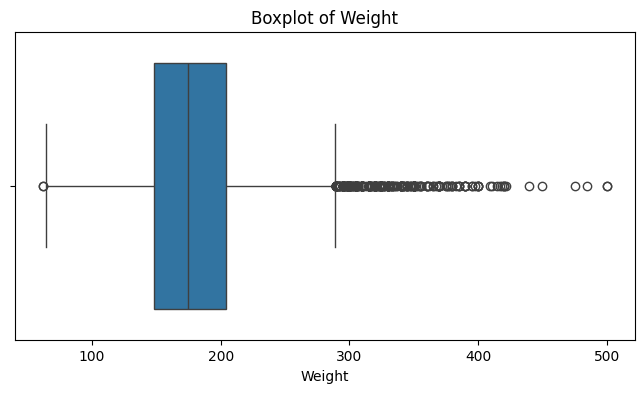

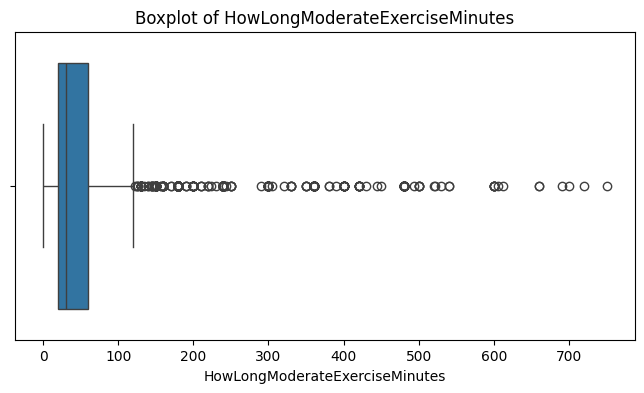

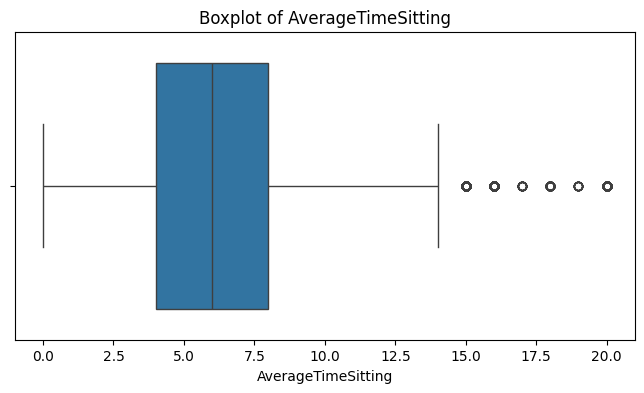

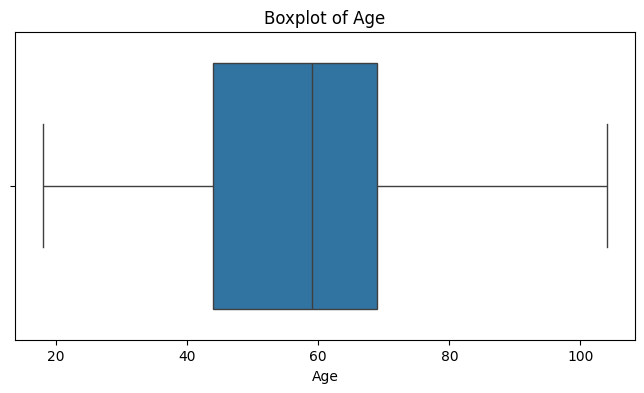

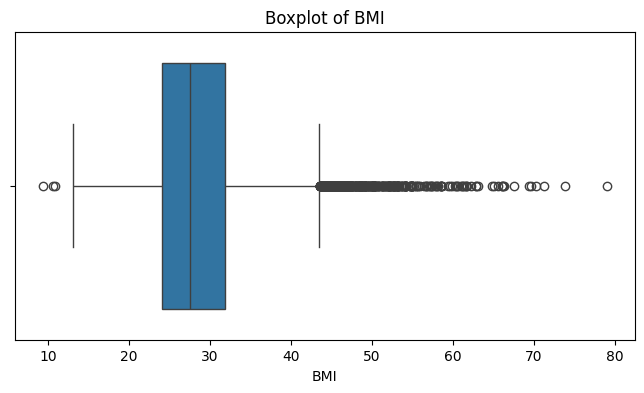

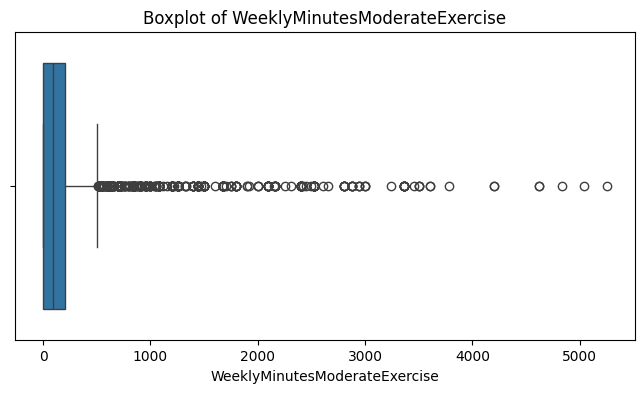

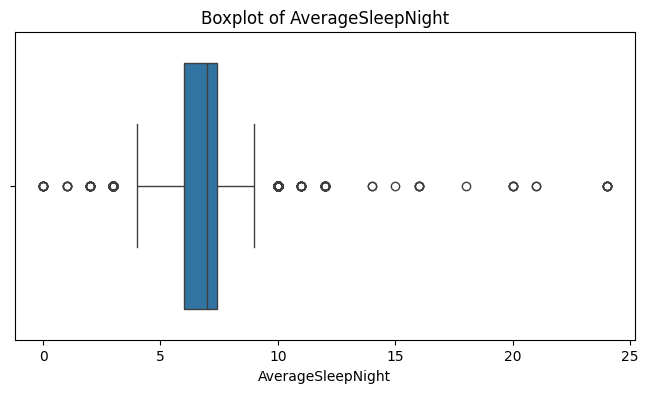

In [ ]:
# List of the continuous variables
continuous_vars = ['Weight', 'HowLongModerateExerciseMinutes',
                        'AverageTimeSitting', 'Age', 'BMI', 'WeeklyMinutesModerateExercise',
                         'AverageSleepNight']

for var in continuous_vars:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df2[var])
    plt.title(f'Boxplot of {var}')
    plt.show()

In [ ]:
# Checking from the IQR Methiod
for var in continuous_vars:
    Q1 = df2[var].quantile(0.25)
    Q3 = df2[var].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = df2[(df2[var] < lower_bound) | (df2[var] > upper_bound)]
    print(f'{var} has {len(outliers)} outliers.')

Weight has 383 outliers.
HowLongModerateExerciseMinutes has 465 outliers.
AverageTimeSitting has 501 outliers.
Age has 0 outliers.
BMI has 495 outliers.
WeeklyMinutesModerateExercise has 785 outliers.
AverageSleepNight has 403 outliers.


In [ ]:
# Handling outliers with clipping
for var in continuous_vars:
    Q1 = df2[var].quantile(0.25)
    Q3 = df2[var].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    df2[var] = df2[var].apply(lambda x: lower_bound if x < lower_bound else upper_bound if x > upper_bound else x)

In [ ]:
# Checking from the IQR Methiod
for var in continuous_vars:
    Q1 = df2[var].quantile(0.25)
    Q3 = df2[var].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = df2[(df2[var] < lower_bound) | (df2[var] > upper_bound)]
    print(f'{var} has {len(outliers)} outliers.')

Weight has 0 outliers.
HowLongModerateExerciseMinutes has 0 outliers.
AverageTimeSitting has 0 outliers.
Age has 0 outliers.
BMI has 0 outliers.
WeeklyMinutesModerateExercise has 0 outliers.
AverageSleepNight has 0 outliers.


In [ ]:
# Save the imputed dataset in excel file
df2.to_excel('HINTS_Modified_IMP(KNN).xlsx', index=False)

In [ ]:
# Load the dataset for the model developoment
df4 = pd.read_excel('/content/drive/MyDrive/HINTS_Modified_IMP(KNN).xlsx')
# Check the dimension of the dataset
df4.head()

,SeekCancerInfo,CancerLotOfEffort,CancerFrustrated,CancerConfidentGetHealthInf,CancerTrustDoctor,CancerTrustFamily,CancerTrustGov,CancerTrustCharities,CancerTrustReligiousOrgs,StrongNeedCancerInfo,...,FeelLeftOut,FeelPeopleBarelyKnow,FeelIsolated,FeelPeopleNotWithMe,ChronicCondition,RaceEthn_Hispanic,RaceEthn_White,RaceEthn_Black,RaceEthn_Asian,RaceEthn_Others
0,1,3,3,3,1,2,2,2,3,7,...,3,3,3,3,1,0,1,0,0,0
1,1,3,3,1,2,3,3,3,4,6,...,2,2,2,2,0,0,1,0,0,0
2,1,3,4,1,2,2,2,4,4,6,...,2,2,2,2,1,0,1,0,0,0
3,1,2,2,3,2,2,2,2,4,4,...,2,2,2,2,0,0,1,0,0,0
4,0,3,3,2,1,1,2,1,1,6,...,1,2,1,1,1,0,1,0,0,0


In [ ]:
df4.isnull().sum() # Checking the missing values

,0
SeekCancerInfo,0
CancerLotOfEffort,0
CancerFrustrated,0
CancerConfidentGetHealthInf,0
CancerTrustDoctor,0
...,...
RaceEthn_Hispanic,0
RaceEthn_White,0
RaceEthn_Black,0
RaceEthn_Asian,0


# Checking the redundant variables

In [ ]:
# Compute the correlation matrix
corr_matrix = df4.corr().abs()

# Select the upper triangle of the correlation matrix
upper_triangle = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find and print all pairs with correlation > 0.9
print("\nHighly Correlated Variable Pairs (Threshold > 0.9):\n")
for col1 in upper_triangle.columns:
    for col2 in upper_triangle.columns:
        if upper_triangle.loc[col1, col2] > 0.9:
            print(f"{col1} ↔ {col2} | Correlation: {upper_triangle.loc[col1, col2]:.4f}")


Highly Correlated Variable Pairs (Threshold > 0.9):

SocMed_SharedPers ↔ SocMed_Interacted | Correlation: 0.9342
Age ↔ AgeGrpB | Correlation: 0.9629


# Random Forest

In [ ]:
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import SMOTE
from collections import Counter
exclude_vars = ['Age', 'Weight','SocMed_SharedPers',
                'Height_Inches', 'MedConditions_HighBP', 'MedConditions_Diabetes', 'MedConditions_HeartCondition',
                'MedConditions_LungDisease','MedConditions_Depression','MedConditions_Diabetes','ChronicCondition'
                ]
X = df4.drop(columns=exclude_vars)
y = df4['ChronicCondition']

# Normalize the dataset using MinMaxScaler
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Split the dataset into training (85%) and testing (15%) using stratified sampling
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.15, stratify=y, random_state=42
)

# Applying SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

print(f"Original class distribution: {Counter(y)}")
print(f"Class distribution after SMOTE: {Counter(y_resampled)}")


# Define the hyperparameter values to loop over for Random Forest

n_estimators = [300, 400, 500]

max_depth = [10, 12, 15]

min_samples_split = [5, 8, 9]

min_samples_leaf = [2, 3, 4]

# Create lists to store results of each hyperparameter combination

results = []

# Define 5-fold cross-validation

kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Manual grid search through hyperparameters

for n_est in n_estimators:

    for depth in max_depth:

        for min_split in min_samples_split:

            for min_leaf in min_samples_leaf:

                # Create a RandomForestClassifier with the current hyperparameters

                model = RandomForestClassifier(

                    n_estimators=n_est,

                    max_depth=depth,

                    min_samples_split=min_split,

                    min_samples_leaf=min_leaf,

                    class_weight="balanced",
                    max_features="sqrt",

                    random_state=42

                )

                fold_accuracies = []

                # Perform 5-fold cross-validation

                print(f"\nHyperparameters: n_estimators={n_est}, max_depth={depth}, "

                      f"min_samples_split={min_split}, min_samples_leaf={min_leaf}")

                for fold, (train_index, val_index) in enumerate(kf.split(X_resampled, y_resampled), 1):

                    # Split training into training and validation sets

                    X_train_fold, X_val_fold = X_resampled[train_index], X_resampled[val_index]

                    y_train_fold, y_val_fold = y_resampled.iloc[train_index], y_resampled.iloc[val_index]

                    # Train the model on the training fold

                    model.fit(X_train_fold, y_train_fold)

                    # Validate the model

                    val_predictions = model.predict(X_val_fold)

                    fold_accuracy = accuracy_score(y_val_fold, val_predictions)

                    fold_accuracies.append(fold_accuracy)

                    # Print accuracy for each fold

                    print(f"Fold {fold} - Validation Accuracy: {fold_accuracy:.4f}")

                # Calculate the mean accuracy for this hyperparameter combination

                avg_accuracy = np.mean(fold_accuracies)

                # Print average accuracy for this hyperparameter combination

                print(f"Average Validation Accuracy for this combination: {avg_accuracy:.4f}\n")

                # Store the results

                results.append({

                    'n_estimators': n_est,

                    'max_depth': depth,

                    'min_samples_split': min_split,

                    'min_samples_leaf': min_leaf,

                    'average_cv_accuracy': avg_accuracy

                })

# Find and print the best hyperparameter combination based on cross-validation accuracy

best_result = max(results, key=lambda x: x['average_cv_accuracy'])

print("\nBest Hyperparameters:")

print(f"n_estimators: {best_result['n_estimators']}")

print(f"max_depth: {best_result['max_depth']}")

print(f"min_samples_split: {best_result['min_samples_split']}")

print(f"min_samples_leaf: {best_result['min_samples_leaf']}")

print(f"Average Cross-Validation Accuracy: {best_result['average_cv_accuracy']:.4f}")

# Use the best hyperparameters to create the final model

best_rf_model = RandomForestClassifier(

    n_estimators=best_result['n_estimators'],

    max_depth=best_result['max_depth'],

    min_samples_split=best_result['min_samples_split'],

    min_samples_leaf=best_result['min_samples_leaf'],

    class_weight="balanced",
    max_features="sqrt",

    random_state=42

)

# Train the best model on the entire resampled training dataset

best_rf_model.fit(X_resampled, y_resampled)

# Evaluate on the test set
y_test_pred = best_rf_model.predict(X_test)
y_test_prob = best_rf_model.predict_proba(X_test)[:, 1]

# Calculate testing accuracy
test_accuracy = accuracy_score(y_test, y_test_pred)

# Calculate additional performance metrics (Precision, Recall, F1, AUC)
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_test_pred)
roc_auc = roc_auc_score(y_test, y_test_prob)

print(f"\nTest Set Performance:")

print(f"Testing Accuracy: {test_accuracy:.4f}")

print(f"Precision: {precision:.4f}")

print(f"Recall: {recall:.4f}")

print(f"F1 Score: {f1:.4f}")

print(f"AUC Score: {roc_auc:.4f}")

# Feature Importance

feature_importances = best_rf_model.feature_importances_

# Create a DataFrame to display the feature importances alongside their variable names

importances_df = pd.DataFrame({

    'Feature': X.columns,  # Feature names

    'Importance': feature_importances  # Importance scores

})

# Sort by importance in descending order

importances_df = importances_df.sort_values(by='Importance', ascending=False)

# Display the top features

print("Top features by importance:")

print(importances_df.head(60))

Original class distribution: Counter({1: 9935, 0: 5191})
Class distribution after SMOTE: Counter({1: 8445, 0: 8445})

Hyperparameters: n_estimators=300, max_depth=10, min_samples_split=5, min_samples_leaf=2
Fold 1 - Validation Accuracy: 0.8561
Fold 2 - Validation Accuracy: 0.8573
Fold 3 - Validation Accuracy: 0.8481
Fold 4 - Validation Accuracy: 0.8638
Fold 5 - Validation Accuracy: 0.8508
Average Validation Accuracy for this combination: 0.8552


Hyperparameters: n_estimators=300, max_depth=10, min_samples_split=5, min_samples_leaf=3
Fold 1 - Validation Accuracy: 0.8520
Fold 2 - Validation Accuracy: 0.8544
Fold 3 - Validation Accuracy: 0.8490
Fold 4 - Validation Accuracy: 0.8623
Fold 5 - Validation Accuracy: 0.8484
Average Validation Accuracy for this combination: 0.8532


Hyperparameters: n_estimators=300, max_depth=10, min_samples_split=5, min_samples_leaf=4
Fold 1 - Validation Accuracy: 0.8541
Fold 2 - Validation Accuracy: 0.8570
Fold 3 - Validation Accuracy: 0.8470
Fold 4 - Validat

# Shap Value

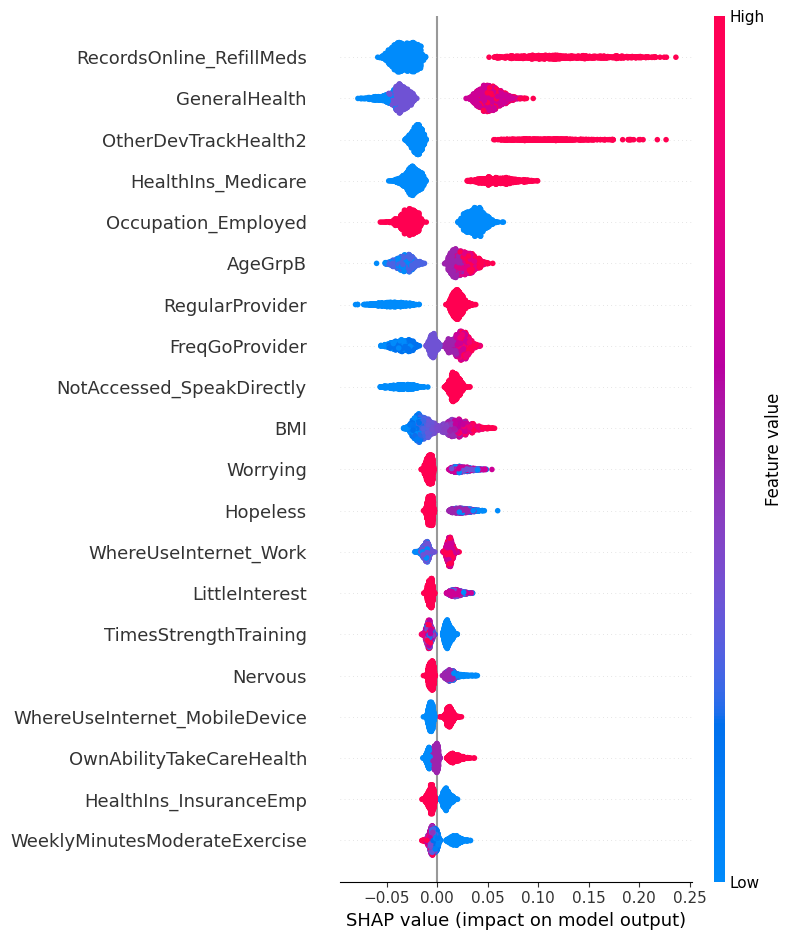

In [ ]:
# Initialize JavaScript visualization
shap.initjs()

# Create SHAP explainer for the Random Forest model
explainer = shap.TreeExplainer(best_rf_model)

# Calculate SHAP values for the test set
shap_values = explainer.shap_values(np.array(X_test))

# Create a summary plot for the top 20 features
shap.summary_plot(shap_values[:, :, 1],X_test, feature_names=X.columns, max_display=20)

# Precision Recall Curve

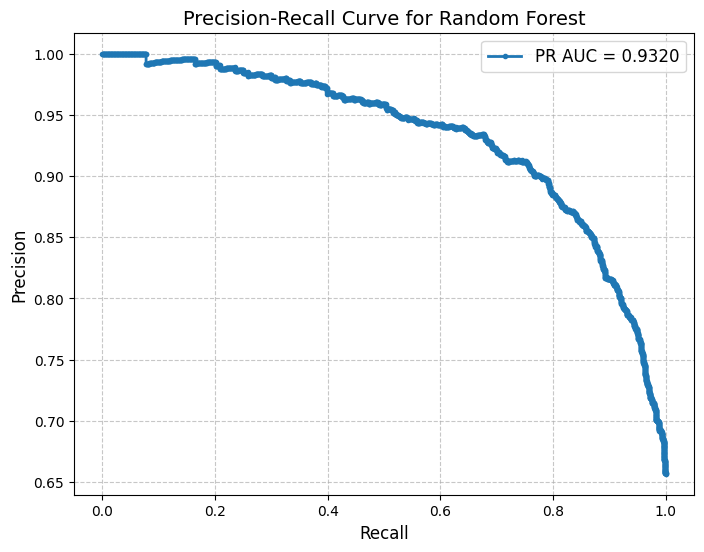

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, auc

# Get probability scores for the positive class (ChronicCondition = 1)
y_test_prob = best_rf_model.predict_proba(X_test)[:, 1]

# Compute Precision-Recall pairs
precision, recall, _ = precision_recall_curve(y_test, y_test_prob)

# Compute Area Under Precision-Recall Curve (PR-AUC)
pr_auc = auc(recall, precision)

# Plot Precision-Recall Curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', linestyle='-', linewidth=2, label=f'PR AUC = {pr_auc:.4f}')

# Improve visualization
plt.xlabel('Recall', fontsize=12)
plt.ylabel('Precision', fontsize=12)
plt.title('Precision-Recall Curve for Random Forest', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.show()

# ROC Curve

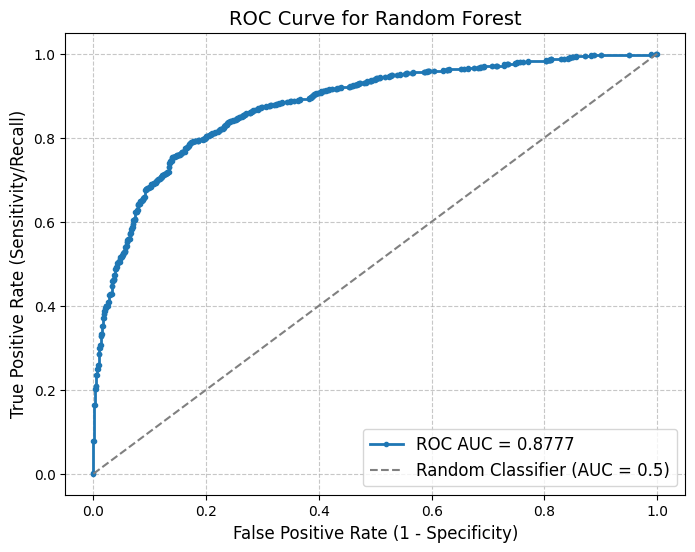

In [ ]:

# Get probability scores for the positive class (ChronicCondition = 1)
y_test_prob = best_rf_model.predict_proba(X_test)[:, 1]

# Compute False Positive Rate (FPR) and True Positive Rate (TPR)
fpr, tpr, _ = roc_curve(y_test, y_test_prob)

# Compute AUC-ROC Score
roc_auc = auc(fpr, tpr)

# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, marker='.', linestyle='-', linewidth=2, label=f'ROC AUC = {roc_auc:.4f}')

# Plot the random classifier baseline (diagonal line)
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Classifier (AUC = 0.5)')

# Labels and title
plt.xlabel('False Positive Rate (1 - Specificity)', fontsize=12)
plt.ylabel('True Positive Rate (Sensitivity/Recall)', fontsize=12)
plt.title('ROC Curve for Random Forest', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.show()

# Logistic Regression

In [ ]:
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import SMOTE
from collections import Counter
exclude_vars = ['Age', 'Weight','SocMed_SharedPers',
                'Height_Inches', 'MedConditions_HighBP', 'MedConditions_Diabetes', 'MedConditions_HeartCondition',
                'MedConditions_LungDisease','MedConditions_Depression','MedConditions_Diabetes','ChronicCondition'
                ]
X = df4.drop(columns=exclude_vars)
y = df4['ChronicCondition']

# Normalize the dataset using MinMaxScaler
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Split the dataset into training (85%) and testing (15%) using stratified sampling
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.15, stratify=y, random_state=42
)

# Applying SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

print(f"Original class distribution: {Counter(y)}")
print(f"Class distribution after SMOTE: {Counter(y_resampled)}")

# Define the hyperparameter values for Logistic Regression with Elastic Net
C_values = [0.1, 0.5,1]
l1_ratios = [0.5, 0.7, 0.9]
max_iter_values = [800,900,1000]

# Create lists to store results of each hyperparameter combination
results = []

# 5-fold cross-validation setup
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Grid search through hyperparameters, only with Elastic Net penalty
for C in C_values:
    for l1_ratio in l1_ratios:
        for max_iter in max_iter_values:
            # Initialize the model with Elastic Net
            model = LogisticRegression(
                C=C,
                penalty='elasticnet',
                solver='saga',
                class_weight='balanced',
                l1_ratio=l1_ratio,
                max_iter=max_iter,
                random_state=42
            )

            fold_accuracies = []

            # Cross-validation loop
            print(f"\nHyperparameters: C={C}, l1_ratio={l1_ratio}, "
                  f"max_iter={max_iter}")

            for fold, (train_index, val_index) in enumerate(kf.split(X_resampled,y_resampled), 1):
                # Split training into training and validation sets
                X_train_fold, X_val_fold = X_resampled[train_index], X_resampled[val_index]
                y_train_fold, y_val_fold = y_resampled.iloc[train_index], y_resampled.iloc[val_index]

                # Train the model on the training fold
                model.fit(X_train_fold, y_train_fold)

                # Validate the model
                val_predictions = model.predict(X_val_fold)
                fold_accuracy = accuracy_score(y_val_fold, val_predictions)
                fold_accuracies.append(fold_accuracy)

                # Print accuracy for each fold
                print(f"Fold {fold} - Validation Accuracy: {fold_accuracy:.4f}")

            # Calculate the mean accuracy for this hyperparameter combination
            avg_accuracy = np.mean(fold_accuracies)
            print(f"Average Validation Accuracy for this combination: {avg_accuracy:.4f}\n")

            # Store the results
            results.append({
                'C': C,
                'l1_ratio': l1_ratio,
                'max_iter': max_iter,
                'average_cv_accuracy': avg_accuracy
            })

# Find and print the best hyperparameter combination based on cross-validation accuracy
best_result = max(results, key=lambda x: x['average_cv_accuracy'])
print("\nBest Hyperparameters:")
print(f"C: {best_result['C']}")
print(f"l1_ratio: {best_result['l1_ratio']}")
print(f"max_iter: {best_result['max_iter']}")
print(f"Average Cross-Validation Accuracy: {best_result['average_cv_accuracy']:.4f}")

# Use the best hyperparameters to create the final Logistic Regression model
best_logistic_model = LogisticRegression(
    C=best_result['C'],
    penalty='elasticnet',
    solver='saga',
    l1_ratio=best_result['l1_ratio'],
    class_weight= 'balanced',
    max_iter=best_result['max_iter'],
    random_state=42
)

# Train the best model on the entire training set
best_logistic_model.fit(X_resampled, y_resampled)

# Evaluate on the test set
y_test_pred = best_logistic_model.predict(X_test)
y_test_prob = best_logistic_model.predict_proba(X_test)[:, 1]

# Calculate testing accuracy
test_accuracy = accuracy_score(y_test, y_test_pred)

# Calculate additional performance metrics (Precision, Recall, F1, AUC)
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_test_pred)
roc_auc = roc_auc_score(y_test, y_test_prob)

print(f"\nTest Set Performance for Logistic Regression:")
print(f"Testing Accuracy: {test_accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"AUC Score: {roc_auc:.4f}")

Original class distribution: Counter({1: 9935, 0: 5191})
Class distribution after SMOTE: Counter({1: 8445, 0: 8445})

Hyperparameters: C=0.1, l1_ratio=0.5, max_iter=800
Fold 1 - Validation Accuracy: 0.8144
Fold 2 - Validation Accuracy: 0.8188
Fold 3 - Validation Accuracy: 0.8085
Fold 4 - Validation Accuracy: 0.8203
Fold 5 - Validation Accuracy: 0.8108
Average Validation Accuracy for this combination: 0.8146


Hyperparameters: C=0.1, l1_ratio=0.5, max_iter=900
Fold 1 - Validation Accuracy: 0.8144
Fold 2 - Validation Accuracy: 0.8188
Fold 3 - Validation Accuracy: 0.8085
Fold 4 - Validation Accuracy: 0.8203
Fold 5 - Validation Accuracy: 0.8108
Average Validation Accuracy for this combination: 0.8146


Hyperparameters: C=0.1, l1_ratio=0.5, max_iter=1000
Fold 1 - Validation Accuracy: 0.8144
Fold 2 - Validation Accuracy: 0.8188
Fold 3 - Validation Accuracy: 0.8085
Fold 4 - Validation Accuracy: 0.8203
Fold 5 - Validation Accuracy: 0.8108
Average Validation Accuracy for this combination: 0.814

# Shap Value

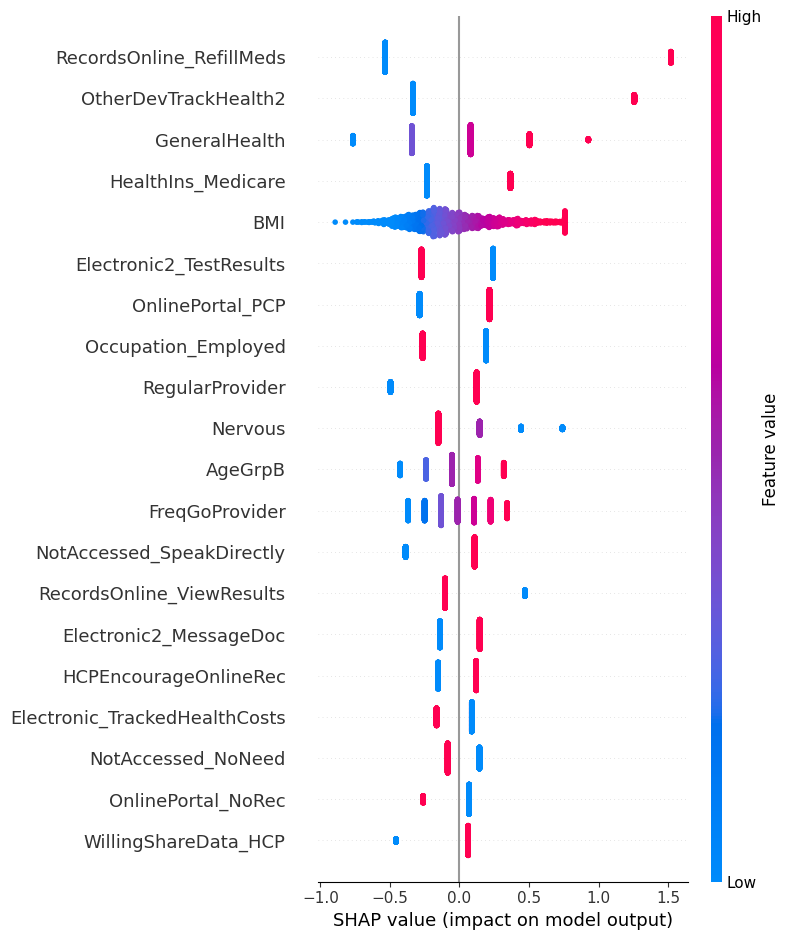

In [ ]:
# Initialize JavaScript visualization
shap.initjs()
# Create SHAP explainer for the Logistic Regression model
explainer = shap.LinearExplainer(best_logistic_model, masker=X_train)

# Calculate SHAP values for the test set
shap_values = explainer.shap_values(X_test)

# SHAP summary plot for the top 20 features
shap.summary_plot(shap_values, X_test, feature_names=X.columns, max_display=20)

# Precision Recall Curve

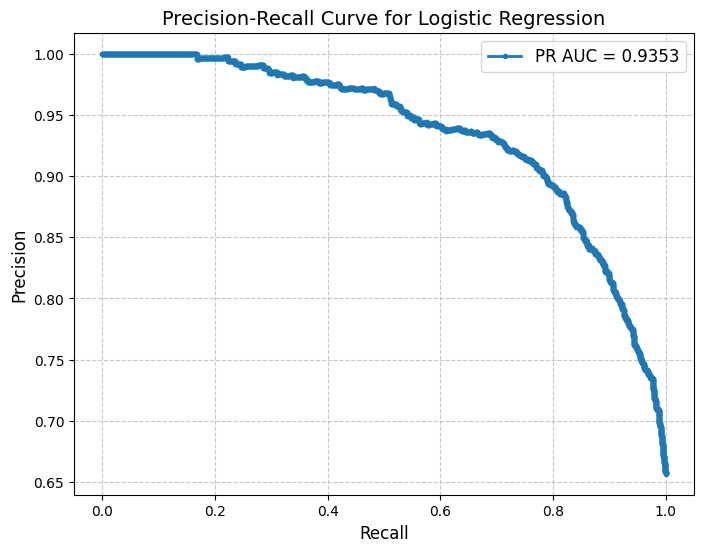

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, auc

# Get probability scores for the positive class (ChronicCondition = 1)
y_test_prob = best_logistic_model.predict_proba(X_test)[:, 1]

# Compute Precision-Recall pairs
precision, recall, _ = precision_recall_curve(y_test, y_test_prob)

# Compute Area Under Precision-Recall Curve (PR-AUC)
pr_auc = auc(recall, precision)

# Plot Precision-Recall Curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', linestyle='-', linewidth=2, label=f'PR AUC = {pr_auc:.4f}')

# Improve visualization
plt.xlabel('Recall', fontsize=12)
plt.ylabel('Precision', fontsize=12)
plt.title('Precision-Recall Curve for Logistic Regression', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.show()

# ROC Curve

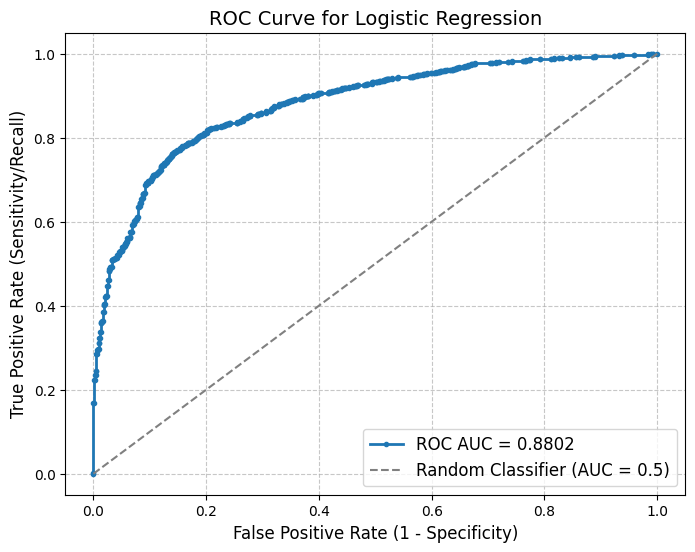

In [ ]:
# Get probability scores for the positive class (ChronicCondition = 1)
y_test_prob = best_logistic_model.predict_proba(X_test)[:, 1]

# Compute False Positive Rate (FPR) and True Positive Rate (TPR)
fpr, tpr, _ = roc_curve(y_test, y_test_prob)

# Compute AUC-ROC Score
roc_auc = auc(fpr, tpr)

# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, marker='.', linestyle='-', linewidth=2, label=f'ROC AUC = {roc_auc:.4f}')

# Plot the random classifier baseline (diagonal line)
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Classifier (AUC = 0.5)')

# Labels and title
plt.xlabel('False Positive Rate (1 - Specificity)', fontsize=12)
plt.ylabel('True Positive Rate (Sensitivity/Recall)', fontsize=12)
plt.title('ROC Curve for Logistic Regression', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.show()

# Support Vector Machine

In [ ]:
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import SMOTE
from collections import Counter
exclude_vars = ['Age', 'Weight','SocMed_SharedPers',
                'Height_Inches', 'MedConditions_HighBP', 'MedConditions_Diabetes', 'MedConditions_HeartCondition',
                'MedConditions_LungDisease','MedConditions_Depression','MedConditions_Diabetes','ChronicCondition'
                ]
X = df4.drop(columns=exclude_vars)
y = df4['ChronicCondition']

# Normalize the dataset using MinMaxScaler
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Split the dataset into training (85%) and testing (15%) using stratified sampling
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.15, stratify=y, random_state=42
)

# Applying SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

print(f"Original class distribution: {Counter(y)}")
print(f"Class distribution after SMOTE: {Counter(y_resampled)}")

# Define Hyperparameter Grid for SVM
C_values = [1, 10]
kernels = ['rbf', 'poly']
gammas = ['scale', 'auto']

# Create lists to store results of each hyperparameter combination
results = []

# 5-fold cross-validation setup
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Grid search through hyperparameters for SVM
for C in C_values:
    for kernel in kernels:
        for gamma in gammas:

            # Initialize the SVM model
            model = SVC(
                C=C,
                kernel=kernel,
                gamma=gamma,
                class_weight='balanced',
                probability=True,
                random_state=42
            )

            fold_accuracies = []

            # Cross-validation loop
            print(f"\nHyperparameters: C={C}, kernel={kernel}, gamma={gamma}")

            for fold, (train_index, val_index) in enumerate(kf.split(X_resampled,y_resampled), 1):
                # Split training into training and validation sets
                X_train_fold, X_val_fold = X_resampled[train_index], X_resampled[val_index]
                y_train_fold, y_val_fold = y_resampled.iloc[train_index], y_resampled.iloc[val_index]

                # Train the model on the training fold
                model.fit(X_train_fold, y_train_fold)

                # Validate the model
                val_predictions = model.predict(X_val_fold)
                fold_accuracy = accuracy_score(y_val_fold, val_predictions)
                fold_accuracies.append(fold_accuracy)

                # Print accuracy for each fold
                print(f"Fold {fold} - Validation Accuracy: {fold_accuracy:.4f}")

            # Calculate the mean accuracy for this hyperparameter combination
            avg_accuracy = np.mean(fold_accuracies)
            print(f"Average Validation Accuracy for this combination: {avg_accuracy:.4f}\n")

            # Store the results
            results.append({
                'C': C,
                'kernel': kernel,
                'gamma': gamma,
                'average_cv_accuracy': avg_accuracy
            })

# Find and print the best hyperparameter combination based on cross-validation accuracy
best_result = max(results, key=lambda x: x['average_cv_accuracy'])
print("\nBest Hyperparameters:")
print(f"C: {best_result['C']}")
print(f"Kernel: {best_result['kernel']}")
print(f"Gamma: {best_result['gamma']}")
print(f"Average Cross-Validation Accuracy: {best_result['average_cv_accuracy']:.4f}")

# Use the best hyperparameters to create the final SVM model
best_svm_model = SVC(
    C=best_result['C'],
    kernel=best_result['kernel'],
    gamma=best_result['gamma'],
    class_weight='balanced',
    probability=True,
    random_state=42
)

# Train the best model on the entire training set
best_svm_model.fit(X_resampled, y_resampled)

# Evaluate on the test set
y_test_pred = best_svm_model.predict(X_test)
y_test_prob = best_svm_model.predict_proba(X_test)[:, 1]

# Calculate testing accuracy
test_accuracy = accuracy_score(y_test, y_test_pred)

# Calculate additional performance metrics (Precision, Recall, F1, AUC)
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_test_pred)
roc_auc = roc_auc_score(y_test, y_test_prob)

print(f"\nTest Set Performance for SVM Classifier:")
print(f"Testing Accuracy: {test_accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"AUC Score: {roc_auc:.4f}")


Original class distribution: Counter({1: 9935, 0: 5191})
Class distribution after SMOTE: Counter({1: 8445, 0: 8445})

Hyperparameters: C=1, kernel=rbf, gamma=scale
Fold 1 - Validation Accuracy: 0.8692
Fold 2 - Validation Accuracy: 0.8721
Fold 3 - Validation Accuracy: 0.8626
Fold 4 - Validation Accuracy: 0.8668
Fold 5 - Validation Accuracy: 0.8721
Average Validation Accuracy for this combination: 0.8686


Hyperparameters: C=1, kernel=rbf, gamma=auto
Fold 1 - Validation Accuracy: 0.8262
Fold 2 - Validation Accuracy: 0.8319
Fold 3 - Validation Accuracy: 0.8230
Fold 4 - Validation Accuracy: 0.8327
Fold 5 - Validation Accuracy: 0.8247
Average Validation Accuracy for this combination: 0.8277


Hyperparameters: C=1, kernel=poly, gamma=scale
Fold 1 - Validation Accuracy: 0.8771
Fold 2 - Validation Accuracy: 0.8804
Fold 3 - Validation Accuracy: 0.8837
Fold 4 - Validation Accuracy: 0.8795
Fold 5 - Validation Accuracy: 0.8828
Average Validation Accuracy for this combination: 0.8807


Hyperparamet

# Shap value

In [ ]:
# Create SHAP explainer for the SVM model
explainer = shap.Explainer(best_svm_model, X_train)

# Calculate SHAP values for the test set
shap_values = explainer(X_test)

# Generate SHAP summary plot
shap.summary_plot(shap_values, X_test, feature_names=X.columns, max_display=20)

# Precisioin Recall Curve

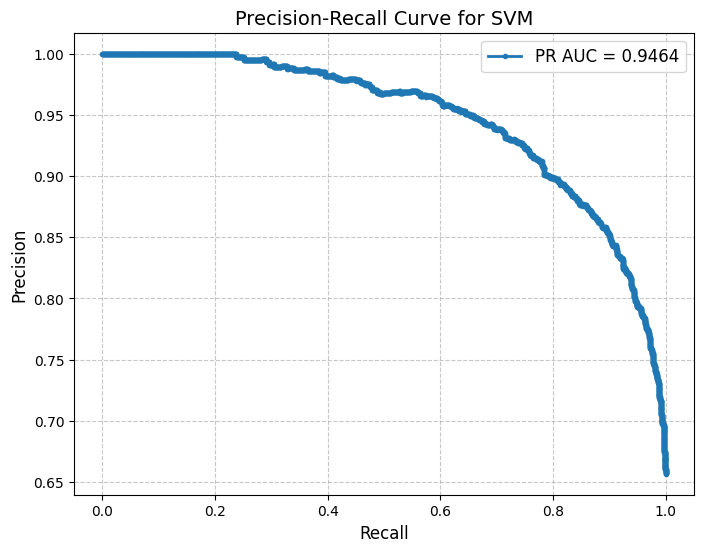

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, auc

# Get probability scores for the positive class (ChronicCondition = 1)
y_test_prob = best_svm_model.predict_proba(X_test)[:, 1]

# Compute Precision-Recall pairs
precision, recall, _ = precision_recall_curve(y_test, y_test_prob)

# Compute Area Under Precision-Recall Curve (PR-AUC)
pr_auc = auc(recall, precision)

# Plot Precision-Recall Curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', linestyle='-', linewidth=2, label=f'PR AUC = {pr_auc:.4f}')

# Improve visualization
plt.xlabel('Recall', fontsize=12)
plt.ylabel('Precision', fontsize=12)
plt.title('Precision-Recall Curve for SVM', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.show()

# ROC Curve

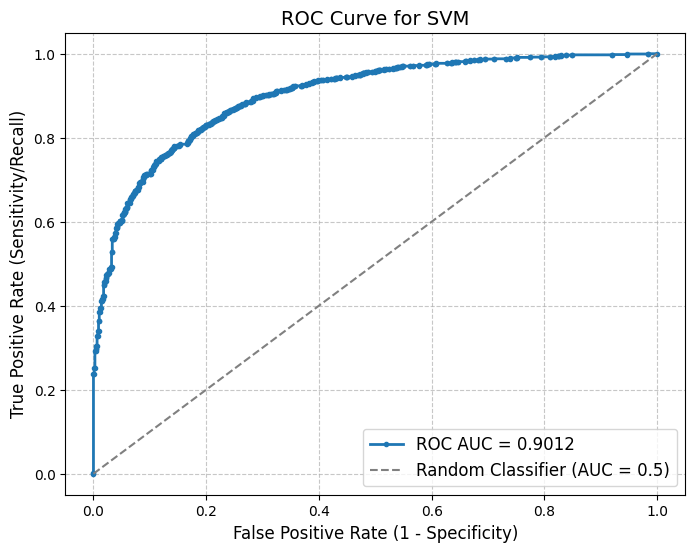

In [ ]:
# Get probability scores for the positive class (ChronicCondition = 1)
y_test_prob = best_svm_model.predict_proba(X_test)[:, 1]

# Compute False Positive Rate (FPR) and True Positive Rate (TPR)
fpr, tpr, _ = roc_curve(y_test, y_test_prob)

# Compute AUC-ROC Score
roc_auc = auc(fpr, tpr)

# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, marker='.', linestyle='-', linewidth=2, label=f'ROC AUC = {roc_auc:.4f}')

# Plot the random classifier baseline (diagonal line)
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Classifier (AUC = 0.5)')

# Labels and title
plt.xlabel('False Positive Rate (1 - Specificity)', fontsize=12)
plt.ylabel('True Positive Rate (Sensitivity/Recall)', fontsize=12)
plt.title('ROC Curve for SVM', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.show()

# Gradient Boosting Classifier

In [ ]:
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import SMOTE
from collections import Counter
exclude_vars = ['Age', 'Weight','SocMed_SharedPers',
                'Height_Inches', 'MedConditions_HighBP', 'MedConditions_Diabetes', 'MedConditions_HeartCondition',
                'MedConditions_LungDisease','MedConditions_Depression','ChronicCondition'
                ]
X = df4.drop(columns=exclude_vars)
y = df4['ChronicCondition']

# Normalize the dataset using MinMaxScaler
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Split the dataset into training (85%) and testing (15%) using stratified sampling
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.15, stratify=y, random_state=42
)

# Applying SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

print(f"Original class distribution: {Counter(y)}")
print(f"Class distribution after SMOTE: {Counter(y_resampled)}")

# Define Hyperparameter Grid for Gradient Boosting
n_estimators = [200, 300]
learning_rates = [0.01,0.05]
max_depths = [5, 7]
min_samples_splits = [5, 10]
min_samples_leafs = [2, 5]

# Create lists to store results of each hyperparameter combination
results = []

# 5-fold cross-validation setup
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Grid search through hyperparameters for Gradient Boosting
for n_est in n_estimators:
    for learning_rate in learning_rates:
        for max_depth in max_depths:
            for min_split in min_samples_splits:
                for min_leaf in min_samples_leafs:

                        # Initialize the Gradient Boosting model
                        model = GradientBoostingClassifier(
                            n_estimators=n_est,
                            learning_rate=learning_rate,
                            max_depth=max_depth,
                            min_samples_split=min_split,
                            min_samples_leaf=min_leaf,
                            random_state=42
                        )

                        fold_accuracies = []

                        # Cross-validation loop
                        print(f"\nHyperparameters: n_estimators={n_est}, learning_rate={learning_rate}, max_depth={max_depth}, "
                              f"min_samples_split={min_split}, min_samples_leaf={min_leaf}")

                        for fold, (train_index, val_index) in enumerate(kf.split(X_resampled,y_resampled), 1):
                            # Split training into training and validation sets
                            X_train_fold, X_val_fold = X_resampled[train_index], X_resampled[val_index]
                            y_train_fold, y_val_fold = y_resampled.iloc[train_index], y_resampled.iloc[val_index]

                            # Train the model on the training fold
                            model.fit(X_train_fold, y_train_fold)

                            # Validate the model
                            val_predictions = model.predict(X_val_fold)
                            fold_accuracy = accuracy_score(y_val_fold, val_predictions)
                            fold_accuracies.append(fold_accuracy)

                            # Print accuracy for each fold
                            print(f"Fold {fold} - Validation Accuracy: {fold_accuracy:.4f}")

                        # Calculate the mean accuracy for this hyperparameter combination
                        avg_accuracy = np.mean(fold_accuracies)
                        print(f"Average Validation Accuracy for this combination: {avg_accuracy:.4f}\n")

                        # Store the results
                        results.append({
                            'n_estimators': n_est,
                            'learning_rate': learning_rate,
                            'max_depth': max_depth,
                            'min_samples_split': min_split,
                            'min_samples_leaf': min_leaf,
                            'average_cv_accuracy': avg_accuracy
                        })

# Find and print the best hyperparameter combination based on cross-validation accuracy
best_result = max(results, key=lambda x: x['average_cv_accuracy'])
print("\nBest Hyperparameters:")
print(f"n_estimators: {best_result['n_estimators']}")
print(f"learning_rate: {best_result['learning_rate']}")
print(f"max_depth: {best_result['max_depth']}")
print(f"min_samples_split: {best_result['min_samples_split']}")
print(f"min_samples_leaf: {best_result['min_samples_leaf']}")
print(f"Average Cross-Validation Accuracy: {best_result['average_cv_accuracy']:.4f}")

# Use the best hyperparameters to create the final Gradient Boosting model
best_gb_model = GradientBoostingClassifier(
    n_estimators=best_result['n_estimators'],
    learning_rate=best_result['learning_rate'],
    max_depth=best_result['max_depth'],
    min_samples_split=best_result['min_samples_split'],
    min_samples_leaf=best_result['min_samples_leaf'],
    random_state=42
)

# Train the best model on the entire training set
best_gb_model.fit(X_resampled, y_resampled)

# Evaluate on the test set
y_test_pred = best_gb_model.predict(X_test)
y_test_prob = best_gb_model.predict_proba(X_test)[:, 1]

# Calculate testing accuracy
test_accuracy = accuracy_score(y_test, y_test_pred)

# Calculate additional performance metrics (Precision, Recall, F1, AUC)
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_test_pred)
roc_auc = roc_auc_score(y_test, y_test_prob)

print(f"\nTest Set Performance for Gradient Boosting Classifier:")
print(f"Testing Accuracy: {test_accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"AUC Score: {roc_auc:.4f}")

# Get feature importances from the trained Gradient Boosting model
feature_importances = best_gb_model.feature_importances_

# Create a DataFrame for better visualization
feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Display the top 60 important features
print(feature_importance_df.head(60))

Original class distribution: Counter({1: 9935, 0: 5191})
Class distribution after SMOTE: Counter({1: 8445, 0: 8445})

Hyperparameters: n_estimators=200, learning_rate=0.01, max_depth=5, min_samples_split=5, min_samples_leaf=2
Fold 1 - Validation Accuracy: 0.8324
Fold 2 - Validation Accuracy: 0.8413
Fold 3 - Validation Accuracy: 0.8378
Fold 4 - Validation Accuracy: 0.8517
Fold 5 - Validation Accuracy: 0.8342
Average Validation Accuracy for this combination: 0.8395


Hyperparameters: n_estimators=200, learning_rate=0.01, max_depth=5, min_samples_split=5, min_samples_leaf=5
Fold 1 - Validation Accuracy: 0.8313
Fold 2 - Validation Accuracy: 0.8434
Fold 3 - Validation Accuracy: 0.8369
Fold 4 - Validation Accuracy: 0.8502
Fold 5 - Validation Accuracy: 0.8348
Average Validation Accuracy for this combination: 0.8393


Hyperparameters: n_estimators=200, learning_rate=0.01, max_depth=5, min_samples_split=10, min_samples_leaf=2
Fold 1 - Validation Accuracy: 0.8316
Fold 2 - Validation Accuracy: 0.

In [ ]:
# Count occurrences of 0 and 1 in y_test
y_test_distribution = Counter(y_test)
print(y_test_distribution)

Counter({1: 1490, 0: 779})


# Shap value

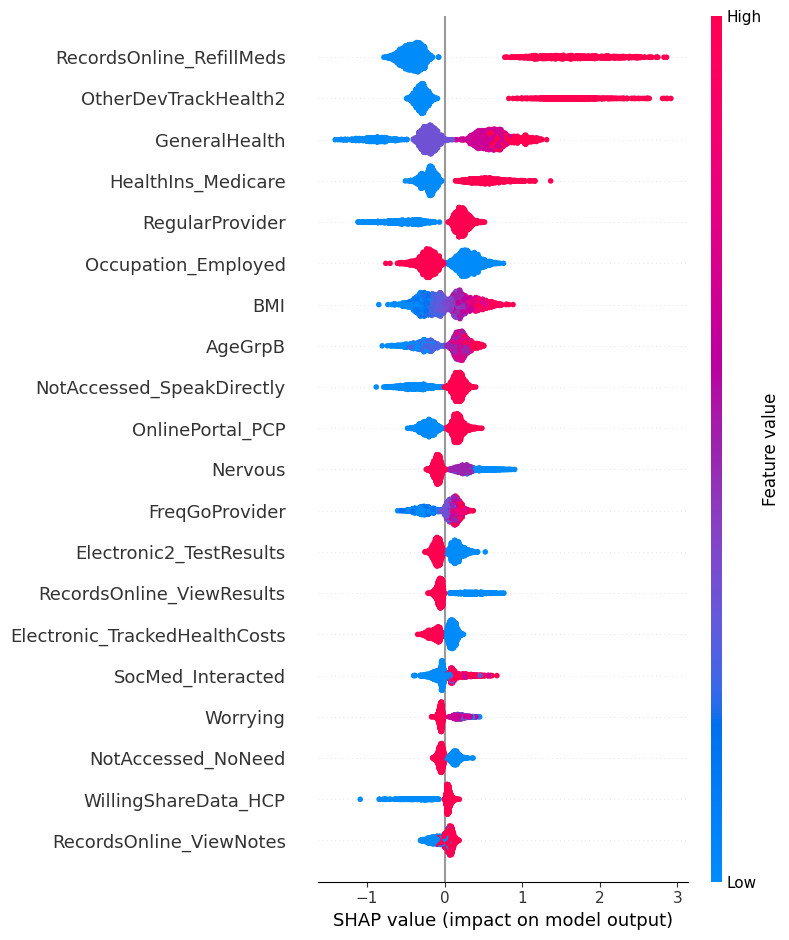

In [ ]:
# Initialize JavaScript visualization
shap.initjs()

# Create a SHAP explainer for the Gradient Boosting model
explainer = shap.TreeExplainer(best_gb_model)

# Calculate SHAP values for the test set
shap_values = explainer.shap_values(X_test)

# SHAP summary plot for the top 20 features
shap.summary_plot(shap_values, X_test, feature_names=X.columns, max_display=20)

# Precision Recall Curve

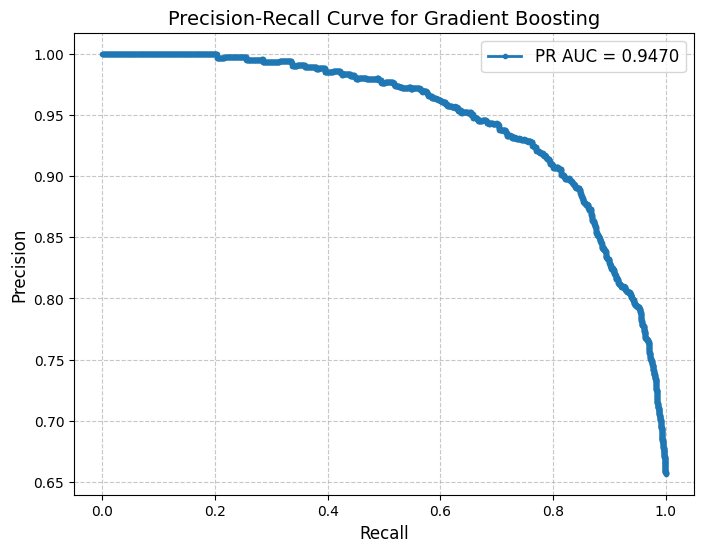

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, auc

# Get probability scores for the positive class (ChronicCondition = 1)
y_test_prob = best_gb_model.predict_proba(X_test)[:, 1]

# Compute Precision-Recall pairs
precision, recall, _ = precision_recall_curve(y_test, y_test_prob)

# Compute Area Under Precision-Recall Curve (PR-AUC)
pr_auc = auc(recall, precision)

# Plot Precision-Recall Curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', linestyle='-', linewidth=2, label=f'PR AUC = {pr_auc:.4f}')

# Improve visualization
plt.xlabel('Recall', fontsize=12)
plt.ylabel('Precision', fontsize=12)
plt.title('Precision-Recall Curve for Gradient Boosting', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.show()

# ROC Curve

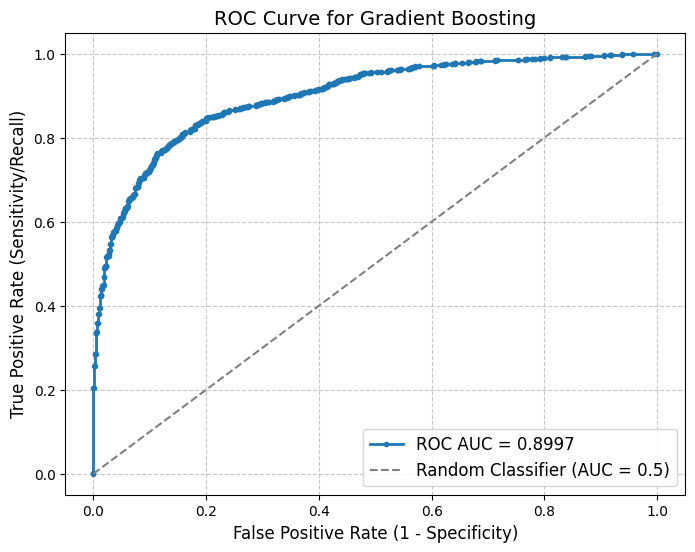

In [ ]:
# Get probability scores for the positive class (ChronicCondition = 1)
y_test_prob = best_gb_model.predict_proba(X_test)[:, 1]

# Compute False Positive Rate (FPR) and True Positive Rate (TPR)
fpr, tpr, _ = roc_curve(y_test, y_test_prob)

# Compute AUC-ROC Score
roc_auc = auc(fpr, tpr)

# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, marker='.', linestyle='-', linewidth=2, label=f'ROC AUC = {roc_auc:.4f}')

# Plot the random classifier baseline (diagonal line)
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Classifier (AUC = 0.5)')

# Labels and title
plt.xlabel('False Positive Rate (1 - Specificity)', fontsize=12)
plt.ylabel('True Positive Rate (Sensitivity/Recall)', fontsize=12)
plt.title('ROC Curve for Gradient Boosting', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.show()

# Deep Learning

In [ ]:
# Install keras
!pip install keras

In [ ]:
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import SMOTE
from collections import Counter
exclude_vars = ['Age', 'Weight','SocMed_SharedPers',
                'Height_Inches', 'MedConditions_HighBP', 'MedConditions_Diabetes', 'MedConditions_HeartCondition',
                'MedConditions_LungDisease','MedConditions_Depression','ChronicCondition'
                ]
X = df4.drop(columns=exclude_vars)
y = df4['ChronicCondition']

# Normalize the dataset using MinMaxScaler
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Split the dataset into training (85%) and testing (15%) using stratified sampling
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.15, stratify=y, random_state=42
)

# Applying SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

print(f"Original class distribution: {Counter(y)}")
print(f"Class distribution after SMOTE: {Counter(y_resampled)}")

# Define the hyperparameter grid manually
batch_sizes = [16, 32, 64]
learning_rates = [0.001, 0.01, 0.1]
neurons = [64, 128, 256]

# Stratified K-Fold setup
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# To store results
results = []

# Manual Grid Search for Hyperparameter Tuning
for batch_size in batch_sizes:
    for learning_rate in learning_rates:
        for neuron in neurons:
            print(f"\nTesting batch_size={batch_size}, learning_rate={learning_rate}, neurons={neuron}")

            fold_accuracies = []

            for fold, (train_index, val_index) in enumerate(kf.split(X_resampled, y_resampled), 1):

                # Define the Deep Learning model architecture
                model = keras.Sequential([
                    layers.Input(shape=(X_resampled.shape[1],)),
                    layers.Dense(neuron, activation='relu'),
                    layers.Dropout(0.3),
                    layers.Dense(neuron // 2, activation='relu'),
                    layers.Dropout(0.3),
                    layers.Dense(neuron // 4, activation='relu'),
                    layers.Dropout(0.3),
                    layers.Dense(1, activation='sigmoid')
                ])

                # Compile the model with specified learning rate
                model.compile(
                    optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
                    loss='binary_crossentropy',
                    metrics=['accuracy']
                )

                # Split the data into training and validation sets
                X_train_fold, X_val_fold = X_resampled[train_index], X_resampled[val_index]
                y_train_fold, y_val_fold = y_resampled[train_index], y_resampled[val_index]

                # Train the model
                model.fit(X_train_fold, y_train_fold,
                          validation_data=(X_val_fold, y_val_fold),
                          epochs=20,
                          batch_size=batch_size,
                          verbose=0)

                # Evaluate the model
                val_loss, val_accuracy = model.evaluate(X_val_fold, y_val_fold, verbose=0)
                fold_accuracies.append(val_accuracy)
                print(f"Fold {fold} - Validation Accuracy: {val_accuracy:.4f}")

            # Average accuracy for this combination
            avg_accuracy = np.mean(fold_accuracies)
            print(f"Average Validation Accuracy: {avg_accuracy:.4f}\n")

            # Store the result
            results.append({
                'batch_size': batch_size,
                'learning_rate': learning_rate,
                'neurons': neuron,
                'average_cv_accuracy': avg_accuracy
            })

# Find the best hyperparameter combination
best_result = max(results, key=lambda x: x['average_cv_accuracy'])
print("\nBest Hyperparameters:")
print(f"Batch Size: {best_result['batch_size']}")
print(f"Learning Rate: {best_result['learning_rate']}")
print(f"Neurons: {best_result['neurons']}")
print(f"Average Cross-Validation Accuracy: {best_result['average_cv_accuracy']:.4f}")

# Build the Final Deep Learning Model with Best Hyperparameters
deep_lr_model = keras.Sequential([
    layers.Input(shape=(X_resampled.shape[1],)),
    layers.Dense(best_result['neurons'], activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(best_result['neurons'] // 2, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(best_result['neurons'] // 4, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(1, activation='sigmoid')
])

# Compile the final model
deep_lr_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=best_result['learning_rate']),
    loss='binary_crossentropy',
    metrics=['accuracy', keras.metrics.Precision(), keras.metrics.Recall(), keras.metrics.AUC()]
)

# Train the model on the entire training set
deep_lr_model.fit(
    X_resampled, y_resampled,
    epochs=20,
    batch_size=best_result['batch_size'],
    verbose=1
)

# Evaluate on the test set
y_test_prob = deep_lr_model.predict(X_test).ravel()
y_test_pred = (y_test_prob > 0.5).astype(int)

# Calculate testing accuracy
test_accuracy = accuracy_score(y_test, y_test_pred)

# Calculate additional performance metrics (Precision, Recall, F1, AUC)
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_test_pred)
roc_auc = roc_auc_score(y_test, y_test_prob)

print(f"\nTest Set Performance for Deep Learning Model:")
print(f"Testing Accuracy: {test_accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"AUC Score: {roc_auc:.4f}")

Original class distribution: Counter({1: 9935, 0: 5191})
Class distribution after SMOTE: Counter({1: 8445, 0: 8445})

Testing batch_size=16, learning_rate=0.001, neurons=64
Fold 1 - Validation Accuracy: 0.8517
Fold 2 - Validation Accuracy: 0.8458
Fold 3 - Validation Accuracy: 0.8404
Fold 4 - Validation Accuracy: 0.8511
Fold 5 - Validation Accuracy: 0.8487
Average Validation Accuracy: 0.8475


Testing batch_size=16, learning_rate=0.001, neurons=128
Fold 1 - Validation Accuracy: 0.8555
Fold 2 - Validation Accuracy: 0.8520
Fold 3 - Validation Accuracy: 0.8576
Fold 4 - Validation Accuracy: 0.8570
Fold 5 - Validation Accuracy: 0.8561
Average Validation Accuracy: 0.8557


Testing batch_size=16, learning_rate=0.001, neurons=256
Fold 1 - Validation Accuracy: 0.8689
Fold 2 - Validation Accuracy: 0.8697
Fold 3 - Validation Accuracy: 0.8626
Fold 4 - Validation Accuracy: 0.8665
Fold 5 - Validation Accuracy: 0.8694
Average Validation Accuracy: 0.8674


Testing batch_size=16, learning_rate=0.01, neu

# Precision Recall Curve

71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


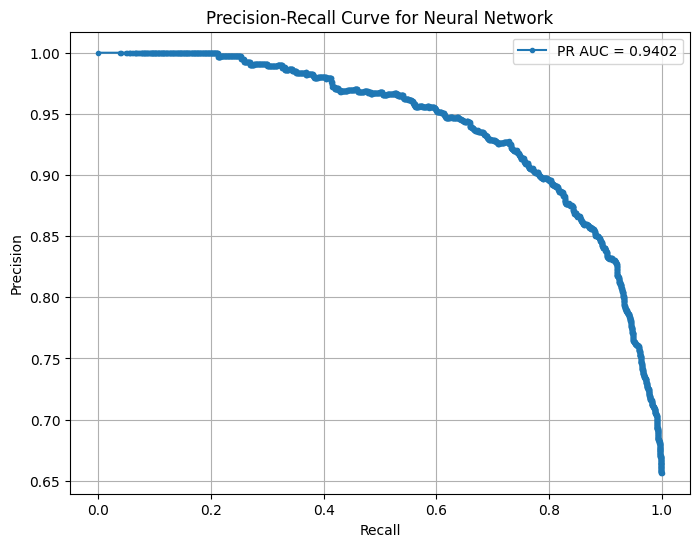

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, auc

# Get model probability scores for the positive class (chronic disease = 1)
y_test_prob = deep_lr_model.predict(X_test).ravel()

# Compute precision-recall pairs
precision, recall, _ = precision_recall_curve(y_test, y_test_prob)

# Compute Area Under Precision-Recall Curve (PR-AUC)
pr_auc = auc(recall, precision)

# Plot Precision-Recall Curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', label=f'PR AUC = {pr_auc:.4f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve for Neural Network')
plt.legend()
plt.grid()
plt.show()

# ROC Curve

71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


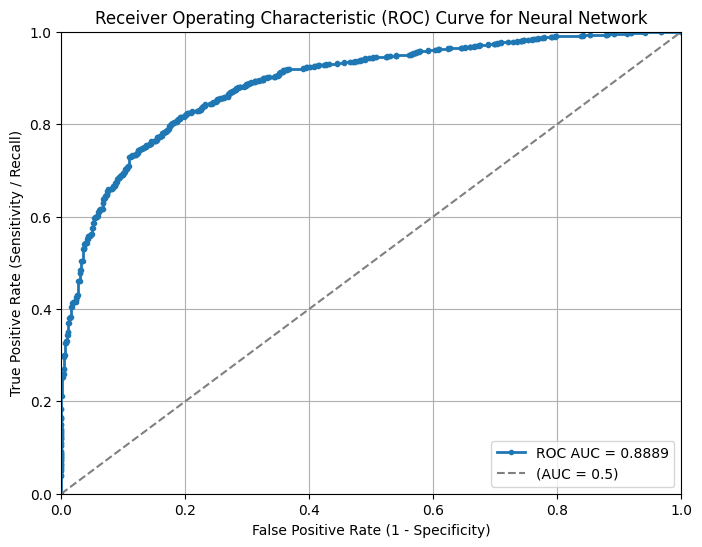

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Get predicted probabilities for the positive class (chronic disease = 1)
y_test_prob = deep_lr_model.predict(X_test).ravel()

# Compute FPR, TPR, and thresholds
fpr, tpr, _ = roc_curve(y_test, y_test_prob)

# Compute Area Under ROC Curve (AUC-ROC)
roc_auc = auc(fpr, tpr)

# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, marker='.', linestyle='-', linewidth=2, label=f'ROC AUC = {roc_auc:.4f}')

# Plot the random classifier baseline (dashed diagonal line)
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='(AUC = 0.5)')

# Labels and title
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity / Recall)')
plt.title('Receiver Operating Characteristic (ROC) Curve for Neural Network')
plt.legend()
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.grid()

# Show the plot
plt.show()

# Summary of Approach 3

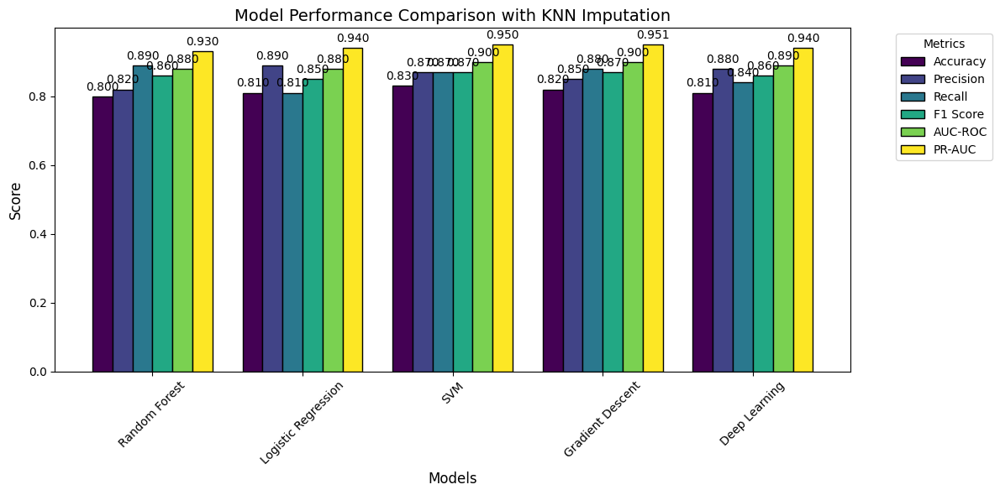

In [ ]:
# Store performance metrics for each model
model_performance = {
    "Random Forest": [0.80, 0.82, 0.89, 0.86, 0.88, 0.93],
    "Logistic Regression": [0.81, 0.89, 0.81, 0.85, 0.88, 0.94],
    "SVM": [0.83, 0.87, 0.87, 0.87, 0.90, 0.950],
    "Gradient Descent": [0.82, 0.85, 0.88, 0.87, 0.90, 0.951],
    "Deep Learning": [0.81, 0.88, 0.84, 0.86, 0.89,0.94],

}

# Define metric names
metrics = ["Accuracy", "Precision", "Recall", "F1 Score", "AUC-ROC","PR-AUC"]

# Convert dictionary into a DataFrame
df_performance = pd.DataFrame(model_performance, index=metrics)

# Plot grouped bar chart
ax = df_performance.T.plot(kind='bar', figsize=(12, 6), colormap='viridis', edgecolor='black', width = 0.8)

# Add value labels to bars
for container in ax.containers:
    ax.bar_label(container, fmt='%.3f', fontsize=10, padding=3)

# Labels and title
plt.title("Model Performance Comparison with KNN Imputation", fontsize=14)
plt.xlabel("Models", fontsize=12)
plt.ylabel("Score", fontsize=12)
plt.xticks(rotation=45)
plt.legend(title="Metrics", bbox_to_anchor=(1.05, 1), loc='upper left')

# Show plot
plt.tight_layout()
plt.show()

# Approach 4: Imputation with Soft Impute

In [ ]:
# Load the datasets
df2 = pd.read_excel('/content/drive/MyDrive/HINTS_Modified_IMP(na).xlsx')
df2.head()

,SeekCancerInfo,CancerLotOfEffort,CancerFrustrated,CancerConfidentGetHealthInf,CancerTrustDoctor,CancerTrustFamily,CancerTrustGov,CancerTrustCharities,CancerTrustReligiousOrgs,StrongNeedCancerInfo,...,FeelLeftOut,FeelPeopleBarelyKnow,FeelIsolated,FeelPeopleNotWithMe,ChronicCondition,RaceEthn_Hispanic,RaceEthn_White,RaceEthn_Black,RaceEthn_Asian,RaceEthn_Others
0,1.0,3.0,3.0,3.0,1.0,2.0,2.0,2.0,3.0,7.0,...,NaN,NaN,NaN,NaN,1,0,1,0,0,0
1,1.0,3.0,3.0,1.0,2.0,3.0,3.0,3.0,4.0,6.0,...,NaN,NaN,NaN,NaN,0,0,1,0,0,0
2,1.0,3.0,4.0,1.0,2.0,2.0,2.0,4.0,4.0,6.0,...,NaN,NaN,NaN,NaN,1,0,1,0,0,0
3,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,4.0,4.0,...,NaN,NaN,NaN,NaN,0,0,1,0,0,0
4,0.0,NaN,NaN,2.0,1.0,1.0,2.0,1.0,1.0,6.0,...,NaN,NaN,NaN,NaN,1,0,1,0,0,0


In [ ]:
# check the missing values
df2.isna().sum()

,0
SeekCancerInfo,99
CancerLotOfEffort,6414
CancerFrustrated,6601
CancerConfidentGetHealthInf,11362
CancerTrustDoctor,266
...,...
RaceEthn_Hispanic,0
RaceEthn_White,0
RaceEthn_Black,0
RaceEthn_Asian,0


In [ ]:
# Install fencyimpute
!pip install fancyimpute

In [ ]:
from fancyimpute import SoftImpute
# Extract column names from categorized lists (Ensure they are lists of column names)
continuous_vars = [col[0] for col in continuous_vars]
ordinal_vars = [col[0] for col in ordinal_vars]
binary_vars = [col[0] for col in binary_vars]

# Apply Soft Impute to Continuous & Ordinal Variables
soft_imputer = SoftImpute(shrinkage_value=0.1, max_iters=100, verbose=True)

# Convert to NumPy array for Soft Impute processing
df2[continuous_vars] = np.round(soft_imputer.fit_transform(df2[continuous_vars]),2)
df2[ordinal_vars] = soft_imputer.fit_transform(df2[ordinal_vars]).round().astype(int)
df2[binary_vars] = soft_imputer.fit_transform(df2[binary_vars]>0.5).round().astype(int)

In [ ]:
# Varify the missing values
df2.isnull().sum()

,0
SeekCancerInfo,0
CancerLotOfEffort,0
CancerFrustrated,0
CancerConfidentGetHealthInf,0
CancerTrustDoctor,0
...,...
RaceEthn_Hispanic,0
RaceEthn_White,0
RaceEthn_Black,0
RaceEthn_Asian,0


# Handling the Outliers

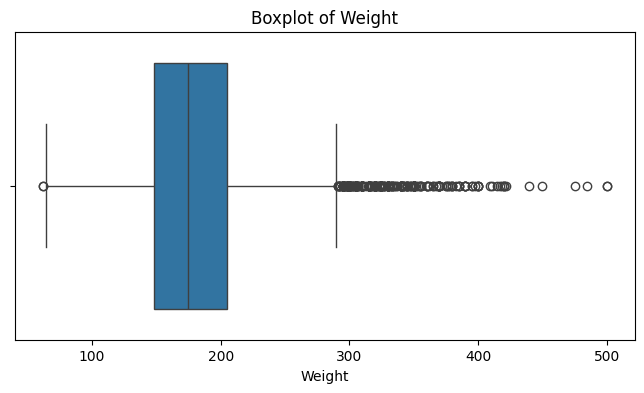

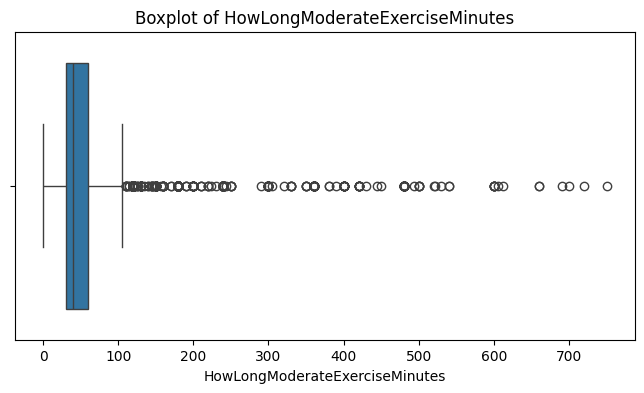

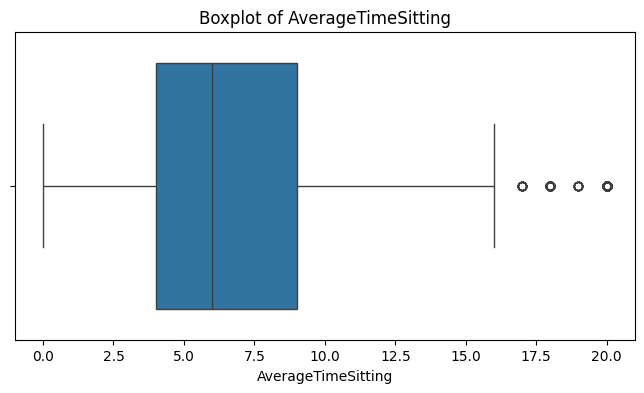

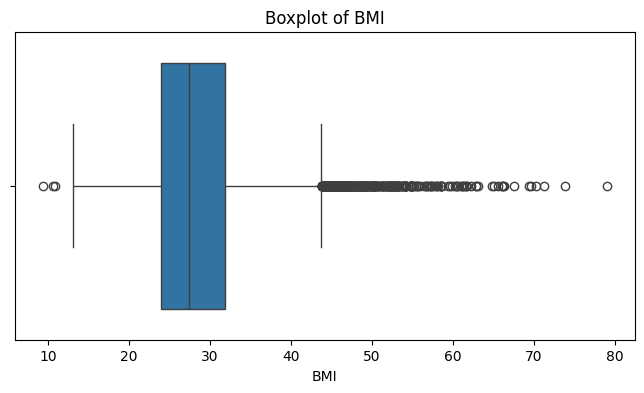

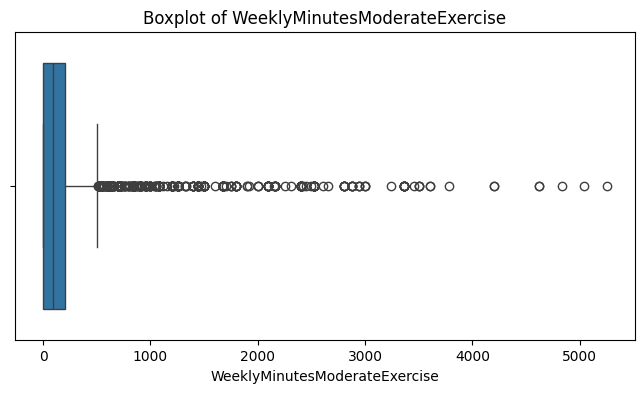

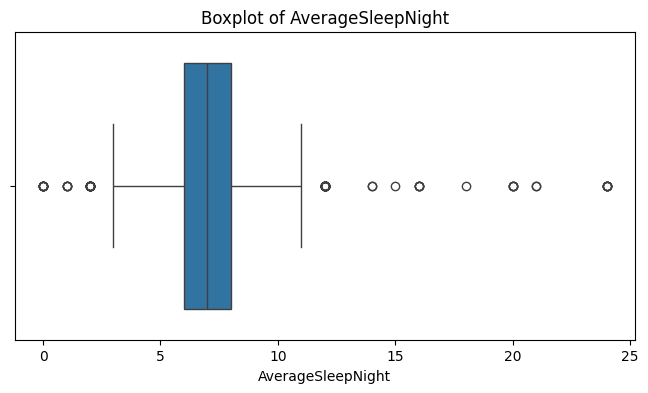

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of the continuous variables
continuous_vars = ['Weight', 'HowLongModerateExerciseMinutes',
                        'AverageTimeSitting', 'BMI', 'WeeklyMinutesModerateExercise',
                         'AverageSleepNight']

for var in continuous_vars:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df2[var])
    plt.title(f'Boxplot of {var}')
    plt.show()

In [ ]:
# Checking from the IQR Methiod
for var in continuous_vars:
    Q1 = df2[var].quantile(0.25)
    Q3 = df2[var].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = df2[(df2[var] < lower_bound) | (df2[var] > upper_bound)]
    print(f'{var} has {len(outliers)} outliers.')

Weight has 574 outliers.
HowLongModerateExerciseMinutes has 436 outliers.
AverageTimeSitting has 501 outliers.
BMI has 777 outliers.
WeeklyMinutesModerateExercise has 884 outliers.
AverageSleepNight has 13 outliers.


In [ ]:
# Handling outliers with clipping
for var in continuous_vars:
    Q1 = df2[var].quantile(0.25)
    Q3 = df2[var].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    df2[var] = df2[var].apply(lambda x: lower_bound if x < lower_bound else upper_bound if x > upper_bound else x)

In [ ]:
# Checking from the IQR Methiod
for var in continuous_vars:
    Q1 = df2[var].quantile(0.25)
    Q3 = df2[var].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = df2[(df2[var] < lower_bound) | (df2[var] > upper_bound)]
    print(f'{var} has {len(outliers)} outliers.')

Weight has 0 outliers.
HowLongModerateExerciseMinutes has 0 outliers.
AverageTimeSitting has 0 outliers.
BMI has 0 outliers.
WeeklyMinutesModerateExercise has 0 outliers.
AverageSleepNight has 0 outliers.


In [ ]:
# Save the df2 dataset in excel file
df2.to_excel('HINTS_Modified_IMP(Soft).xlsx', index=False)

In [ ]:
# Load the dataset
df5 = pd.read_excel('/content/drive/MyDrive/HINTS_Modified_IMP(Soft).xlsx')
df5.head()

,SeekCancerInfo,CancerLotOfEffort,CancerFrustrated,CancerConfidentGetHealthInf,CancerTrustDoctor,CancerTrustFamily,CancerTrustGov,CancerTrustCharities,CancerTrustReligiousOrgs,StrongNeedCancerInfo,...,FeelLeftOut,FeelPeopleBarelyKnow,FeelIsolated,FeelPeopleNotWithMe,ChronicCondition,RaceEthn_Hispanic,RaceEthn_White,RaceEthn_Black,RaceEthn_Asian,RaceEthn_Others
0,1,3,3,3,1,2,2,2,3,7,...,0,0,0,0,1,0,1,0,0,0
1,1,3,3,1,2,3,3,3,4,6,...,0,0,0,0,0,0,1,0,0,0
2,1,3,4,1,2,2,2,4,4,6,...,0,0,0,0,1,0,1,0,0,0
3,1,2,2,3,2,2,2,2,4,4,...,0,0,0,0,0,0,1,0,0,0
4,0,0,0,2,1,1,2,1,1,6,...,0,0,0,0,1,0,1,0,0,0


In [ ]:
df5.shape

(15126, 220)

In [ ]:
df5.isna().sum() # Varifying the missing values

,0
SeekCancerInfo,0
CancerLotOfEffort,0
CancerFrustrated,0
CancerConfidentGetHealthInf,0
CancerTrustDoctor,0
...,...
RaceEthn_Hispanic,0
RaceEthn_White,0
RaceEthn_Black,0
RaceEthn_Asian,0


In [ ]:
# Compute the correlation matrix
corr_matrix = df5.corr().abs()

# Select the upper triangle of the correlation matrix
upper_triangle = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find and print all pairs with correlation > 0.90
print("\nHighly Correlated Variable Pairs (Threshold > 0.90):\n")
for col1 in upper_triangle.columns:
    for col2 in upper_triangle.columns:
        if upper_triangle.loc[col1, col2] > 0.90:
            print(f"{col1} ↔ {col2} | Correlation: {upper_triangle.loc[col1, col2]:.4f}")


Highly Correlated Variable Pairs (Threshold > 0.90):

UsedECigEver ↔ UseECigNow | Correlation: 0.9581
Age ↔ AgeGrpB | Correlation: 0.9666
SocMed_MakeDecisions ↔ SocMed_DiscussHCP | Correlation: 0.9648


# Random Forest

In [ ]:
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import SMOTE
from collections import Counter
exclude_vars = ['Age', 'Weight','UsedECigEver','SocMed_DiscussHCP',
                'Height_Inches', 'MedConditions_HighBP', 'MedConditions_Diabetes', 'MedConditions_HeartCondition',
                'MedConditions_LungDisease','MedConditions_Depression','ChronicCondition'
                ]
X = df5.drop(columns=exclude_vars)
y = df5['ChronicCondition']

# Normalize the dataset using MinMaxScaler
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Split the dataset into training (85%) and testing (15%) using stratified sampling
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.15, stratify=y, random_state=42
)

# Applying SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

print(f"Original class distribution: {Counter(y)}")
print(f"Class distribution after SMOTE: {Counter(y_resampled)}")


# Define the hyperparameter values to loop over for Random Forest

n_estimators = [300, 400, 500]

max_depth = [10, 12, 15]

min_samples_split = [5, 8, 9]

min_samples_leaf = [2, 3, 4]

# Create lists to store results of each hyperparameter combination

results = []

# Define 5-fold cross-validation

kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Manual grid search through hyperparameters

for n_est in n_estimators:

    for depth in max_depth:

        for min_split in min_samples_split:

            for min_leaf in min_samples_leaf:

                # Create a RandomForestClassifier with the current hyperparameters

                model = RandomForestClassifier(

                    n_estimators=n_est,

                    max_depth=depth,

                    min_samples_split=min_split,

                    min_samples_leaf=min_leaf,

                    class_weight="balanced",
                    max_features="sqrt",

                    random_state=42

                )

                fold_accuracies = []

                # Perform 5-fold cross-validation

                print(f"\nHyperparameters: n_estimators={n_est}, max_depth={depth}, "

                      f"min_samples_split={min_split}, min_samples_leaf={min_leaf}")

                for fold, (train_index, val_index) in enumerate(kf.split(X_resampled, y_resampled), 1):

                    # Split training into training and validation sets

                    X_train_fold, X_val_fold = X_resampled[train_index], X_resampled[val_index]

                    y_train_fold, y_val_fold = y_resampled.iloc[train_index], y_resampled.iloc[val_index]

                    # Train the model on the training fold

                    model.fit(X_train_fold, y_train_fold)

                    # Validate the model

                    val_predictions = model.predict(X_val_fold)

                    fold_accuracy = accuracy_score(y_val_fold, val_predictions)

                    fold_accuracies.append(fold_accuracy)

                    # Print accuracy for each fold

                    print(f"Fold {fold} - Validation Accuracy: {fold_accuracy:.4f}")

                # Calculate the mean accuracy for this hyperparameter combination

                avg_accuracy = np.mean(fold_accuracies)

                # Print average accuracy for this hyperparameter combination

                print(f"Average Validation Accuracy for this combination: {avg_accuracy:.4f}\n")

                # Store the results

                results.append({

                    'n_estimators': n_est,

                    'max_depth': depth,

                    'min_samples_split': min_split,

                    'min_samples_leaf': min_leaf,

                    'average_cv_accuracy': avg_accuracy

                })

# Find and print the best hyperparameter combination based on cross-validation accuracy

best_result = max(results, key=lambda x: x['average_cv_accuracy'])

print("\nBest Hyperparameters:")

print(f"n_estimators: {best_result['n_estimators']}")

print(f"max_depth: {best_result['max_depth']}")

print(f"min_samples_split: {best_result['min_samples_split']}")

print(f"min_samples_leaf: {best_result['min_samples_leaf']}")

print(f"Average Cross-Validation Accuracy: {best_result['average_cv_accuracy']:.4f}")

# Use the best hyperparameters to create the final model

best_rf_model = RandomForestClassifier(

    n_estimators=best_result['n_estimators'],

    max_depth=best_result['max_depth'],

    min_samples_split=best_result['min_samples_split'],

    min_samples_leaf=best_result['min_samples_leaf'],

    class_weight="balanced",
    max_features="sqrt",

    random_state=42

)

# Train the best model on the entire resampled training dataset

best_rf_model.fit(X_resampled, y_resampled)

# Evaluate on the test set
y_test_pred = best_rf_model.predict(X_test)
y_test_prob = best_rf_model.predict_proba(X_test)[:, 1]

# Calculate testing accuracy
test_accuracy = accuracy_score(y_test, y_test_pred)

# Calculate additional performance metrics (Precision, Recall, F1, AUC)
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_test_pred)
roc_auc = roc_auc_score(y_test, y_test_prob)

print(f"\nTest Set Performance:")

print(f"Testing Accuracy: {test_accuracy:.4f}")

print(f"Precision: {precision:.4f}")

print(f"Recall: {recall:.4f}")

print(f"F1 Score: {f1:.4f}")

print(f"AUC Score: {roc_auc:.4f}")

# Feature Importance

feature_importances = best_rf_model.feature_importances_

# Create a DataFrame to display the feature importances alongside their variable names

importances_df = pd.DataFrame({

    'Feature': X.columns,  # Feature names

    'Importance': feature_importances  # Importance scores

})

# Sort by importance in descending order

importances_df = importances_df.sort_values(by='Importance', ascending=False)

# Display the top features

print("Top features by importance:")

print(importances_df.head(60))

Original class distribution: Counter({1: 9935, 0: 5191})
Class distribution after SMOTE: Counter({1: 8445, 0: 8445})

Hyperparameters: n_estimators=300, max_depth=10, min_samples_split=5, min_samples_leaf=2
Fold 1 - Validation Accuracy: 0.8025
Fold 2 - Validation Accuracy: 0.8138
Fold 3 - Validation Accuracy: 0.7978
Fold 4 - Validation Accuracy: 0.8123
Fold 5 - Validation Accuracy: 0.8043
Average Validation Accuracy for this combination: 0.8062


Hyperparameters: n_estimators=300, max_depth=10, min_samples_split=5, min_samples_leaf=3
Fold 1 - Validation Accuracy: 0.7999
Fold 2 - Validation Accuracy: 0.8162
Fold 3 - Validation Accuracy: 0.8008
Fold 4 - Validation Accuracy: 0.8088
Fold 5 - Validation Accuracy: 0.8020
Average Validation Accuracy for this combination: 0.8055


Hyperparameters: n_estimators=300, max_depth=10, min_samples_split=5, min_samples_leaf=4
Fold 1 - Validation Accuracy: 0.8037
Fold 2 - Validation Accuracy: 0.8162
Fold 3 - Validation Accuracy: 0.7963
Fold 4 - Validat

# Shap Value

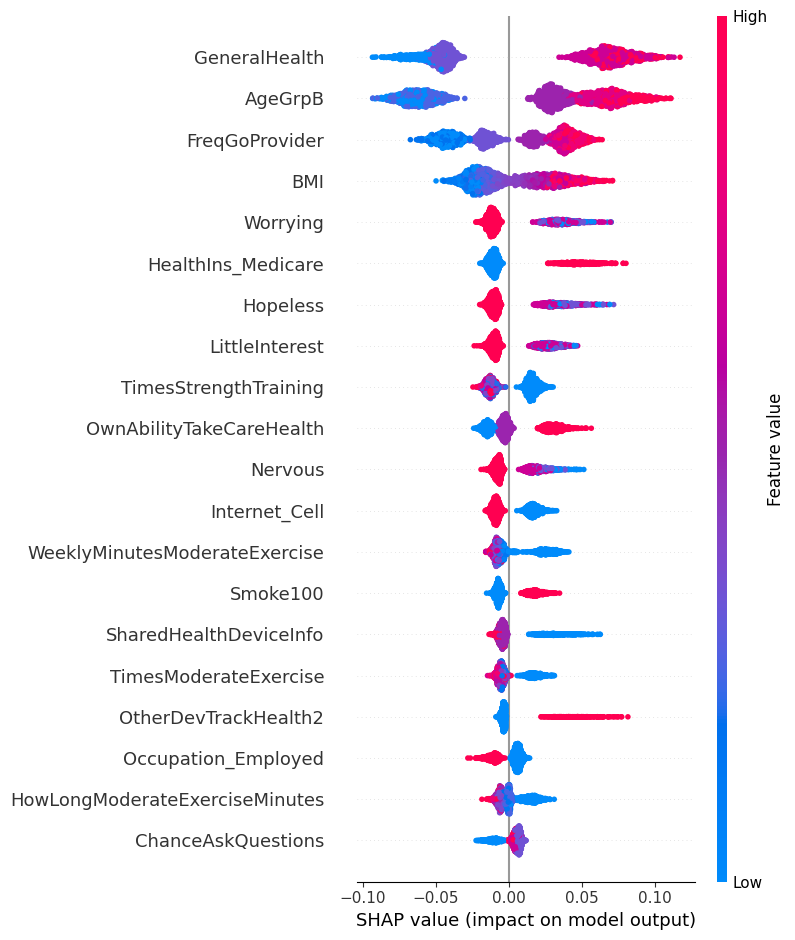

In [ ]:
# Initialize JavaScript visualization
shap.initjs()

# Create SHAP explainer for the Random Forest model
explainer = shap.TreeExplainer(best_rf_model)

# Calculate SHAP values for the test set
shap_values = explainer.shap_values(np.array(X_test))

# Create a summary plot for the top 20 features
shap.summary_plot(shap_values[:, :, 1],X_test, feature_names=X.columns, max_display=20)

# Precision Recall Curve

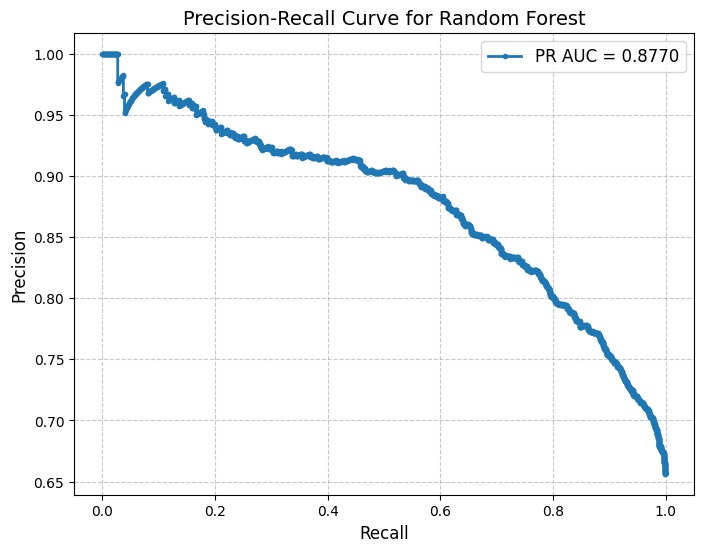

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, auc

# Get probability scores for the positive class (ChronicCondition = 1)
y_test_prob = best_rf_model.predict_proba(X_test)[:, 1]

# Compute Precision-Recall pairs
precision, recall, _ = precision_recall_curve(y_test, y_test_prob)

# Compute Area Under Precision-Recall Curve (PR-AUC)
pr_auc = auc(recall, precision)

# Plot Precision-Recall Curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', linestyle='-', linewidth=2, label=f'PR AUC = {pr_auc:.4f}')

# Improve visualization
plt.xlabel('Recall', fontsize=12)
plt.ylabel('Precision', fontsize=12)
plt.title('Precision-Recall Curve for Random Forest', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.show()

# ROC Curve

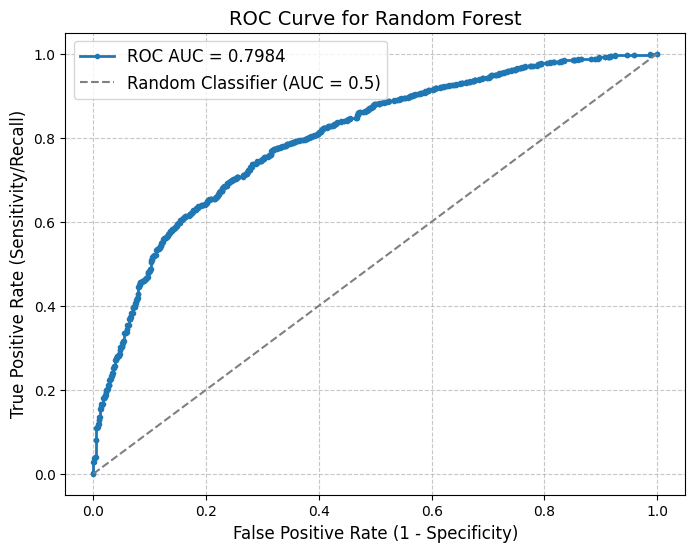

In [ ]:

# Get probability scores for the positive class (ChronicCondition = 1)
y_test_prob = best_rf_model.predict_proba(X_test)[:, 1]

# Compute False Positive Rate (FPR) and True Positive Rate (TPR)
fpr, tpr, _ = roc_curve(y_test, y_test_prob)

# Compute AUC-ROC Score
roc_auc = auc(fpr, tpr)

# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, marker='.', linestyle='-', linewidth=2, label=f'ROC AUC = {roc_auc:.4f}')

# Plot the random classifier baseline (diagonal line)
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Classifier (AUC = 0.5)')

# Labels and title
plt.xlabel('False Positive Rate (1 - Specificity)', fontsize=12)
plt.ylabel('True Positive Rate (Sensitivity/Recall)', fontsize=12)
plt.title('ROC Curve for Random Forest', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.show()

# Logistic Regression

In [ ]:
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import SMOTE
from collections import Counter
exclude_vars = ['Age', 'Weight','UsedECigEver','SocMed_DiscussHCP',
                'Height_Inches', 'MedConditions_HighBP', 'MedConditions_Diabetes', 'MedConditions_HeartCondition',
                'MedConditions_LungDisease','MedConditions_Depression','ChronicCondition'
                ]
X = df5.drop(columns=exclude_vars)
y = df5['ChronicCondition']

# Normalize the dataset using MinMaxScaler
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Split the dataset into training (85%) and testing (15%) using stratified sampling
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.15, stratify=y, random_state=42
)

# Applying SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

print(f"Original class distribution: {Counter(y)}")
print(f"Class distribution after SMOTE: {Counter(y_resampled)}")
# Define the hyperparameter values for Logistic Regression with Elastic Net
C_values = [0.1, 0.5,1]
l1_ratios = [0.5, 0.7, 0.9]
max_iter_values = [800,900,1000]

# Create lists to store results of each hyperparameter combination
results = []

# 5-fold cross-validation setup
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Grid search through hyperparameters, only with Elastic Net penalty
for C in C_values:
    for l1_ratio in l1_ratios:
        for max_iter in max_iter_values:
            # Initialize the model with Elastic Net
            model = LogisticRegression(
                C=C,
                penalty='elasticnet',
                solver='saga',
                class_weight='balanced',
                l1_ratio=l1_ratio,
                max_iter=max_iter,
                random_state=42
            )

            fold_accuracies = []

            # Cross-validation loop
            print(f"\nHyperparameters: C={C}, l1_ratio={l1_ratio}, "
                  f"max_iter={max_iter}")

            for fold, (train_index, val_index) in enumerate(kf.split(X_resampled,y_resampled), 1):
                # Split training into training and validation sets
                X_train_fold, X_val_fold = X_resampled[train_index], X_resampled[val_index]
                y_train_fold, y_val_fold = y_resampled.iloc[train_index], y_resampled.iloc[val_index]

                # Train the model on the training fold
                model.fit(X_train_fold, y_train_fold)

                # Validate the model
                val_predictions = model.predict(X_val_fold)
                fold_accuracy = accuracy_score(y_val_fold, val_predictions)
                fold_accuracies.append(fold_accuracy)

                # Print accuracy for each fold
                print(f"Fold {fold} - Validation Accuracy: {fold_accuracy:.4f}")

            # Calculate the mean accuracy for this hyperparameter combination
            avg_accuracy = np.mean(fold_accuracies)
            print(f"Average Validation Accuracy for this combination: {avg_accuracy:.4f}\n")

            # Store the results
            results.append({
                'C': C,
                'l1_ratio': l1_ratio,
                'max_iter': max_iter,
                'average_cv_accuracy': avg_accuracy
            })

# Find and print the best hyperparameter combination based on cross-validation accuracy
best_result = max(results, key=lambda x: x['average_cv_accuracy'])
print("\nBest Hyperparameters:")
print(f"C: {best_result['C']}")
print(f"l1_ratio: {best_result['l1_ratio']}")
print(f"max_iter: {best_result['max_iter']}")
print(f"Average Cross-Validation Accuracy: {best_result['average_cv_accuracy']:.4f}")

# Use the best hyperparameters to create the final Logistic Regression model
best_logistic_model = LogisticRegression(
    C=best_result['C'],
    penalty='elasticnet',
    solver='saga',
    l1_ratio=best_result['l1_ratio'],
    class_weight= 'balanced',
    max_iter=best_result['max_iter'],
    random_state=42
)

# Train the best model on the entire training set
best_logistic_model.fit(X_resampled, y_resampled)

# Evaluate on the test set
y_test_pred = best_logistic_model.predict(X_test)

# Calculate testing accuracy
test_accuracy = accuracy_score(y_test, y_test_pred)

# Calculate additional performance metrics (Precision, Recall, F1, AUC)
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_test_pred)
roc_auc = roc_auc_score(y_test, y_test_pred)

print(f"\nTest Set Performance for Logistic Regression:")
print(f"Testing Accuracy: {test_accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"AUC Score: {roc_auc:.4f}")

Original class distribution: Counter({1: 9935, 0: 5191})
Class distribution after SMOTE: Counter({1: 8445, 0: 8445})

Hyperparameters: C=0.1, l1_ratio=0.5, max_iter=800
Fold 1 - Validation Accuracy: 0.7422
Fold 2 - Validation Accuracy: 0.7617
Fold 3 - Validation Accuracy: 0.7413
Fold 4 - Validation Accuracy: 0.7439
Fold 5 - Validation Accuracy: 0.7389
Average Validation Accuracy for this combination: 0.7456


Hyperparameters: C=0.1, l1_ratio=0.5, max_iter=900
Fold 1 - Validation Accuracy: 0.7422
Fold 2 - Validation Accuracy: 0.7617
Fold 3 - Validation Accuracy: 0.7413
Fold 4 - Validation Accuracy: 0.7439
Fold 5 - Validation Accuracy: 0.7389
Average Validation Accuracy for this combination: 0.7456


Hyperparameters: C=0.1, l1_ratio=0.5, max_iter=1000
Fold 1 - Validation Accuracy: 0.7422
Fold 2 - Validation Accuracy: 0.7617
Fold 3 - Validation Accuracy: 0.7413
Fold 4 - Validation Accuracy: 0.7439
Fold 5 - Validation Accuracy: 0.7389
Average Validation Accuracy for this combination: 0.745

# Important features from Logistic Regression

In [ ]:
# Extract feature importance (absolute values of coefficients)
feature_importance = np.abs(best_logistic_model.coef_[0])

# Create a DataFrame for better visualization
importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importance})

# Sort by importance
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Display the top features
print(importance_df.head(60))

                            Feature  Importance
88                    GeneralHealth    2.778502
114                         AgeGrpB    1.848518
116                             BMI    1.787668
44                   FreqGoProvider    1.009919
96                          Nervous    0.974978
127            OtherDevTrackHealth2    0.955855
132        RecordsOnline_RefillMeds    0.916054
82            HowAccessOnlineRecord    0.897730
48                InvolvedDecisions    0.784178
38           SharedHealthDeviceInfo    0.725590
128                IntRsn_WroteBlog    0.686492
179                   TrustHCSystem    0.674049
129                  TextFromDoctor    0.649487
103  HowLongModerateExerciseMinutes    0.629339
149               ExRec_DecreasedEx    0.614495
203             FeelPeopleNotWithMe    0.611726
200                     FeelLeftOut    0.576439
134   WeeklyMinutesModerateExercise    0.566781
137            AccessUsingHealthApp    0.559895
97                         Worrying    0

# Shap value

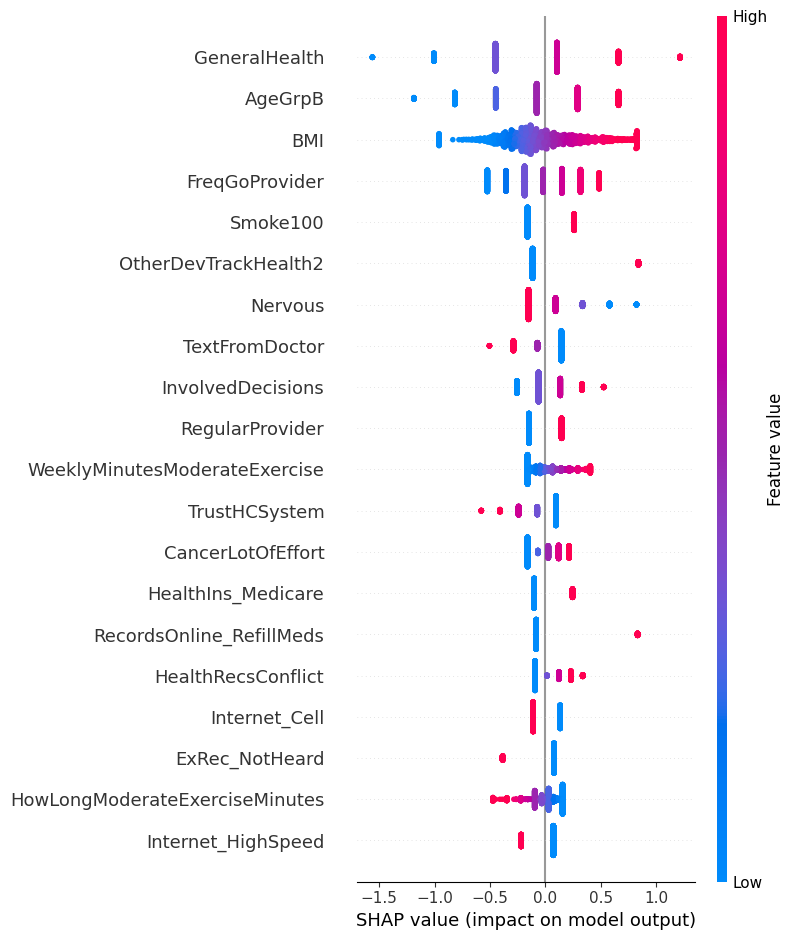

In [ ]:
# Initialize JavaScript visualization
shap.initjs()

# Create SHAP explainer for Logistic Regression model
explainer = shap.LinearExplainer(best_logistic_model, X_train)

# Calculate SHAP values for the test set
shap_values = explainer.shap_values(np.array(X_test))

# Create a summary plot for the top 20 features
shap.summary_plot(shap_values, X_test, feature_names=X.columns, max_display=20)

# Precision Recall Curve

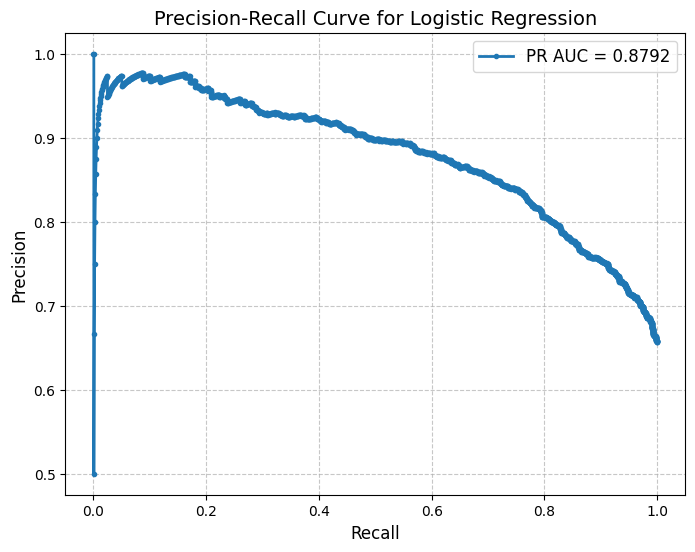

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, auc

# Get probability scores for the positive class (ChronicCondition = 1)
y_test_prob = best_logistic_model.predict_proba(X_test)[:, 1]

# Compute Precision-Recall pairs
precision, recall, _ = precision_recall_curve(y_test, y_test_prob)

# Compute Area Under Precision-Recall Curve (PR-AUC)
pr_auc = auc(recall, precision)

# Plot Precision-Recall Curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', linestyle='-', linewidth=2, label=f'PR AUC = {pr_auc:.4f}')

# Improve visualization
plt.xlabel('Recall', fontsize=12)
plt.ylabel('Precision', fontsize=12)
plt.title('Precision-Recall Curve for Logistic Regression', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.show()

# ROC Curve

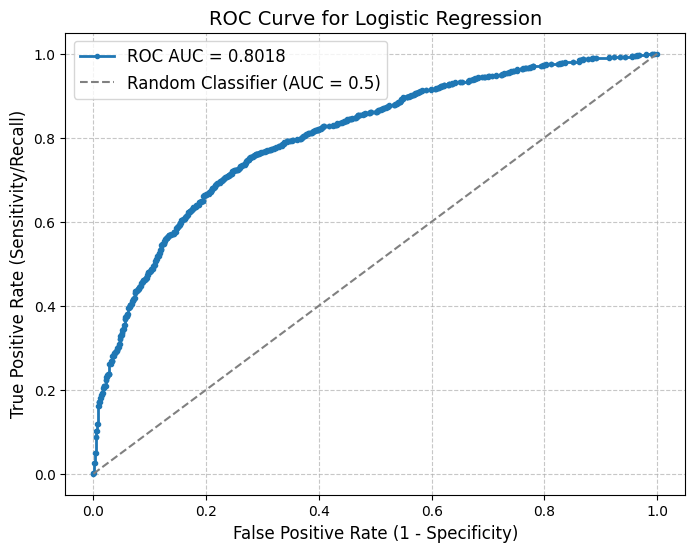

In [ ]:

# Get probability scores for the positive class (ChronicCondition = 1)
y_test_prob = best_logistic_model.predict_proba(X_test)[:, 1]

# Compute False Positive Rate (FPR) and True Positive Rate (TPR)
fpr, tpr, _ = roc_curve(y_test, y_test_prob)

# Compute AUC-ROC Score
roc_auc = auc(fpr, tpr)

# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, marker='.', linestyle='-', linewidth=2, label=f'ROC AUC = {roc_auc:.4f}')

# Plot the random classifier baseline (diagonal line)
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Classifier (AUC = 0.5)')

# Labels and title
plt.xlabel('False Positive Rate (1 - Specificity)', fontsize=12)
plt.ylabel('True Positive Rate (Sensitivity/Recall)', fontsize=12)
plt.title('ROC Curve for Logistic Regression', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.show()

# Support Vector Machine

In [ ]:
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import SMOTE
from collections import Counter
exclude_vars = ['Age', 'Weight','UsedECigEver','SocMed_DiscussHCP',
                'Height_Inches', 'MedConditions_HighBP', 'MedConditions_Diabetes', 'MedConditions_HeartCondition',
                'MedConditions_LungDisease','MedConditions_Depression','ChronicCondition'
                ]
X = df5.drop(columns=exclude_vars)
y = df5['ChronicCondition']

# Normalize the dataset using MinMaxScaler
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Split the dataset into training (85%) and testing (15%) using stratified sampling
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.15, stratify=y, random_state=42
)

# Applying SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

print(f"Original class distribution: {Counter(y)}")
print(f"Class distribution after SMOTE: {Counter(y_resampled)}")

# Define Hyperparameter Grid for SVM
C_values = [1, 10]
kernels = ['rbf', 'poly']
gammas = ['scale', 'auto']

# Create lists to store results of each hyperparameter combination
results = []

# 5-fold cross-validation setup
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Grid search through hyperparameters for SVM
for C in C_values:
    for kernel in kernels:
        for gamma in gammas:

            # Initialize the SVM model
            model = SVC(
                C=C,
                kernel=kernel,
                gamma=gamma,
                class_weight='balanced',
                probability=True,
                random_state=42
            )

            fold_accuracies = []

            # Cross-validation loop
            print(f"\nHyperparameters: C={C}, kernel={kernel}, gamma={gamma}")

            for fold, (train_index, val_index) in enumerate(kf.split(X_resampled,y_resampled), 1):
                # Split training into training and validation sets
                X_train_fold, X_val_fold = X_resampled[train_index], X_resampled[val_index]
                y_train_fold, y_val_fold = y_resampled.iloc[train_index], y_resampled.iloc[val_index]

                # Train the model on the training fold
                model.fit(X_train_fold, y_train_fold)

                # Validate the model
                val_predictions = model.predict(X_val_fold)
                fold_accuracy = accuracy_score(y_val_fold, val_predictions)
                fold_accuracies.append(fold_accuracy)

                # Print accuracy for each fold
                print(f"Fold {fold} - Validation Accuracy: {fold_accuracy:.4f}")

            # Calculate the mean accuracy for this hyperparameter combination
            avg_accuracy = np.mean(fold_accuracies)
            print(f"Average Validation Accuracy for this combination: {avg_accuracy:.4f}\n")

            # Store the results
            results.append({
                'C': C,
                'kernel': kernel,
                'gamma': gamma,
                'average_cv_accuracy': avg_accuracy
            })

# Find and print the best hyperparameter combination based on cross-validation accuracy
best_result = max(results, key=lambda x: x['average_cv_accuracy'])
print("\nBest Hyperparameters:")
print(f"C: {best_result['C']}")
print(f"Kernel: {best_result['kernel']}")
print(f"Gamma: {best_result['gamma']}")
print(f"Average Cross-Validation Accuracy: {best_result['average_cv_accuracy']:.4f}")

# Use the best hyperparameters to create the final SVM model
best_svm_model = SVC(
    C=best_result['C'],
    kernel=best_result['kernel'],
    gamma=best_result['gamma'],
    class_weight='balanced',
    probability=True,
    random_state=42
)

# Train the best model on the entire training set
best_svm_model.fit(X_resampled, y_resampled)

# Evaluate on the test set
y_test_pred = best_svm_model.predict(X_test)
y_test_prob = best_svm_model.predict_proba(X_test)[:, 1]

# Calculate testing accuracy
test_accuracy = accuracy_score(y_test, y_test_pred)

# Calculate additional performance metrics (Precision, Recall, F1, AUC)
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_test_pred)
roc_auc = roc_auc_score(y_test, y_test_prob)

print(f"\nTest Set Performance for SVM Classifier:")
print(f"Testing Accuracy: {test_accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"AUC Score: {roc_auc:.4f}")


Original class distribution: Counter({1: 9935, 0: 5191})
Class distribution after SMOTE: Counter({1: 8445, 0: 8445})

Hyperparameters: C=1, kernel=rbf, gamma=scale
Fold 1 - Validation Accuracy: 0.7857
Fold 2 - Validation Accuracy: 0.8040
Fold 3 - Validation Accuracy: 0.7883
Fold 4 - Validation Accuracy: 0.7948
Fold 5 - Validation Accuracy: 0.7889
Average Validation Accuracy for this combination: 0.7924


Hyperparameters: C=1, kernel=rbf, gamma=auto
Fold 1 - Validation Accuracy: 0.7519
Fold 2 - Validation Accuracy: 0.7718
Fold 3 - Validation Accuracy: 0.7516
Fold 4 - Validation Accuracy: 0.7578
Fold 5 - Validation Accuracy: 0.7457
Average Validation Accuracy for this combination: 0.7558


Hyperparameters: C=1, kernel=poly, gamma=scale
Fold 1 - Validation Accuracy: 0.7798
Fold 2 - Validation Accuracy: 0.7999
Fold 3 - Validation Accuracy: 0.7824
Fold 4 - Validation Accuracy: 0.7886
Fold 5 - Validation Accuracy: 0.7815
Average Validation Accuracy for this combination: 0.7864


Hyperparamet

# Shap value

In [ ]:
# Initialize SHAP for visualization
shap.initjs()

# Create SHAP explainer using KernelExplainer (for SVM)
explainer = shap.KernelExplainer(best_svm_model.predict_proba, X_train[:50])  # Use a subset

# Compute SHAP values for the test set
shap_values = explainer.shap_values(X_test)

# SHAP Summary Plot (Feature Importance)
shap.summary_plot(shap_values[1], X_test, feature_names=X.columns, max_display=20)


# Precision Recall Curve

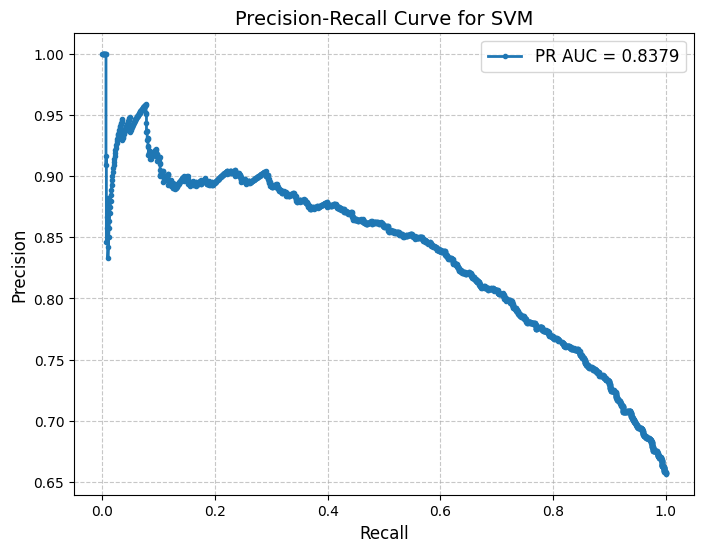

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, auc

# Get probability scores for the positive class (ChronicCondition = 1)
y_test_prob = best_svm_model.predict_proba(X_test)[:, 1]

# Compute Precision-Recall pairs
precision, recall, _ = precision_recall_curve(y_test, y_test_prob)

# Compute Area Under Precision-Recall Curve (PR-AUC)
pr_auc = auc(recall, precision)

# Plot Precision-Recall Curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', linestyle='-', linewidth=2, label=f'PR AUC = {pr_auc:.4f}')

# Improve visualization
plt.xlabel('Recall', fontsize=12)
plt.ylabel('Precision', fontsize=12)
plt.title('Precision-Recall Curve for SVM', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.show()

# ROC Curve

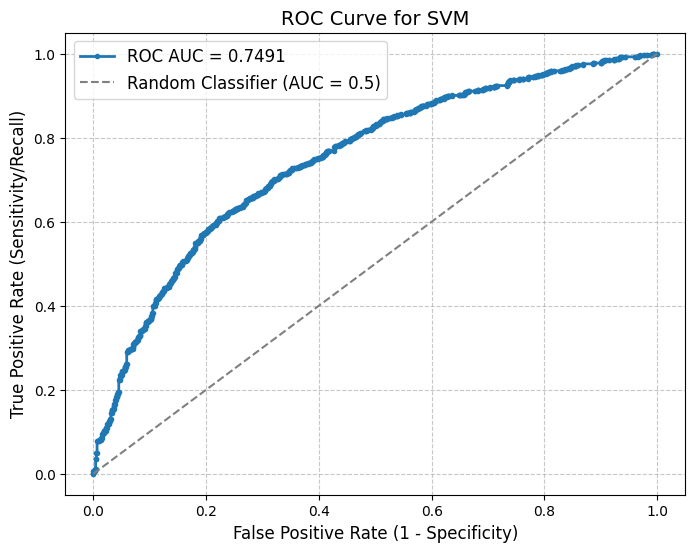

In [ ]:
# Get probability scores for the positive class (ChronicCondition = 1)
y_test_prob = best_svm_model.predict_proba(X_test)[:, 1]

# Compute False Positive Rate (FPR) and True Positive Rate (TPR)
fpr, tpr, _ = roc_curve(y_test, y_test_prob)

# Compute AUC-ROC Score
roc_auc = auc(fpr, tpr)

# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, marker='.', linestyle='-', linewidth=2, label=f'ROC AUC = {roc_auc:.4f}')

# Plot the random classifier baseline (diagonal line)
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Classifier (AUC = 0.5)')

# Labels and title
plt.xlabel('False Positive Rate (1 - Specificity)', fontsize=12)
plt.ylabel('True Positive Rate (Sensitivity/Recall)', fontsize=12)
plt.title('ROC Curve for SVM', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.show()

# Gradient Boosting

In [ ]:
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import SMOTE
from collections import Counter
exclude_vars = ['Age', 'Weight',
                'Height_Inches', 'MedConditions_HighBP', 'MedConditions_Diabetes', 'MedConditions_HeartCondition',
                'MedConditions_LungDisease','MedConditions_Depression','ChronicCondition'
                ]
X = df5.drop(columns=exclude_vars)
y = df5['ChronicCondition']

# Normalize the dataset using MinMaxScaler
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Split the dataset into training (85%) and testing (15%) using stratified sampling
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.15, stratify=y, random_state=42
)

# Applying SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

print(f"Original class distribution: {Counter(y)}")
print(f"Class distribution after SMOTE: {Counter(y_resampled)}")

# Define Hyperparameter Grid for Gradient Boosting
n_estimators = [200, 300]
learning_rates = [0.01,0.05]
max_depths = [5, 7]
min_samples_splits = [5, 10]
min_samples_leafs = [2, 5]

# Create lists to store results of each hyperparameter combination
results = []

# 5-fold cross-validation setup
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Grid search through hyperparameters for Gradient Boosting
for n_est in n_estimators:
    for learning_rate in learning_rates:
        for max_depth in max_depths:
            for min_split in min_samples_splits:
                for min_leaf in min_samples_leafs:

                        # Initialize the Gradient Boosting model
                        model = GradientBoostingClassifier(
                            n_estimators=n_est,
                            learning_rate=learning_rate,
                            max_depth=max_depth,
                            max_features='sqrt',
                            min_samples_split=min_split,
                            min_samples_leaf=min_leaf,
                            random_state=42
                        )

                        fold_accuracies = []

                        # Cross-validation loop
                        print(f"\nHyperparameters: n_estimators={n_est}, learning_rate={learning_rate}, max_depth={max_depth}",
                              f"min_samples_split={min_split}, min_samples_leaf={min_leaf}")

                        for fold, (train_index, val_index) in enumerate(kf.split(X_resampled), 1):
                            # Split training into training and validation sets
                            X_train_fold, X_val_fold = X_resampled[train_index], X_resampled[val_index]
                            y_train_fold, y_val_fold = y_resampled.iloc[train_index], y_resampled.iloc[val_index]

                            # Train the model on the training fold
                            model.fit(X_train_fold, y_train_fold)

                            # Validate the model
                            val_predictions = model.predict(X_val_fold)
                            fold_accuracy = accuracy_score(y_val_fold, val_predictions)
                            fold_accuracies.append(fold_accuracy)

                            # Print accuracy for each fold
                            print(f"Fold {fold} - Validation Accuracy: {fold_accuracy:.4f}")

                        # Calculate the mean accuracy for this hyperparameter combination
                        avg_accuracy = np.mean(fold_accuracies)
                        print(f"Average Validation Accuracy for this combination: {avg_accuracy:.4f}\n")

                        # Store the results
                        results.append({
                            'n_estimators': n_est,
                            'learning_rate': learning_rate,
                            'max_depth': max_depth,
                            'min_samples_split': min_split,
                            'min_samples_leaf': min_leaf,
                            'average_cv_accuracy': avg_accuracy
                        })

# Find and print the best hyperparameter combination based on cross-validation accuracy
best_result = max(results, key=lambda x: x['average_cv_accuracy'])
print("\nBest Hyperparameters:")
print(f"n_estimators: {best_result['n_estimators']}")
print(f"learning_rate: {best_result['learning_rate']}")
print(f"max_depth: {best_result['max_depth']}")
print(f"min_samples_split: {best_result['min_samples_split']}")
print(f"min_samples_leaf: {best_result['min_samples_leaf']}")
print(f"Average Cross-Validation Accuracy: {best_result['average_cv_accuracy']:.4f}")

# Use the best hyperparameters to create the final Gradient Boosting model
best_gb_model = GradientBoostingClassifier(
    n_estimators=best_result['n_estimators'],
    learning_rate=best_result['learning_rate'],
    max_depth=best_result['max_depth'],
    max_features='sqrt',
    min_samples_split=best_result['min_samples_split'],
    min_samples_leaf=best_result['min_samples_leaf'],
    random_state=42
)

# Train the best model on the entire training set
best_gb_model.fit(X_resampled, y_resampled)

# Evaluate on the test set
y_test_pred = best_gb_model.predict(X_test)
y_test_prob = best_gb_model.predict_proba(X_test)[:, 1]

# Calculate testing accuracy
test_accuracy = accuracy_score(y_test, y_test_pred)

# Calculate additional performance metrics (Precision, Recall, F1, AUC)
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_test_pred)
roc_auc = roc_auc_score(y_test, y_test_prob)

print(f"\nTest Set Performance for Gradient Boosting Classifier:")
print(f"Testing Accuracy: {test_accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"AUC Score: {roc_auc:.4f}")

# Get feature importances from the trained Gradient Boosting model
feature_importances = best_gb_model.feature_importances_

# Create a DataFrame for better visualization
feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Display the top 60 important features
print(feature_importance_df.head(60))

Original class distribution: Counter({1: 9935, 0: 5191})
Class distribution after SMOTE: Counter({1: 8445, 0: 8445})

Hyperparameters: n_estimators=200, learning_rate=0.01, max_depth=5 min_samples_split=5, min_samples_leaf=2
Fold 1 - Validation Accuracy: 0.7919
Fold 2 - Validation Accuracy: 0.8043
Fold 3 - Validation Accuracy: 0.8049
Fold 4 - Validation Accuracy: 0.7907
Fold 5 - Validation Accuracy: 0.7963
Average Validation Accuracy for this combination: 0.7976


Hyperparameters: n_estimators=200, learning_rate=0.01, max_depth=5 min_samples_split=5, min_samples_leaf=5
Fold 1 - Validation Accuracy: 0.7954
Fold 2 - Validation Accuracy: 0.8022
Fold 3 - Validation Accuracy: 0.8052
Fold 4 - Validation Accuracy: 0.7904
Fold 5 - Validation Accuracy: 0.7954
Average Validation Accuracy for this combination: 0.7978


Hyperparameters: n_estimators=200, learning_rate=0.01, max_depth=5 min_samples_split=10, min_samples_leaf=2
Fold 1 - Validation Accuracy: 0.7931
Fold 2 - Validation Accuracy: 0.803

# Shap value

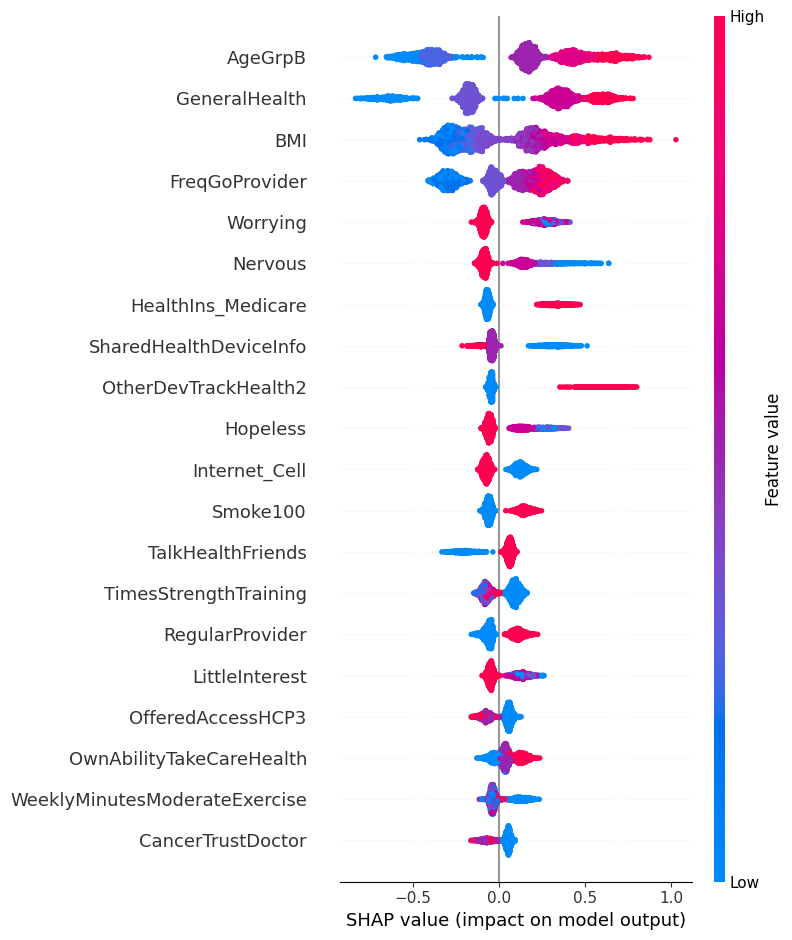

In [ ]:
# Initialize JavaScript visualization
shap.initjs()

# Create a SHAP explainer for the Gradient Boosting model
explainer = shap.TreeExplainer(best_gb_model)

# Calculate SHAP values for the test set
shap_values = explainer.shap_values(X_test)

# SHAP summary plot for the top 20 features
shap.summary_plot(shap_values, X_test, feature_names=X.columns, max_display=20)

# Precision Recall Curve

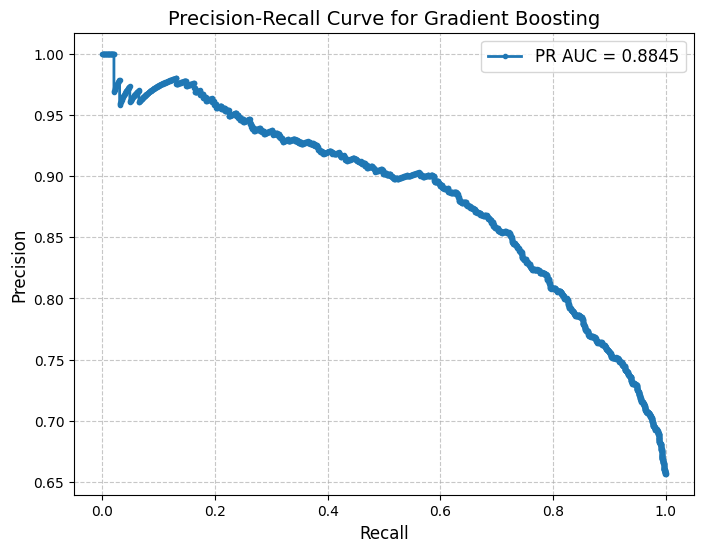

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, auc

# Get probability scores for the positive class (ChronicCondition = 1)
y_test_prob = best_gb_model.predict_proba(X_test)[:, 1]

# Compute Precision-Recall pairs
precision, recall, _ = precision_recall_curve(y_test, y_test_prob)

# Compute Area Under Precision-Recall Curve (PR-AUC)
pr_auc = auc(recall, precision)

# Plot Precision-Recall Curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', linestyle='-', linewidth=2, label=f'PR AUC = {pr_auc:.4f}')

# Improve visualization
plt.xlabel('Recall', fontsize=12)
plt.ylabel('Precision', fontsize=12)
plt.title('Precision-Recall Curve for Gradient Boosting', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.show()

# ROC Curve

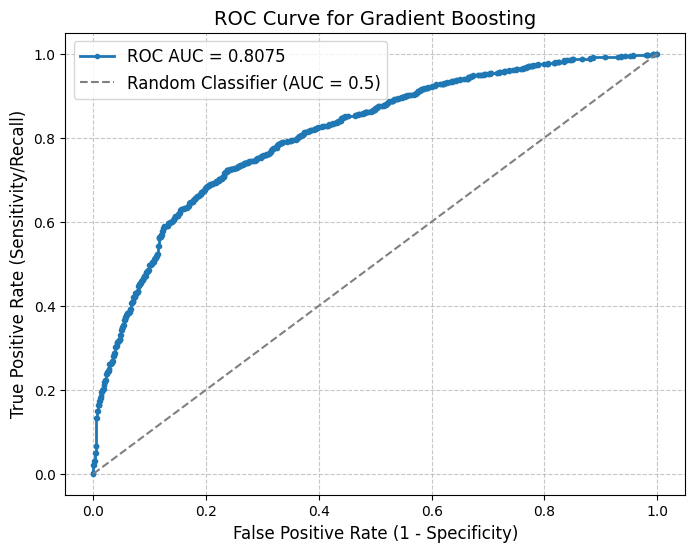

In [ ]:
# Get probability scores for the positive class (ChronicCondition = 1)
y_test_prob = best_gb_model.predict_proba(X_test)[:, 1]

# Compute False Positive Rate (FPR) and True Positive Rate (TPR)
fpr, tpr, _ = roc_curve(y_test, y_test_prob)

# Compute AUC-ROC Score
roc_auc = auc(fpr, tpr)

# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, marker='.', linestyle='-', linewidth=2, label=f'ROC AUC = {roc_auc:.4f}')

# Plot the random classifier baseline (diagonal line)
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Classifier (AUC = 0.5)')

# Labels and title
plt.xlabel('False Positive Rate (1 - Specificity)', fontsize=12)
plt.ylabel('True Positive Rate (Sensitivity/Recall)', fontsize=12)
plt.title('ROC Curve for Gradient Boosting', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.show()

# Neural Network

In [ ]:
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import SMOTE
from collections import Counter
exclude_vars = ['Age', 'Weight','UsedECigEver','SocMed_DiscussHCP',
                'Height_Inches', 'MedConditions_HighBP', 'MedConditions_Diabetes', 'MedConditions_HeartCondition',
                'MedConditions_LungDisease','MedConditions_Depression','ChronicCondition'
                ]
X = df5.drop(columns=exclude_vars)
y = df5['ChronicCondition']

# Normalize the dataset using MinMaxScaler
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Split the dataset into training (85%) and testing (15%) using stratified sampling
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.15, stratify=y, random_state=42
)

# Applying SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

print(f"Original class distribution: {Counter(y)}")
print(f"Class distribution after SMOTE: {Counter(y_resampled)}")

# Define the hyperparameter grid manually
batch_sizes = [16, 32, 64]
learning_rates = [0.001, 0.01, 0.1]
neurons = [64, 128, 256]

# Stratified K-Fold setup
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# To store results
results = []

# Manual Grid Search for Hyperparameter Tuning
for batch_size in batch_sizes:
    for learning_rate in learning_rates:
        for neuron in neurons:
            print(f"\nTesting batch_size={batch_size}, learning_rate={learning_rate}, neurons={neuron}")

            fold_accuracies = []

            for fold, (train_index, val_index) in enumerate(kf.split(X_resampled,y_resampled), 1):

                # Define the Deep Learning model architecture
                model = keras.Sequential([
                    layers.Input(shape=(X_resampled.shape[1],)),
                    layers.Dense(neuron, activation='relu'),
                    layers.Dropout(0.3),
                    layers.Dense(neuron // 2, activation='relu'),
                    layers.Dropout(0.3),
                    layers.Dense(neuron // 4, activation='relu'),
                    layers.Dropout(0.3),
                    layers.Dense(1, activation='sigmoid')
                ])

                # Compile the model with specified learning rate
                model.compile(
                    optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
                    loss='binary_crossentropy',
                    metrics=['accuracy']
                )

                # Split the data into training and validation sets
                X_train_fold, X_val_fold = X_resampled[train_index], X_resampled[val_index]
                y_train_fold, y_val_fold = y_resampled[train_index], y_resampled[val_index]

                # Train the model
                model.fit(X_train_fold, y_train_fold,
                          validation_data=(X_val_fold, y_val_fold),
                          epochs=20,
                          batch_size=batch_size,
                          verbose=0)

                # Evaluate the model
                val_loss, val_accuracy = model.evaluate(X_val_fold, y_val_fold, verbose=0)
                fold_accuracies.append(val_accuracy)
                print(f"Fold {fold} - Validation Accuracy: {val_accuracy:.4f}")

            # Average accuracy for this combination
            avg_accuracy = np.mean(fold_accuracies)
            print(f"Average Validation Accuracy: {avg_accuracy:.4f}\n")

            # Store the result
            results.append({
                'batch_size': batch_size,
                'learning_rate': learning_rate,
                'neurons': neuron,
                'average_cv_accuracy': avg_accuracy
            })

# Find the best hyperparameter combination
best_result = max(results, key=lambda x: x['average_cv_accuracy'])
print("\nBest Hyperparameters:")
print(f"Batch Size: {best_result['batch_size']}")
print(f"Learning Rate: {best_result['learning_rate']}")
print(f"Neurons: {best_result['neurons']}")
print(f"Average Cross-Validation Accuracy: {best_result['average_cv_accuracy']:.4f}")

# Build the Final Deep Learning Model with Best Hyperparameters
deep_lr_model = keras.Sequential([
    layers.Input(shape=(X_resampled.shape[1],)),
    layers.Dense(best_result['neurons'], activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(best_result['neurons'] // 2, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(best_result['neurons'] // 4, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(1, activation='sigmoid')
])

# Compile the final model
deep_lr_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=best_result['learning_rate']),
    loss='binary_crossentropy',
    metrics=['accuracy', keras.metrics.Precision(), keras.metrics.Recall(), keras.metrics.AUC()]
)

# Train the model on the entire training set
deep_lr_model.fit(
    X_resampled, y_resampled,
    epochs=20,
    batch_size=best_result['batch_size'],
    verbose=1
)

# Evaluate on the test set
y_test_prob = deep_lr_model.predict(X_test).ravel()
y_test_pred = (y_test_prob > 0.5).astype(int)

# Calculate testing accuracy
test_accuracy = accuracy_score(y_test, y_test_pred)

# Calculate additional performance metrics (Precision, Recall, F1, AUC)
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_test_pred)
roc_auc = roc_auc_score(y_test, y_test_prob)

print(f"\nTest Set Performance for Deep Learning Model:")
print(f"Testing Accuracy: {test_accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"AUC Score: {roc_auc:.4f}")

Original class distribution: Counter({1: 9935, 0: 5191})
Class distribution after SMOTE: Counter({1: 8445, 0: 8445})

Testing batch_size=16, learning_rate=0.001, neurons=64
Fold 1 - Validation Accuracy: 0.7676
Fold 2 - Validation Accuracy: 0.7824
Fold 3 - Validation Accuracy: 0.7688
Fold 4 - Validation Accuracy: 0.7771
Fold 5 - Validation Accuracy: 0.7513
Average Validation Accuracy: 0.7694


Testing batch_size=16, learning_rate=0.001, neurons=128
Fold 1 - Validation Accuracy: 0.7593
Fold 2 - Validation Accuracy: 0.7892
Fold 3 - Validation Accuracy: 0.7795
Fold 4 - Validation Accuracy: 0.7851
Fold 5 - Validation Accuracy: 0.7715
Average Validation Accuracy: 0.7769


Testing batch_size=16, learning_rate=0.001, neurons=256
Fold 1 - Validation Accuracy: 0.7753
Fold 2 - Validation Accuracy: 0.7866
Fold 3 - Validation Accuracy: 0.7792
Fold 4 - Validation Accuracy: 0.7836
Fold 5 - Validation Accuracy: 0.7738
Average Validation Accuracy: 0.7797


Testing batch_size=16, learning_rate=0.01, neu

# Precision Recall Curve

71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


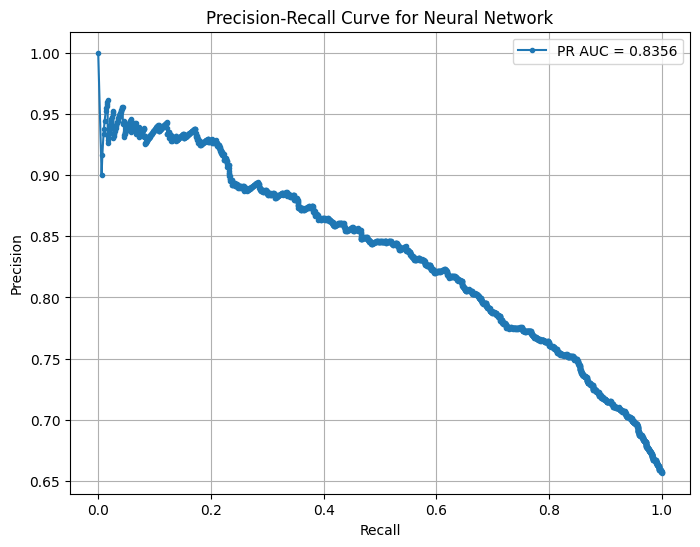

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, auc

# Get model probability scores for the positive class (chronic disease = 1)
y_test_prob = deep_lr_model.predict(X_test).ravel()  # Flatten the output if needed

# Compute precision-recall pairs
precision, recall, _ = precision_recall_curve(y_test, y_test_prob)

# Compute Area Under Precision-Recall Curve (PR-AUC)
pr_auc = auc(recall, precision)

# Plot Precision-Recall Curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', label=f'PR AUC = {pr_auc:.4f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve for Neural Network')
plt.legend()
plt.grid()
plt.show()

# ROC Curve

71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


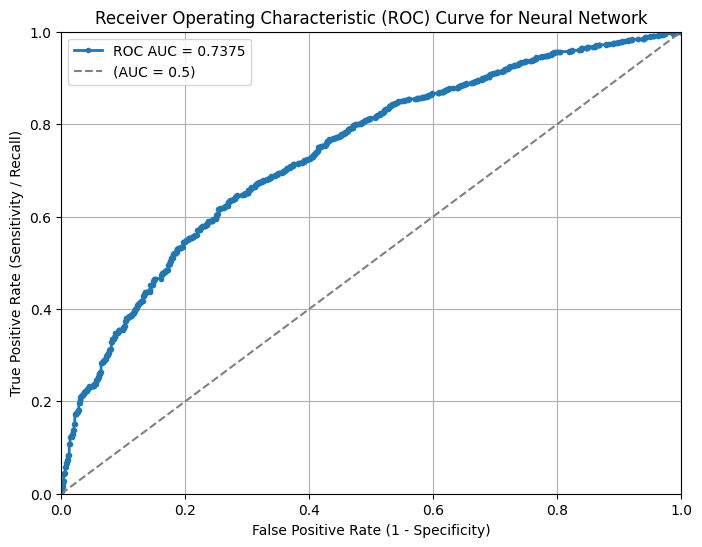

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Get predicted probabilities for the positive class (chronic disease = 1)
y_test_prob = deep_lr_model.predict(X_test).ravel()  # Ensure it's a 1D array

# Compute FPR, TPR, and thresholds
fpr, tpr, _ = roc_curve(y_test, y_test_prob)

# Compute Area Under ROC Curve (AUC-ROC)
roc_auc = auc(fpr, tpr)

# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, marker='.', linestyle='-', linewidth=2, label=f'ROC AUC = {roc_auc:.4f}')

# Plot the random classifier baseline (dashed diagonal line)
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='(AUC = 0.5)')

# Labels and title
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity / Recall)')
plt.title('Receiver Operating Characteristic (ROC) Curve for Neural Network')
plt.legend()
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.grid()

# Show the plot
plt.show()

# Summary of Approach 4

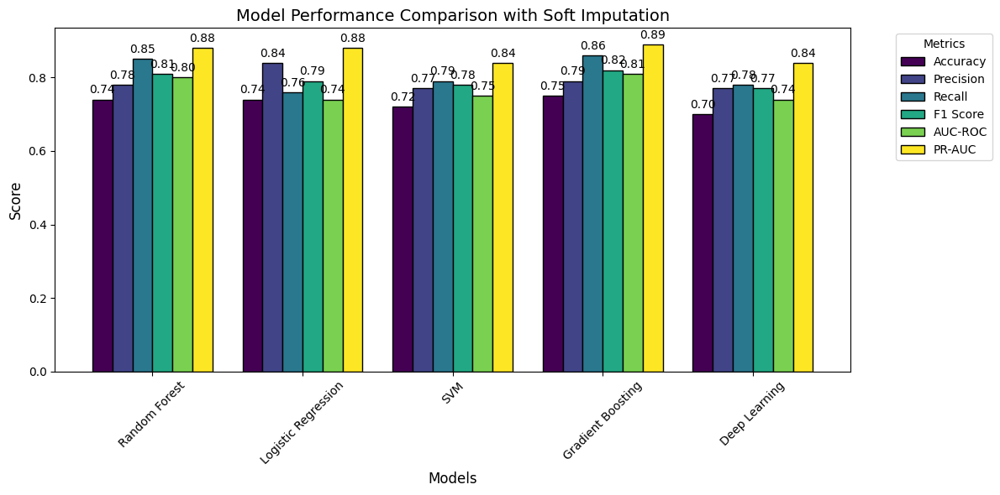

In [ ]:
# Store performance metrics for each model
model_performance = {
    "Random Forest": [0.74, 0.78, 0.85, 0.81, 0.80,0.88],
    "Logistic Regression": [0.74, 0.84, 0.76, 0.79, 0.74, 0.88],
    "SVM": [0.72, 0.77, 0.79, 0.78, 0.75, 0.84],
    "Gradient Boosting": [0.75, 0.79, 0.86, 0.82, 0.81, 0.89],
    "Deep Learning": [0.70, 0.77, 0.78, 0.77, 0.74, 0.84],
}

# Define metric names
metrics = ["Accuracy", "Precision", "Recall", "F1 Score", "AUC-ROC", "PR-AUC"]

# Convert dictionary into a DataFrame
df_performance = pd.DataFrame(model_performance, index=metrics)

# Plot grouped bar chart
ax = df_performance.T.plot(kind='bar', figsize=(12, 6), colormap='viridis', edgecolor='black', width = 0.8)

# Add value labels to bars
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f', fontsize=10, padding=3)

# Labels and title
plt.title("Model Performance Comparison with Soft Imputation", fontsize=14)
plt.xlabel("Models", fontsize=12)
plt.ylabel("Score", fontsize=12)
plt.xticks(rotation=45)
plt.legend(title="Metrics", bbox_to_anchor=(1.05, 1), loc='upper left')

# Show plot
plt.tight_layout()
plt.show()

# Validation of Missing Values among different Imputations

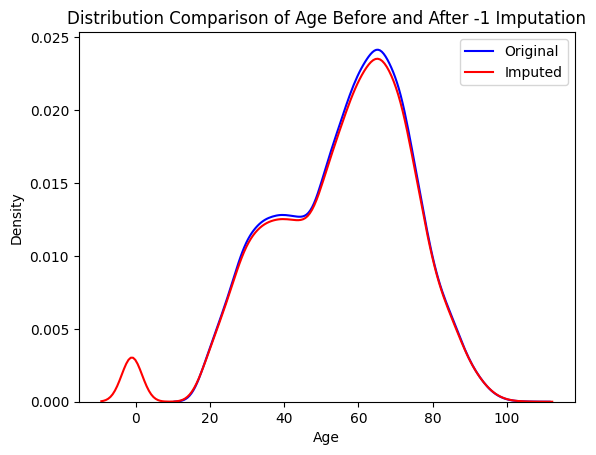

In [ ]:
# Example for a variable 'age'
sns.kdeplot(df2['Age'].dropna(), label='Original', color='blue')
sns.kdeplot(df1['Age'], label='Imputed', color='red')
plt.title('Distribution Comparison of Age Before and After -1 Imputation')
plt.legend()
plt.show()

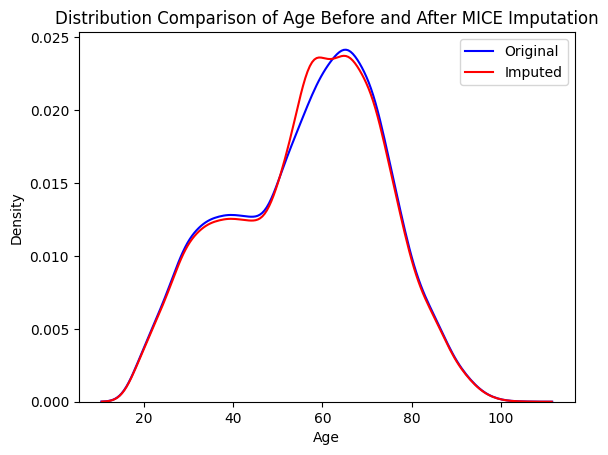

In [ ]:
# Example for a variable 'age'
sns.kdeplot(df2['Age'].dropna(), label='Original', color='blue')
sns.kdeplot(df3['Age'], label='Imputed', color='red')
plt.title('Distribution Comparison of Age Before and After MICE Imputation')
plt.legend()
plt.show()

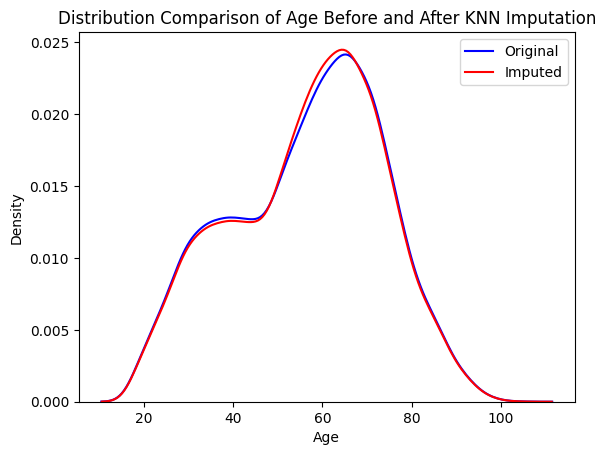

In [ ]:
# Example for a variable 'age'
sns.kdeplot(df2['Age'].dropna(), label='Original', color='blue')
sns.kdeplot(df4['Age'], label='Imputed', color='red')
plt.title('Distribution Comparison of Age Before and After KNN Imputation')
plt.legend()
plt.show()

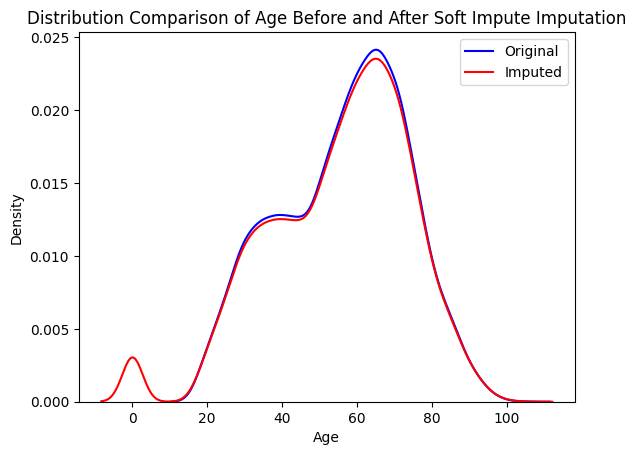

In [ ]:
# Example for a variable 'age'
sns.kdeplot(df2['Age'].dropna(), label='Original', color='blue')
sns.kdeplot(df5['Age'], label='Imputed', color='red')
plt.title('Distribution Comparison of Age Before and After Soft Impute Imputation')
plt.legend()
plt.show()

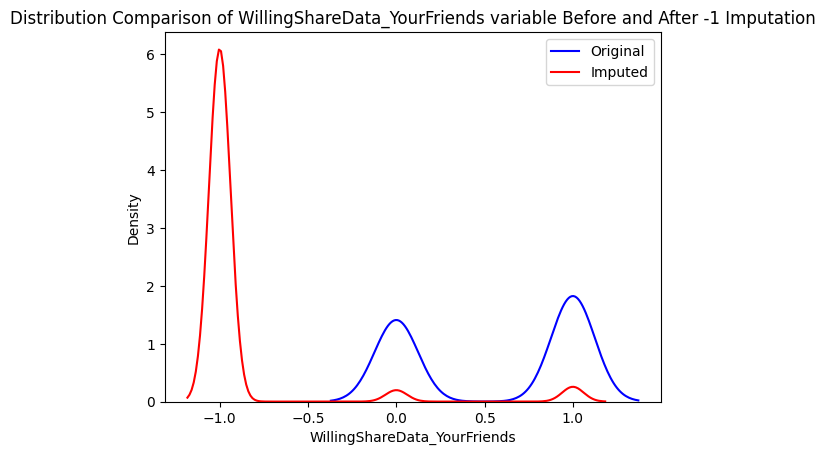

In [ ]:
# Example for a variable 'WillingShareData_YourFriends'
sns.kdeplot(df2['WillingShareData_YourFriends'].dropna(), label='Original', color='blue')
sns.kdeplot(df1['WillingShareData_YourFriends'], label='Imputed', color='red')
plt.title('Distribution Comparison of WillingShareData_YourFriends variable Before and After -1 Imputation')
plt.legend()
plt.show()

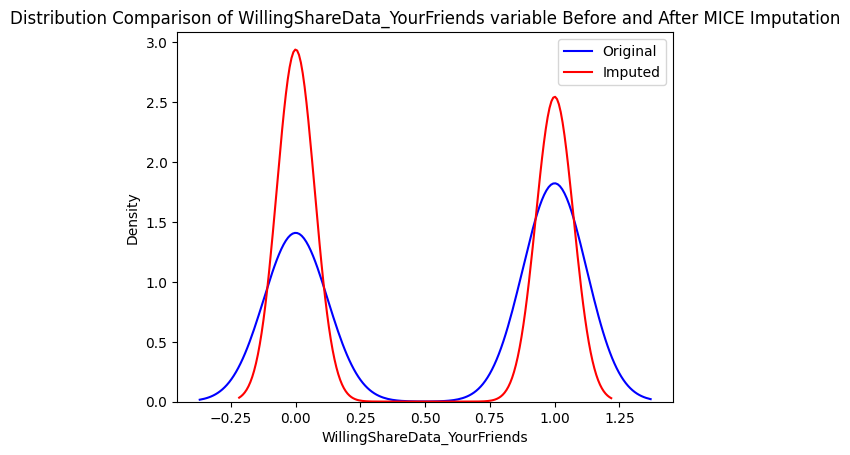

In [ ]:
# Example for a variable 'WillingShareData_YourFriends'
sns.kdeplot(df2['WillingShareData_YourFriends'].dropna(), label='Original', color='blue')
sns.kdeplot(df3['WillingShareData_YourFriends'], label='Imputed', color='red')
plt.title('Distribution Comparison of WillingShareData_YourFriends variable Before and After MICE Imputation')
plt.legend()
plt.show()

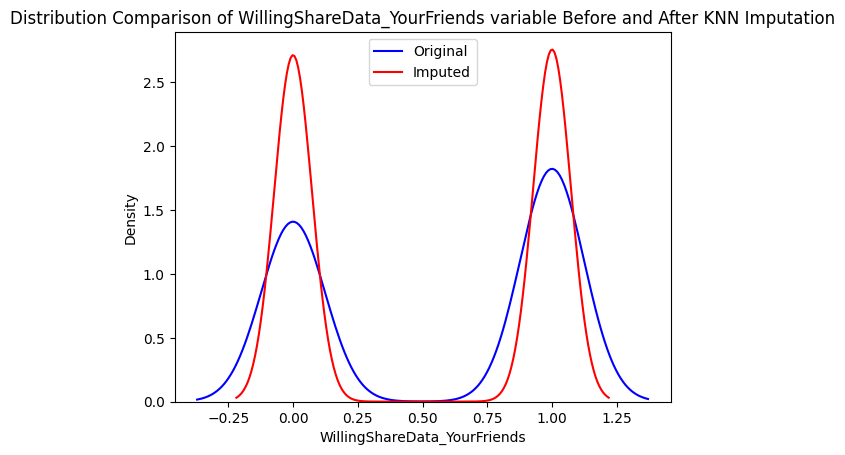

In [ ]:
# Example for a variable 'WillingShareData_YourFriends'
sns.kdeplot(df2['WillingShareData_YourFriends'].dropna(), label='Original', color='blue')
sns.kdeplot(df4['WillingShareData_YourFriends'], label='Imputed', color='red')
plt.title('Distribution Comparison of WillingShareData_YourFriends variable Before and After KNN Imputation')
plt.legend()
plt.show()

# For Binary Variable

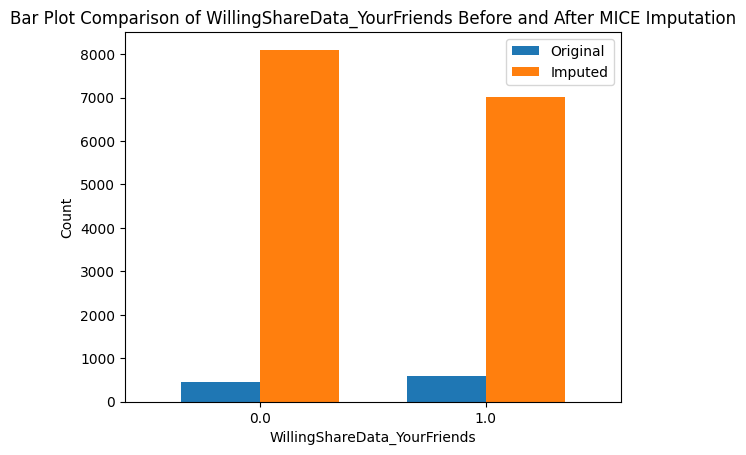

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Get value counts
original_counts = df2['WillingShareData_YourFriends'].value_counts(dropna=True).sort_index()
imputed_counts = df3['WillingShareData_YourFriends'].value_counts().sort_index()

# Combine into a DataFrame for plotting
bar_df = pd.DataFrame({
    'Original': original_counts,
    'Imputed': imputed_counts
})

# Plot
bar_df.plot(kind='bar', width=0.7)
plt.title('Bar Plot Comparison of WillingShareData_YourFriends Before and After MICE Imputation')
plt.xlabel('WillingShareData_YourFriends')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.legend()
plt.show()

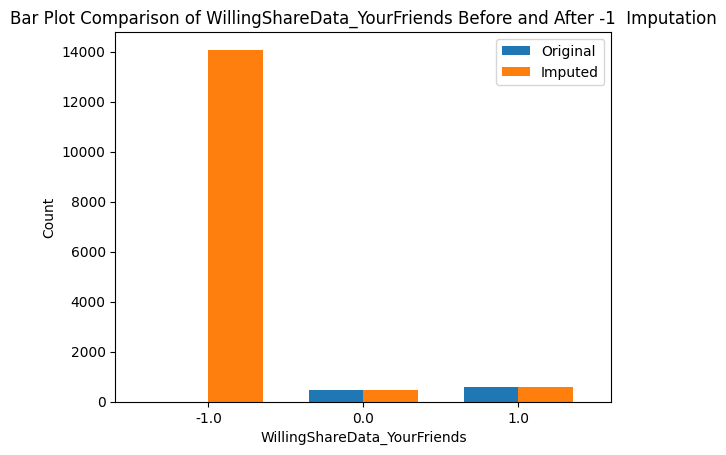

In [ ]:

# Get value counts
original_counts = df2['WillingShareData_YourFriends'].value_counts(dropna=True).sort_index()
imputed_counts = df1['WillingShareData_YourFriends'].value_counts().sort_index()

# Combine into a DataFrame for plotting
bar_df = pd.DataFrame({
    'Original': original_counts,
    'Imputed': imputed_counts
})

# Plot
bar_df.plot(kind='bar', width=0.7)
plt.title('Bar Plot Comparison of WillingShareData_YourFriends Before and After -1  Imputation')
plt.xlabel('WillingShareData_YourFriends')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.legend()
plt.show()

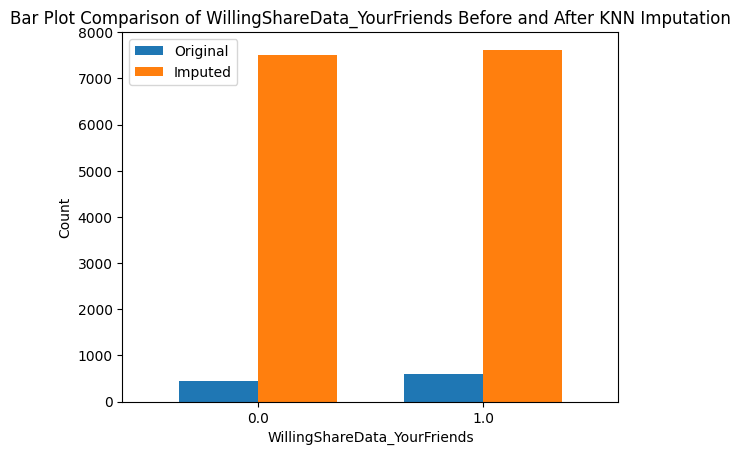

In [ ]:
# Get value counts
original_counts = df2['WillingShareData_YourFriends'].value_counts(dropna=True).sort_index()
imputed_counts = df4['WillingShareData_YourFriends'].value_counts().sort_index()

# Combine into a DataFrame for plotting
bar_df = pd.DataFrame({
    'Original': original_counts,
    'Imputed': imputed_counts
})

# Plot
bar_df.plot(kind='bar', width=0.7)
plt.title('Bar Plot Comparison of WillingShareData_YourFriends Before and After KNN Imputation')
plt.xlabel('WillingShareData_YourFriends')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.legend()
plt.show()

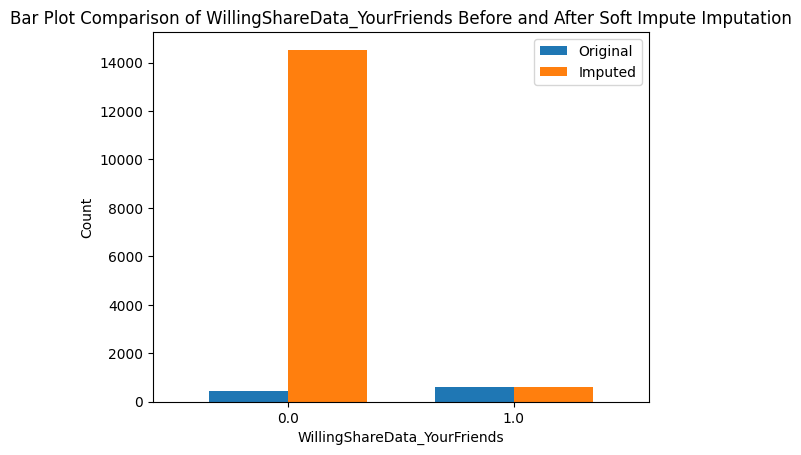

In [ ]:
# Get value counts
original_counts = df2['WillingShareData_YourFriends'].value_counts(dropna=True).sort_index()
imputed_counts = df5['WillingShareData_YourFriends'].value_counts().sort_index()

# Combine into a DataFrame for plotting
bar_df = pd.DataFrame({
    'Original': original_counts,
    'Imputed': imputed_counts
})

# Plot
bar_df.plot(kind='bar', width=0.7)
plt.title('Bar Plot Comparison of WillingShareData_YourFriends Before and After Soft Impute Imputation')
plt.xlabel('WillingShareData_YourFriends')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.legend()
plt.show()

# Bar Graph of PR-AUC for the best performing models based on the different imputations

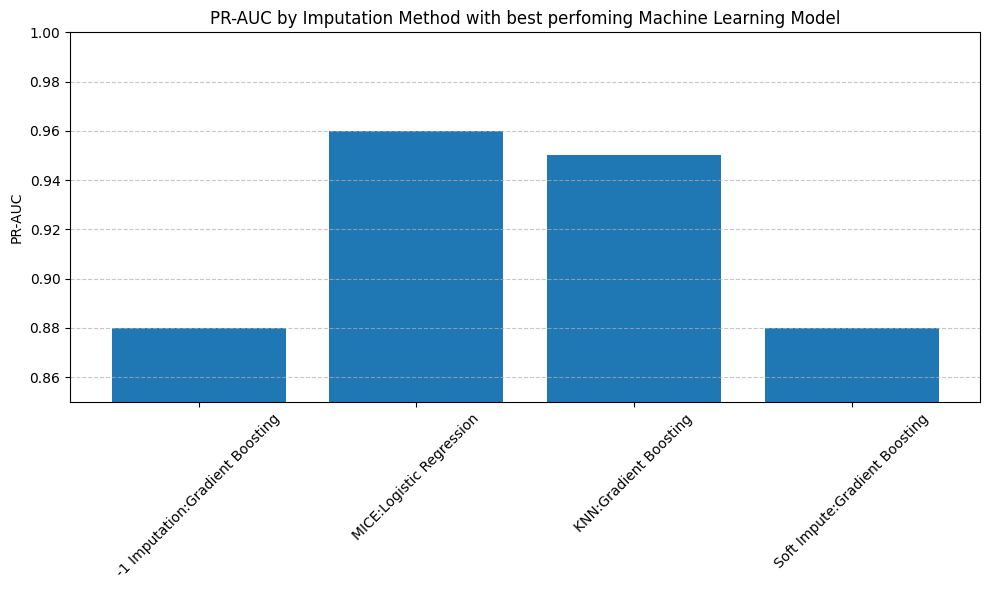

In [ ]:
# Insert the data here
methods = ['-1 Imputation:Gradient Boosting', 'MICE:Logistic Regression', 'KNN:Gradient Boosting', 'Soft Impute:Gradient Boosting']
pr_auc = [0.88, 0.96, 0.95, 0.88]

# Create bar chart
plt.figure(figsize=(10, 6))
plt.bar(methods, pr_auc)
plt.ylabel('PR-AUC')
plt.title('PR-AUC by Imputation Method with best perfoming Machine Learning Model')
plt.ylim(0.85, 1.0)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

# Show plot
plt.show()